<a href="https://colab.research.google.com/github/aerehn/DTEK0086/blob/main/Kopio_App5_Sleep_stage_classification_using_electromyography_and_electro_oculography_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#DTEK0086 Biosignal Analytics
#Sleep stage classification using electromyography and electro-oculography

#Background
Sleep can be dividedinto distinct categories, including rapid eye movement (REM) sleep and non-rapid eye movement (NREM) sleep. In REM sleep, the eyes move rapidly from side to side, breathing becomes faster and irregular, and heart rate and blood pressure increase to near waking levels [1].  REM sleep is essential for healthy emotion regulation. NREM sleep consists of light 
sleep and deep sleep. Both light and deep sleep are essential for various 
processesin the body. The sleep stages can be measured using the polysomnography
method, containing electromyography(EMG), electrooculography(EOG), and electroencephalography. Facial EMG shows differences between the sleep stages. EOG is a technique to collect the electrical activity of the eye’s muscles. It 
can also be used to track eye movements.

##Objective
The objective of this project is toperform sleep stage classification leveraging features derived from EOG and EMG signals. Using machine learning, you need to differentiate the records into three classes: i.e., awake, REM, and NREM. The analysis should be done in Python(more details in the Instruction Section). 

For this course project, you need to:
1. Submit your Python scriptand your report of the observations, graphs, and conclusions made upon analyzing the given signals. It is suggested to submit a Jupyter Notebookfile, including your code and report. 
2. Give a 20-minute presentation about your work. Your presentation should includea description of 
  - The problem and the biosignals.
  - The steps in your analysis: e.g., what pre-processing methods you use, which features you extract, which machine-learning algorithms you use.
  - The results that you obtain: e.g., the accuracy of two machine learning methods
  - Your evaluation and conclusion on the findings and methods

##Data collection setup
The single-channel EOG was measured from the left side of the face
(referenced to the contralateral ear lobe). The single-channel EMG was collected from the chin. The signals were measured in microvolts with the 
sampling frequency of 200 Hz. The data annotations were performed by human experts. The data is extracted from the Physionets You Snooze You Win challenge database (challenge-2018)

##Structure of the data
The project includes the records of 100 subjects (i.e., 80 for training and 20 for test). There are 4-9 records for each subject.
Each record (i.e., file) consists of one minute of EOG and EMG signals, and it corresponds to the awake, REM, or NREM stage. The dataset includes separate “Train” and “Test” folders. The folders contain three subfolders as “awake”, “rem”, and “nonrem.” Each record is saved as a CSV file, including two columns corresponding to the EOG and EMG signals. The filename includes the event number
and the subject number. For example, 100 is the event number, 
and 61 is the subject number in “100_subj_61.csv.”

##Instruction
For the analysis, you should:
1. Use pre-processing techniques (such as filtering) if necessary.
2. Extract relevant time-domain and frequency-domain features from the EOG and EMGsignals (e.g., summary statistics, RMS value, and resonance frequency).
3. Standardize your data: i.e., use the mean and standard deviation of the training data to standardize the training data and the test data.
4. Select two supervised machine learning algorithms and train two classifiers using the training set. Each classifier should predict 0 for “awake”, 1 for “rem”, or 2 for “nonrem”.
5. Compare the two classifiers by evaluating the results using the test set. 
  - Obtain the confusion matrix, accuracy, precision, recall, and F1-score. These can be calculated from the predicted and true values. Hint: You can utilize packages such as scipy, tsfresh, and tsfel for the pre-processing and feature-extraction steps, and packages such as scikit-learn for the machine-
learning step.





In [1]:
!pip install tsfel
!pip install neurokit2


In [2]:
import pandas as pd
import tsfel
import os
import random
import mne
import neurokit2 as nk
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import numpy as np
from scipy import signal as sgnl
from scipy.fft import fft, fftfreq
from scipy.stats import kurtosis,skew

In [3]:
sample_length_in_seconds=60

In [4]:
#Mounting on drive
#jos tulee ongelmia niin lisää omaan driveen nuo datat
from google.colab import drive
drive.mount('/content/gdrive')


Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [5]:
main_path = "/content/gdrive/My Drive/Colabdata/DataDTEK0086"
train_paths=["/Train"]
!ls "/content/gdrive/My Drive/Colabdata/DataDTEK0086/Train"

awake  nonrem  rem


In [6]:
train_paths={"awake":"/content/gdrive/My Drive/Colabdata/DataDTEK0086/Train/awake","nonrem":"/content/gdrive/My Drive/Colabdata/DataDTEK0086/Train/nonrem", "rem":"/content/gdrive/My Drive/Colabdata/DataDTEK0086/Train/rem"}
print(os.listdir(train_paths["awake"])[0:5])

['105_subj_63.csv', '0_subj_50.csv', '149_subj_22.csv', '0_subj_57.csv', '332_subj_4.csv']


Collecting data of subject 01.

In [7]:
subject1_files={"awake":[],"nonrem":[],"rem":[]}

subject2_files={"awake":[],"nonrem":[],"rem":[]}

subject3_files={"awake":[],"nonrem":[],"rem":[]}
for sleep_state in train_paths.keys():
  files = os.listdir(train_paths[sleep_state])
  for filename in files:
    if "subj_1.csv" in filename:
      subject1_files[sleep_state].append(filename)
    if "subj_2.csv" in filename:
      subject2_files[sleep_state].append(filename)
    if "subj_4.csv" in filename:
      subject3_files[sleep_state].append(filename)


In [8]:
rem_data = pd.read_csv(train_paths["rem"]+"/"+subject1_files["rem"][0])
rem_data2= pd.read_csv(train_paths["rem"]+"/"+subject2_files["rem"][0])
rem_data3= pd.read_csv(train_paths["rem"]+"/"+subject3_files["rem"][0])
nonrem_data=pd.read_csv(train_paths["nonrem"]+"/"+subject1_files["nonrem"][0])
nonrem_data2=pd.read_csv(train_paths["nonrem"]+"/"+subject2_files["nonrem"][0])
nonrem_data3=pd.read_csv(train_paths["nonrem"]+"/"+subject3_files["nonrem"][0])
awake_data=pd.read_csv(train_paths["awake"]+"/"+subject1_files["awake"][1])
awake_data2=pd.read_csv(train_paths["awake"]+"/"+subject2_files["awake"][1])
awake_data3=pd.read_csv(train_paths["awake"]+"/"+subject3_files["awake"][1])

In [9]:
print(rem_data2["emg"][12000])

nan


In [10]:
def draw_figure_from_raw_data(sequence, title, fs=200, xlim=(0,60),ylim=(-400,400)):
  data=sequence
  fs=len(data)/sample_length_in_seconds
  dt=1/fs
  t = np.arange(0,60,dt)
  fig, axs = plt.subplots()
  fig.set_size_inches(35, 10.5)
  axs.set_title(title)
  axs.plot(t, data, color='C0')
  axs.set_xlabel("Time")
  axs.set_ylabel("Amplitude")
  plt.xlim([xlim[0], xlim[1]]);
  plt.ylim([ylim[0], ylim[1]])
  plt.show()

def draw_figure_from_dual_raw_data(sequence, title, fs=200, xlim=(0,60),ylim=(-400,400)):
  emg_data=sequence["emg"]
  eog_data=sequence["eog"]
  fs=len(emg_data)/sample_length_in_seconds
  dt=1/fs
  t = np.arange(0,60,dt)
  fig, axs = plt.subplots()
  fig.set_size_inches(35, 10.5)
  axs.set_title(title)
  axs.plot(t, emg_data, color='blue',label="emg")
  axs.plot(t, eog_data, color='red',label="eog")
  axs.set_xlabel("Time")
  axs.set_ylabel("Amplitude")
  axs.legend(loc="upper left")
  plt.xlim([xlim[0], xlim[1]]);
  plt.ylim([ylim[0], ylim[1]])
  plt.show()

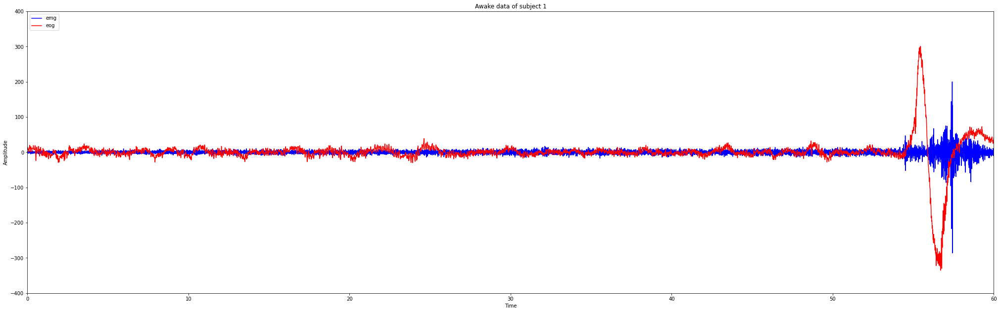

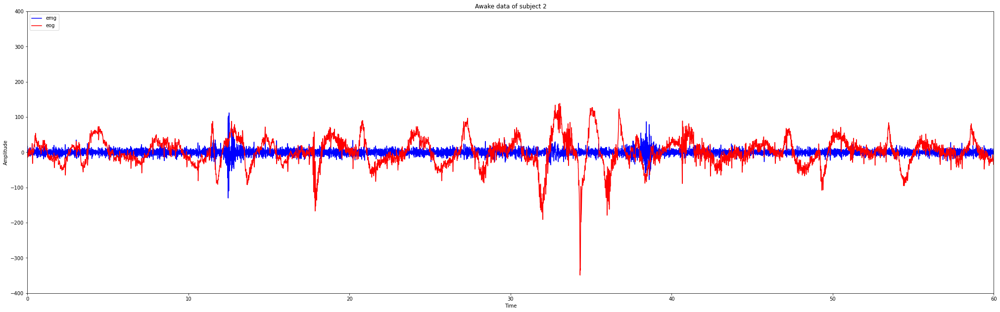

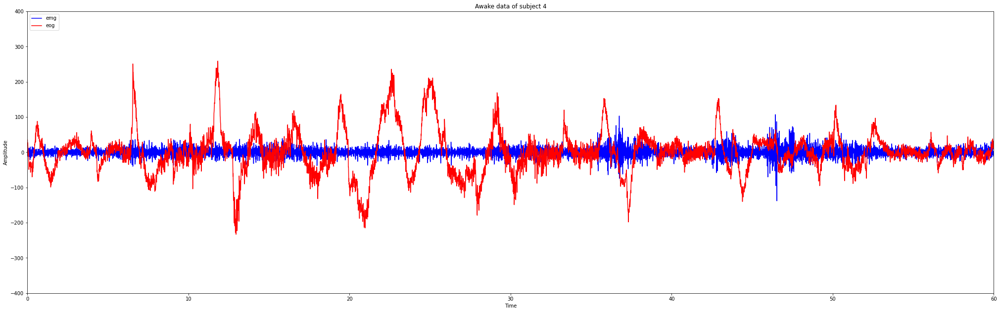

In [11]:
draw_figure_from_dual_raw_data(awake_data[0:-1], "Awake data of subject 1")

draw_figure_from_dual_raw_data(awake_data2[0:-1], "Awake data of subject 2")

draw_figure_from_dual_raw_data(awake_data3[0:-1], "Awake data of subject 4")


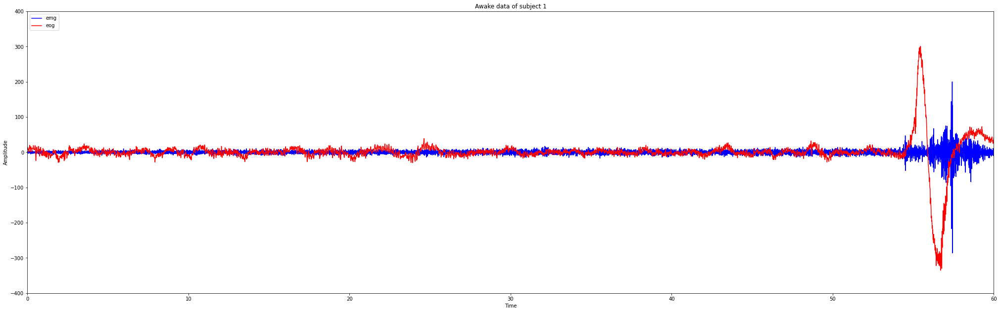

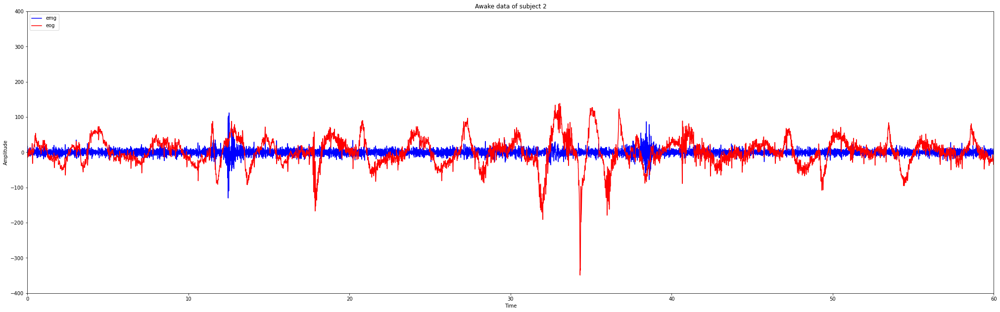

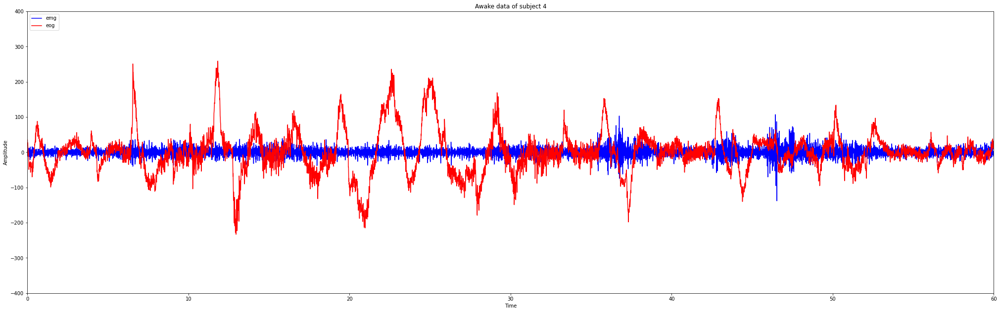

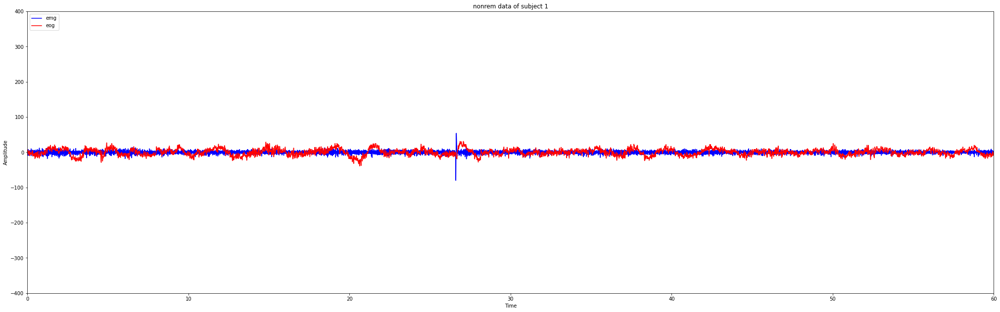

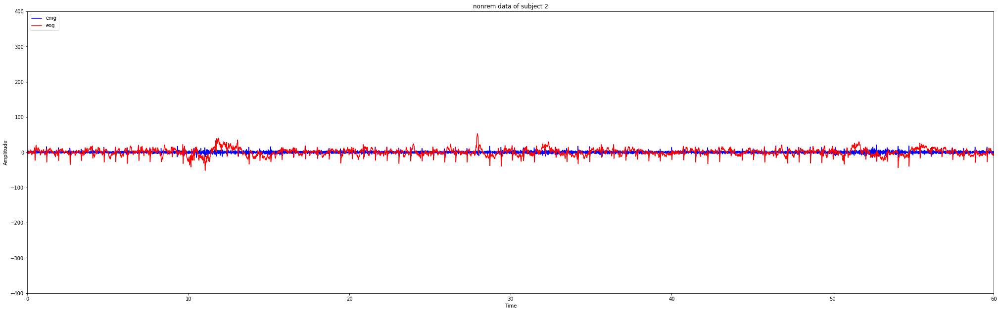

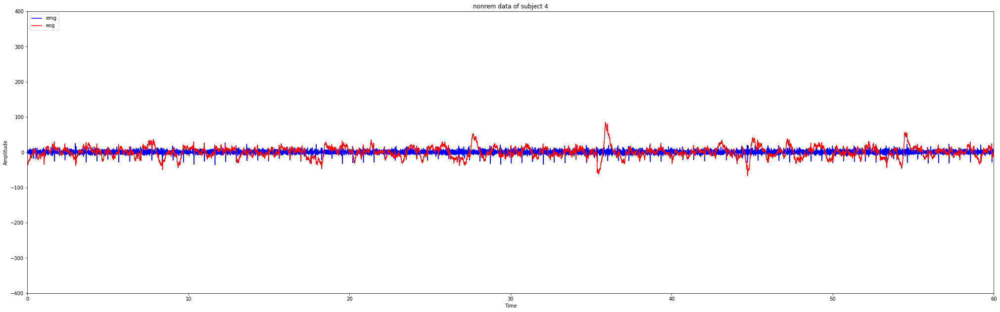

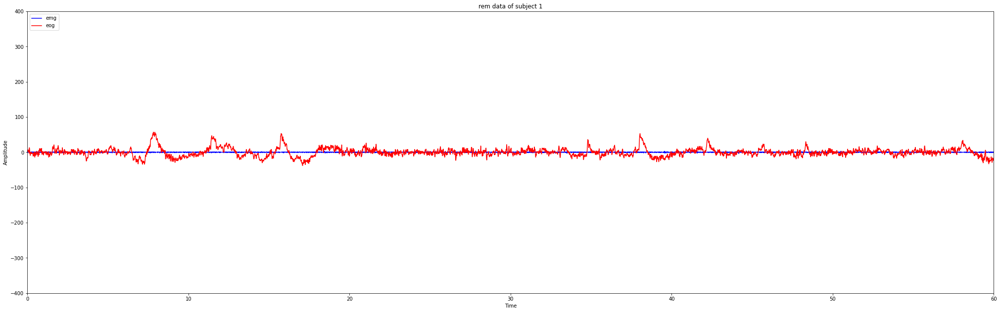

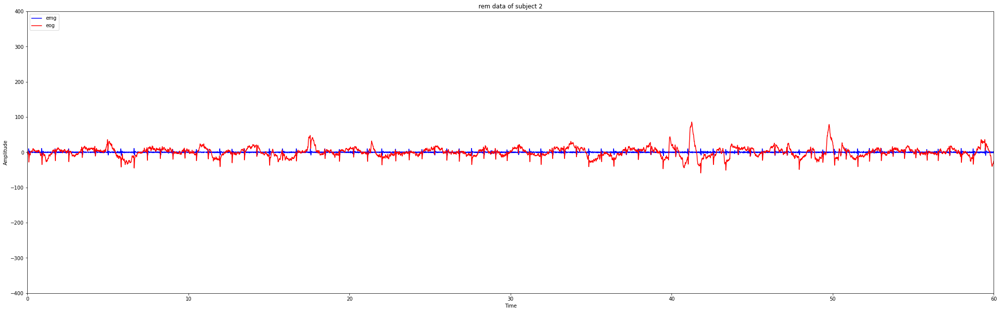

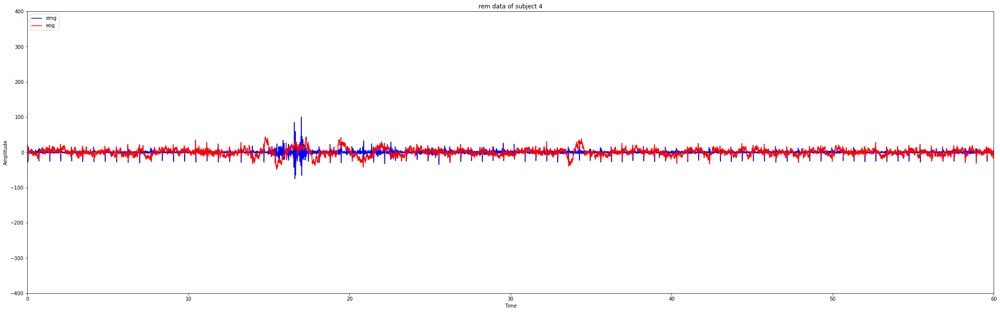

In [12]:
draw_figure_from_dual_raw_data(awake_data[0:-1], "Awake data of subject 1")

draw_figure_from_dual_raw_data(awake_data2[0:-1], "Awake data of subject 2")

draw_figure_from_dual_raw_data(awake_data3[0:-1], "Awake data of subject 4")

draw_figure_from_dual_raw_data(nonrem_data[0:-1], "nonrem data of subject 1")

draw_figure_from_dual_raw_data(nonrem_data2[0:-1], "nonrem data of subject 2")

draw_figure_from_dual_raw_data(nonrem_data3[0:-1], "nonrem data of subject 4")

draw_figure_from_dual_raw_data(rem_data[0:-1], "rem data of subject 1")

draw_figure_from_dual_raw_data(rem_data2[0:-1], "rem data of subject 2")

draw_figure_from_dual_raw_data(rem_data3[0:-1], "rem data of subject 4")

#Frequency domain inspection of the signals

Possible sources of noise:
* Ambient noise such as powerline interference
* ECG artifacts
* Motion artifacts i.e breathing and such



In [13]:
from scipy.fft import fft, fftfreq
import numpy as np

In [14]:

def plot_fourier_transform(data, title, fs=200,xlim=(0,100),ylim=(-1,1)):
  data=np.array(data[0:-1])
  N=len(data)
  yf = fft(data)
  #xf = fftfreq(N, 1 / fs)[:N//2]
  xf = fftfreq(N, 1 / fs)
  fig, axs = plt.subplots()
  fig.set_size_inches(18.5, 10.5)
  axs.set_title(title)
  #axs.plot(xf, 2/N*np.abs(yf[0:N//2]), color='C0')
  axs.plot(xf, 2/N*np.abs(yf), color='C0')
  axs.set_xlabel("Frequency")
  axs.set_ylabel("Amplitude")
  plt.xlim([xlim[0], xlim[1]]);
  plt.ylim([ylim[0], ylim[1]])
  plt.show()

##EMG frequency inspection


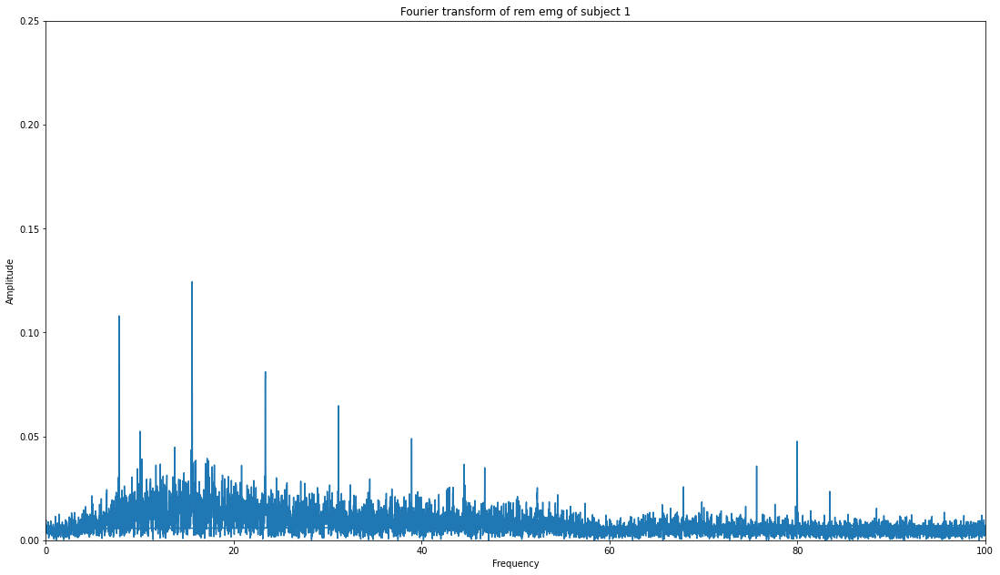

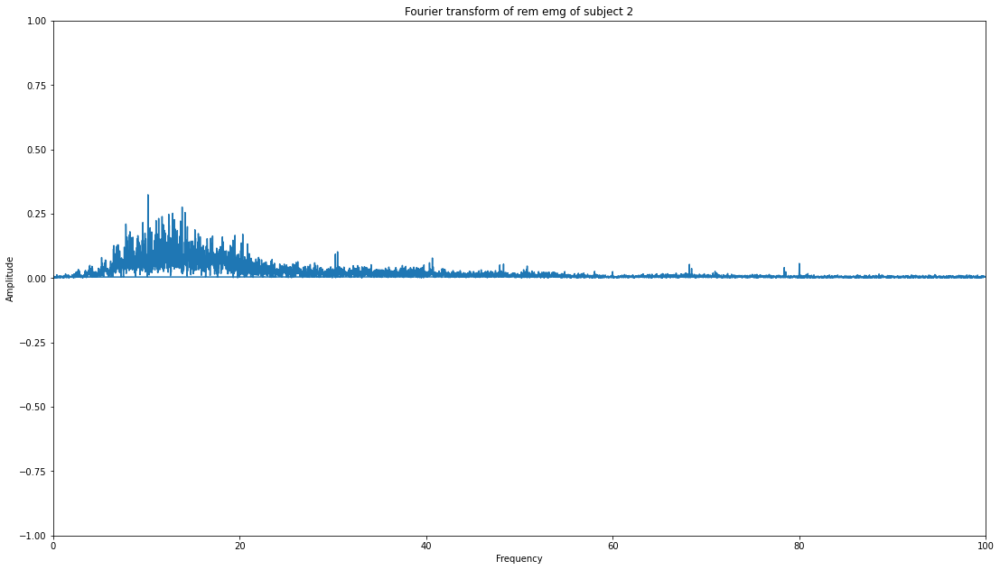

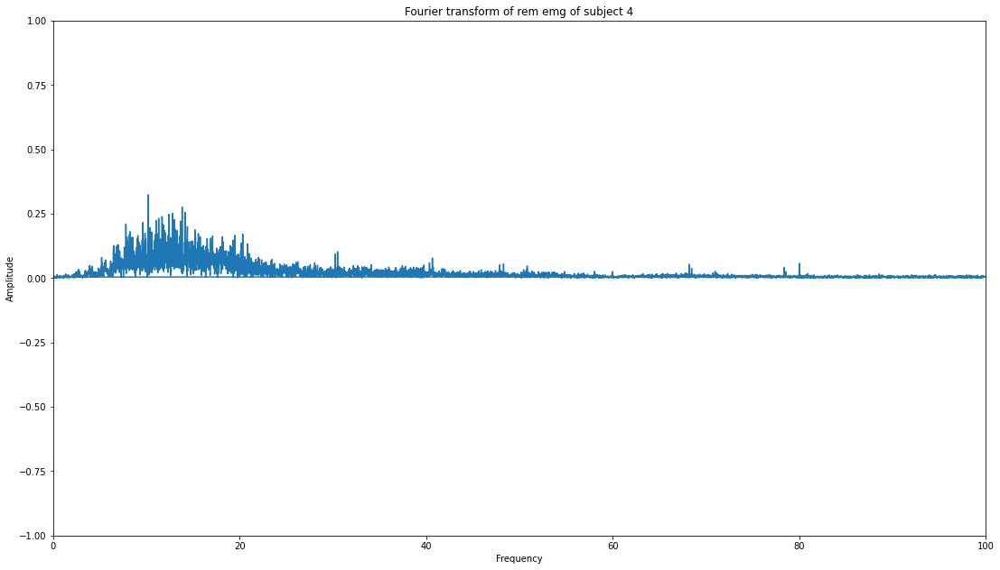

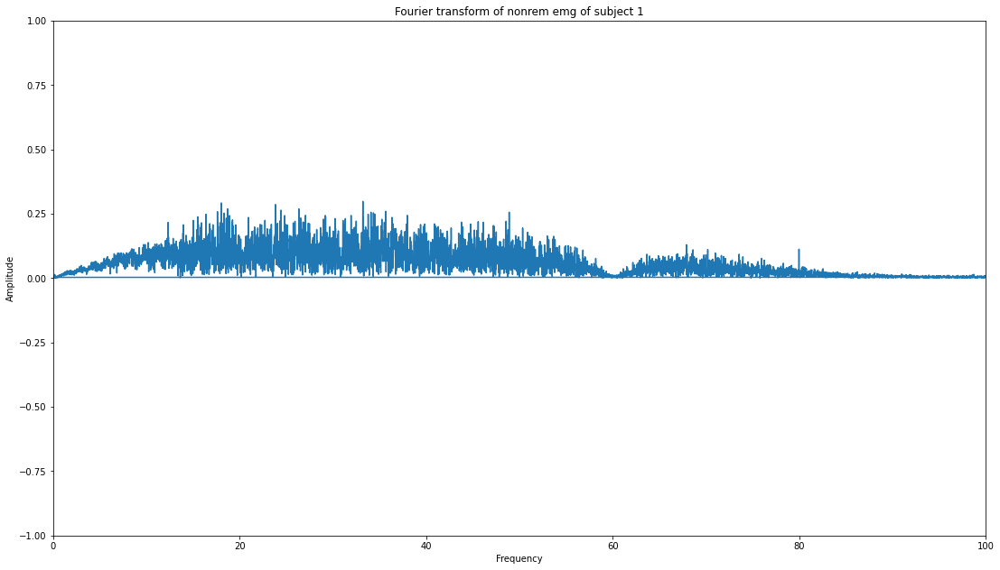

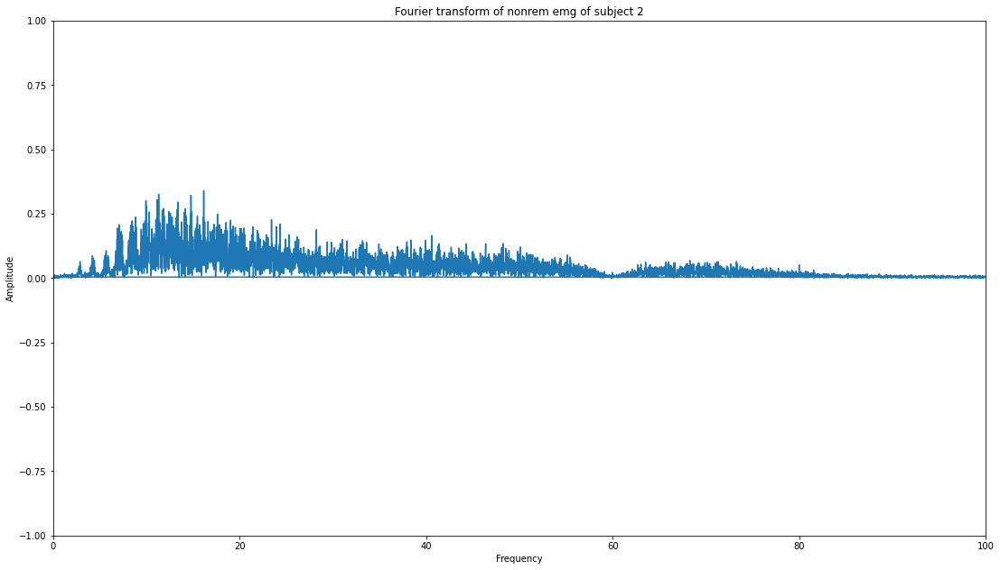

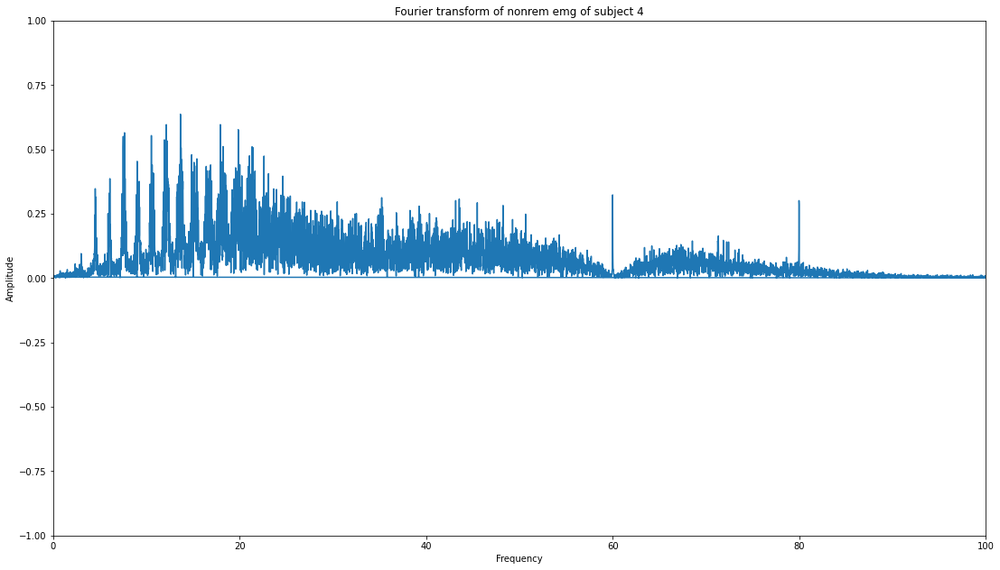

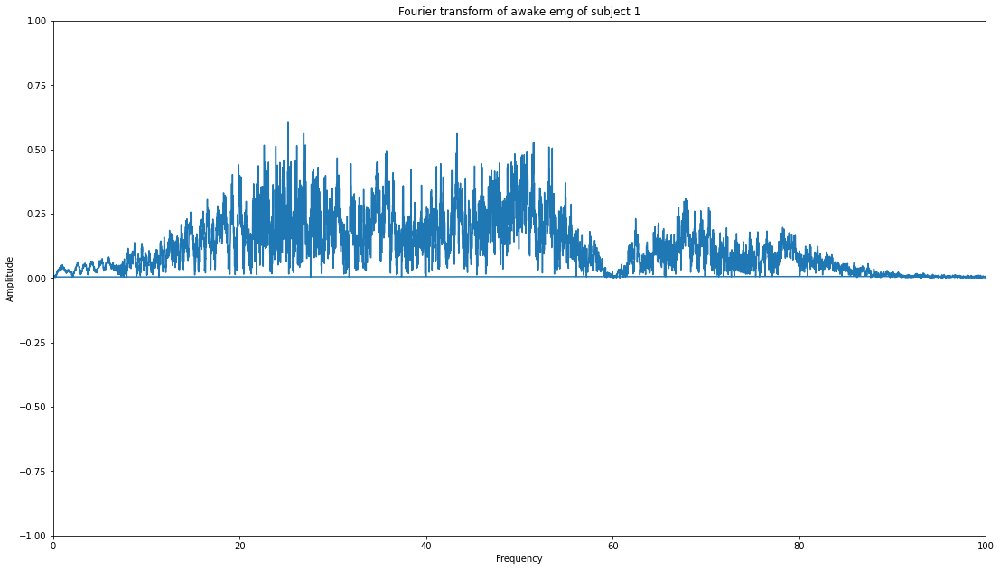

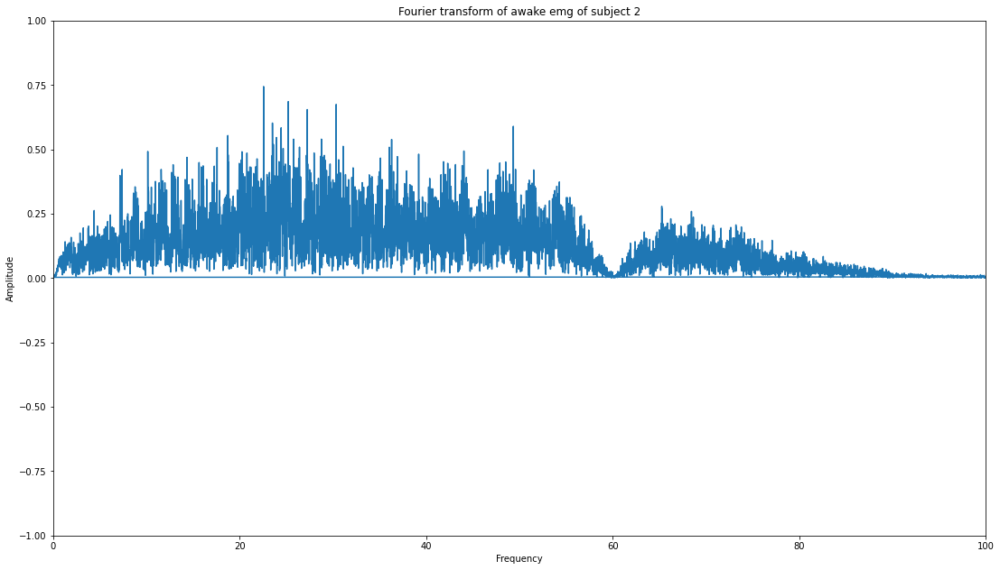

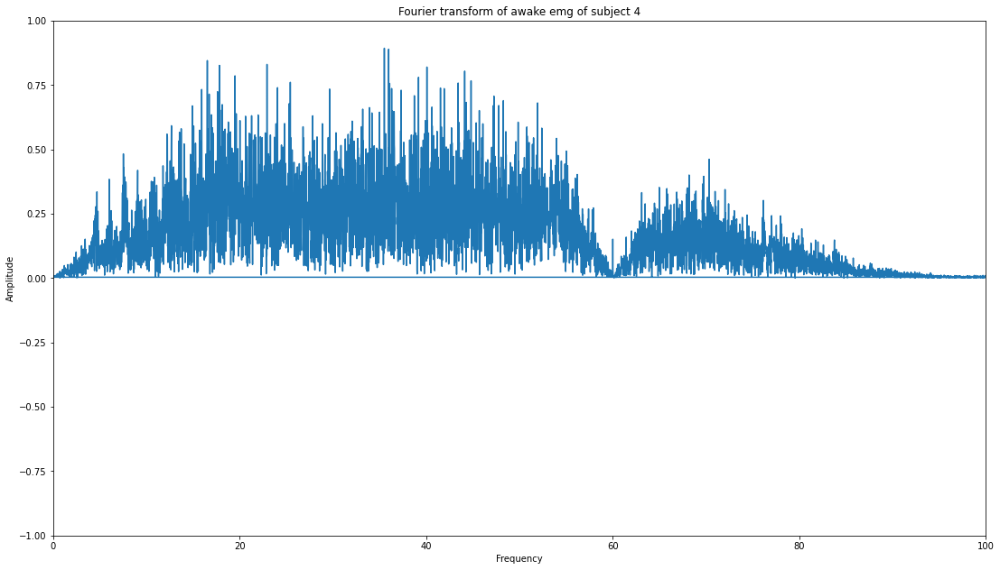

In [15]:
plot_fourier_transform(rem_data["emg"], "Fourier transform of rem emg of subject 1", fs=200,ylim=(0,0.25))
plot_fourier_transform(rem_data2["emg"], "Fourier transform of rem emg of subject 2", fs=200)
plot_fourier_transform(rem_data2["emg"], "Fourier transform of rem emg of subject 4", fs=200)
plot_fourier_transform(nonrem_data["emg"], "Fourier transform of nonrem emg of subject 1", fs=200)
plot_fourier_transform(nonrem_data2["emg"], "Fourier transform of nonrem emg of subject 2", fs=200)
plot_fourier_transform(nonrem_data3["emg"], "Fourier transform of nonrem emg of subject 4", fs=200)
plot_fourier_transform(awake_data["emg"], "Fourier transform of awake emg of subject 1", fs=200)
plot_fourier_transform(awake_data2["emg"], "Fourier transform of awake emg of subject 2", fs=200)
plot_fourier_transform(awake_data3["emg"], "Fourier transform of awake emg of subject 4", fs=200)

##EOG frequency inspection

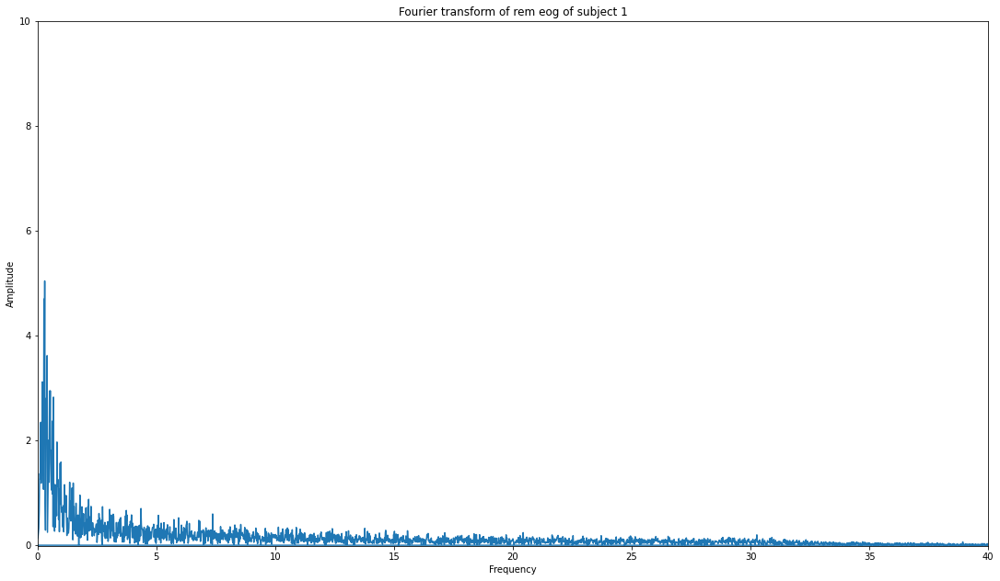

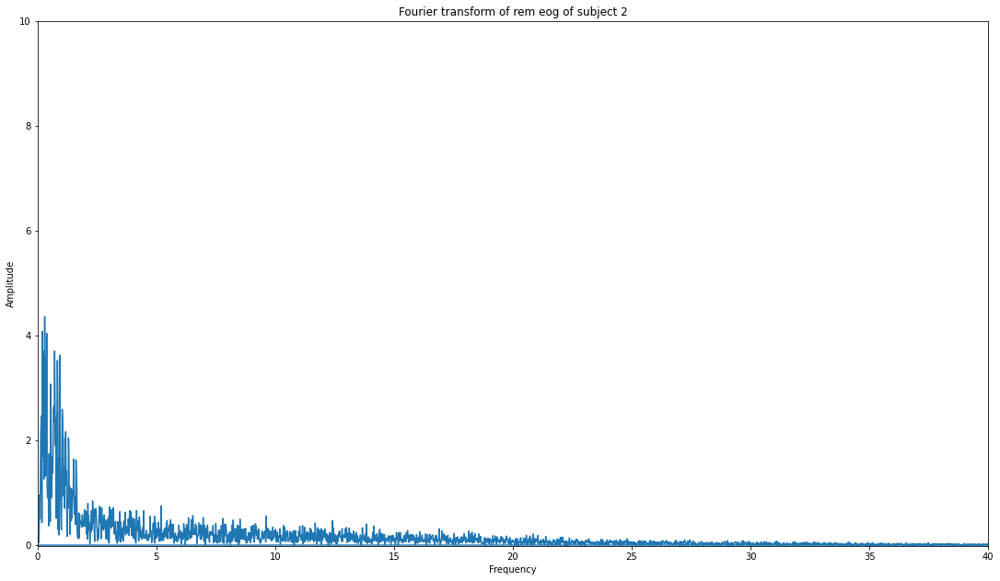

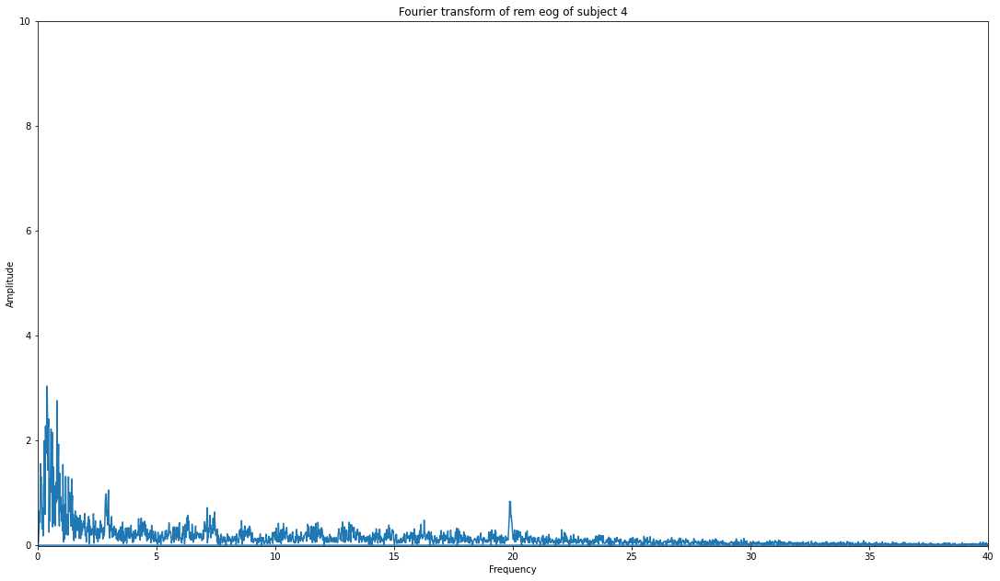

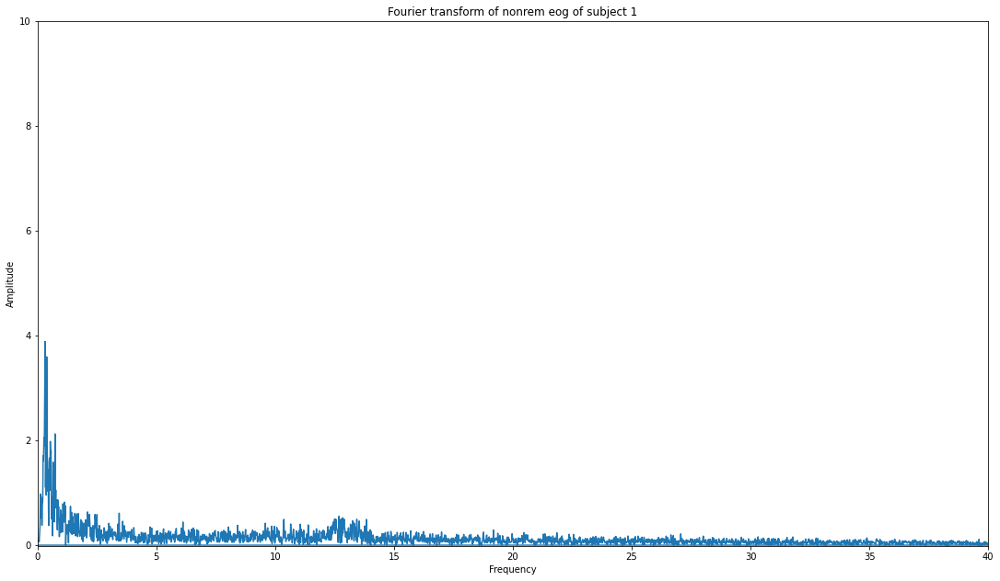

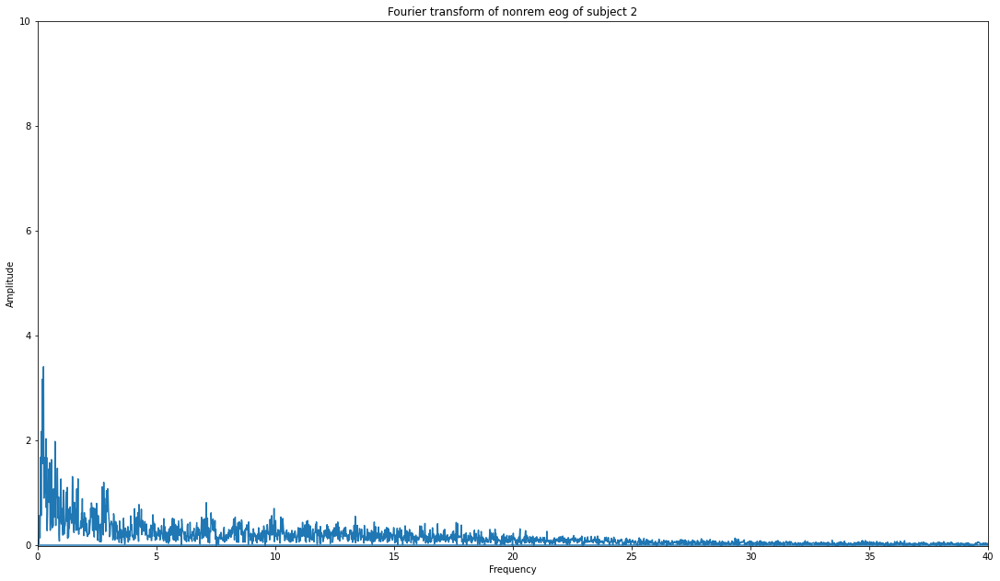

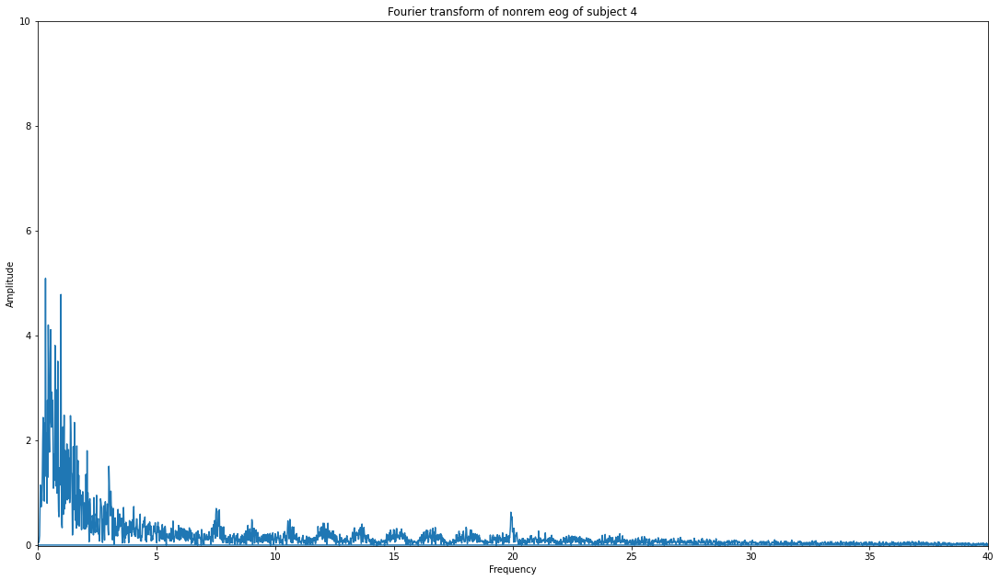

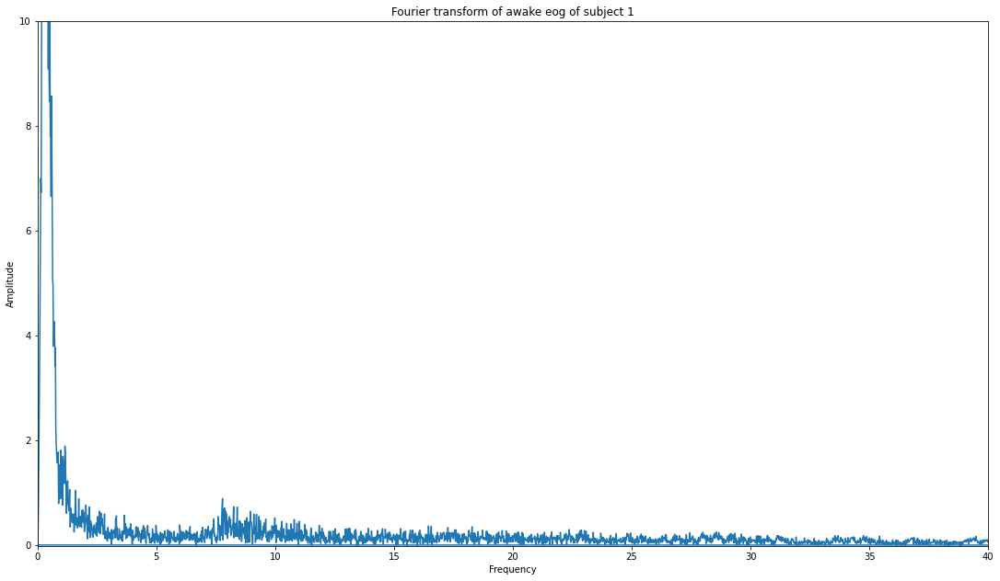

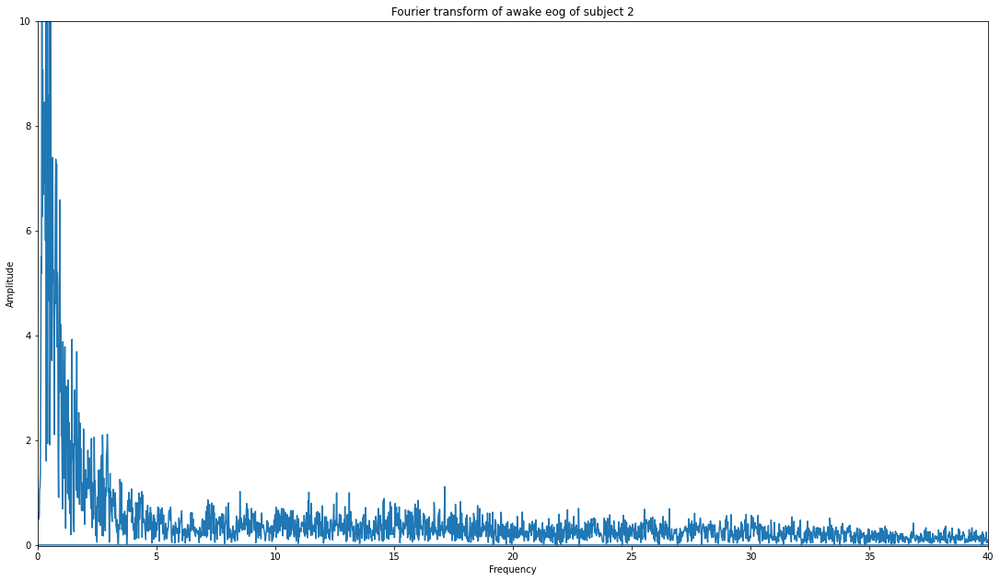

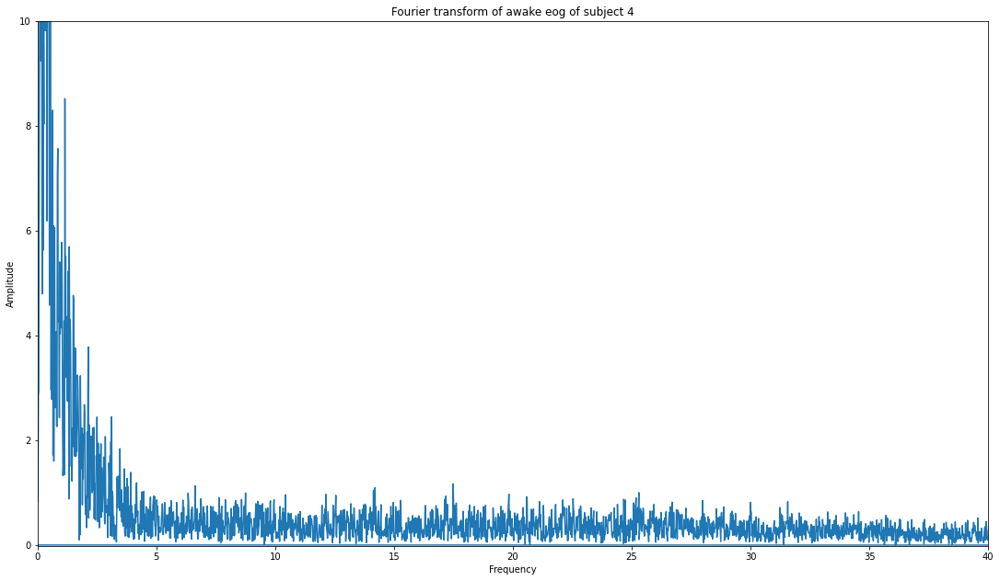

In [16]:
plot_fourier_transform(rem_data["eog"], "Fourier transform of rem eog of subject 1", fs=200,xlim=(0,40),ylim=(-0.01,10))
plot_fourier_transform(rem_data2["eog"], "Fourier transform of rem eog of subject 2", fs=200,xlim=(0,40),ylim=(-0.01,10))
plot_fourier_transform(rem_data3["eog"], "Fourier transform of rem eog of subject 4", fs=200,xlim=(0,40),ylim=(-0.01,10))
plot_fourier_transform(nonrem_data["eog"], "Fourier transform of nonrem eog of subject 1", fs=200,xlim=(0,40),ylim=(-0.01,10))
plot_fourier_transform(nonrem_data2["eog"], "Fourier transform of nonrem eog of subject 2", fs=200,xlim=(0,40),ylim=(-0.01,10))
plot_fourier_transform(nonrem_data3["eog"], "Fourier transform of nonrem eog of subject 4", fs=200,xlim=(0,40),ylim=(-0.01,10))
plot_fourier_transform(awake_data["eog"], "Fourier transform of awake eog of subject 1", fs=200,xlim=(0,40),ylim=(-0.01,10))
plot_fourier_transform(awake_data2["eog"], "Fourier transform of awake eog of subject 2", fs=200,xlim=(0,40),ylim=(-0.01,10))
plot_fourier_transform(awake_data3["eog"], "Fourier transform of awake eog of subject 4", fs=200,xlim=(0,40),ylim=(-0.01,10))

Power line interference in eog

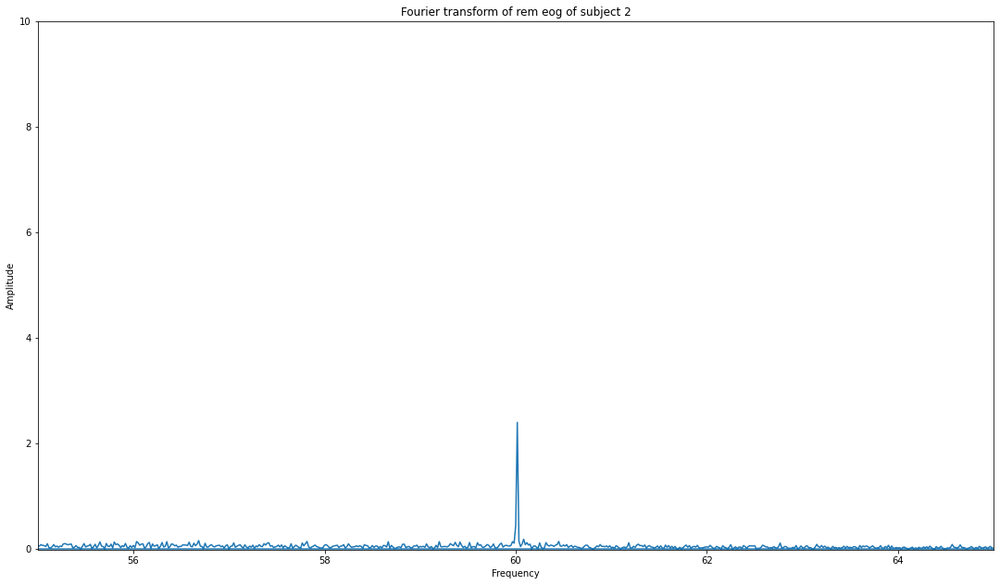

In [17]:
plot_fourier_transform(awake_data3["eog"], "Fourier transform of rem eog of subject 2", fs=200,xlim=(55,65),ylim=(-0.01,10))

#Discovered noise types
##EMG:
* ECG interference
* AWGN

##EOG:
* We can see a powerline interference affecting the eog signal. There is a spike in frequency domain at 60Hz.
* We can also see that the eog is affected by the ECG signal since there is a signal component causing distortions every second or so.
* AWGN

#Conclusions
There appears to be disrepancies in the data:
In emg samples the frequency component at 60 Hz has been flattened leading to a conclusion that the emg data has been filtered with 60Hz notch filter.

The same will have to be done to the EOG samples.

#Filtration to be done:
* highpass-filter with 0.1 Hz threshold to get rid of any baseline wondering. Then a notch filter to get rid of any remaining powerline interference.

###Designing the filters
Notch filter:

* notch fequency: 60 Hz 
* sampling frequency: 200 Hz
* Quality factor: 20

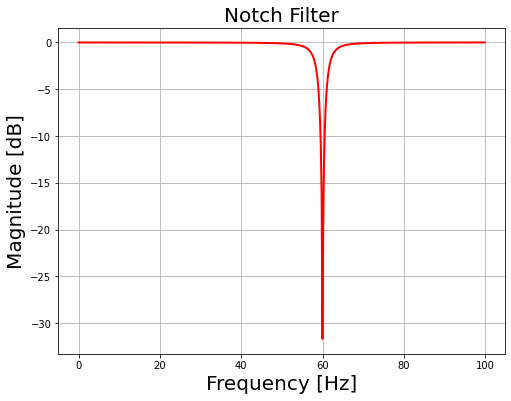

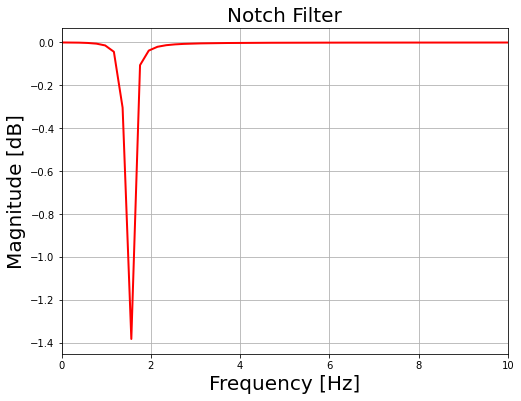

In [18]:
# Create/view notch filter
samp_freq = 200 # Sample frequency (Hz)
notch_freq = 60.0 # Frequency to be removed from signal (Hz)
quality_factor = 20.0 # Quality factor
# Design a notch filter using signal.iirnotch
# method that defines and returns a notch filter's nominator and denominators
def notch(notch_freq,quality_factor,samp_freq):
  b_notch, a_notch = sgnl.iirnotch(notch_freq, quality_factor, samp_freq)
  return b_notch, a_notch
#method that filters a signal with a notch filter
def notch_filter(data,fs=200,notch_freq=60,quality_factor=20):
  b_notch, a_notch = notch(notch_freq, quality_factor, fs)
  return(sgnl.filtfilt(b_notch, a_notch, data))


b_notch, a_notch = notch(notch_freq, quality_factor, samp_freq)
# Compute magnitude response of the designed filter
freq, h = sgnl.freqz(b_notch, a_notch, fs=samp_freq)

fig = plt.figure(figsize=(8, 6))
  
# Plot magnitude response of the filter
plt.plot(freq, 20 * np.log10(abs(h)),
         'r', label='Bandpass filter', linewidth='2')
  
plt.xlabel('Frequency [Hz]', fontsize=20)
plt.ylabel('Magnitude [dB]', fontsize=20)
plt.title('Notch Filter', fontsize=20)
plt.grid()

b_notch, a_notch = notch(notch_freq=1.5, quality_factor=quality_factor, samp_freq=200)
# Compute magnitude response of the designed filter
freq, h = sgnl.freqz(b_notch, a_notch, fs=samp_freq)

fig = plt.figure(figsize=(8, 6))
  
# Plot magnitude response of the filter
plt.plot(freq, 20 * np.log10(abs(h)),
         'r', label='Bandpass filter', linewidth='2')
  
plt.xlabel('Frequency [Hz]', fontsize=20)
plt.ylabel('Magnitude [dB]', fontsize=20)
plt.title('Notch Filter', fontsize=20)
plt.xlim(0,10)
plt.grid()

Designing the Highpass filter:
* Type: butterworth
* Order: 5
* Cutoff_freq: 0.1 Hz

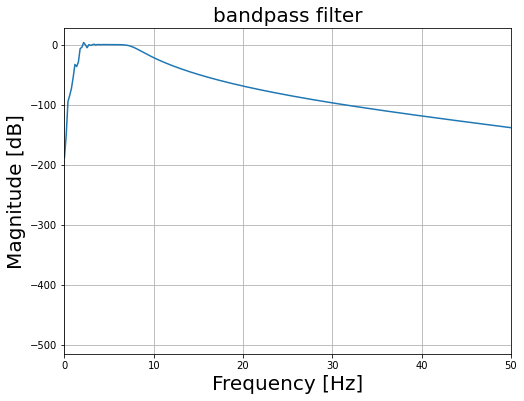

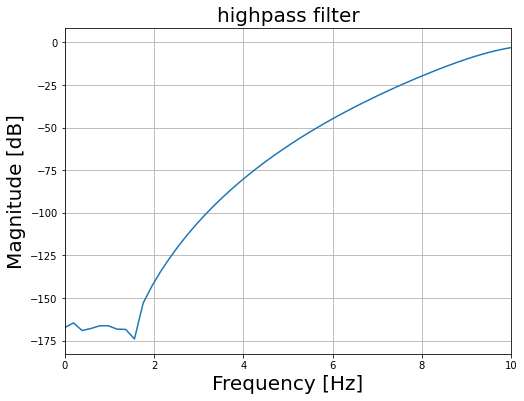

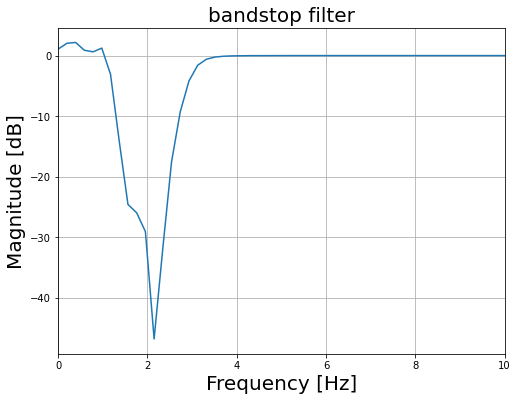

In [19]:
def butter_highpass(cutoff, fs=200, order=5):
    nyq = 0.5 * fs
    normal_cutoff = cutoff / nyq
    b, a = sgnl.butter(order, normal_cutoff, btype='high', analog=False)
    return b, a

def butter_highpass_filter(signal, cutoff=0.1, fs=200, order=5):
    b, a = butter_highpass(cutoff=cutoff, fs=fs, order=order)
    y = sgnl.filtfilt(b, a, signal)
    return y

def butter_lowpass(cutoff, fs=200, order=5):
    nyq = 0.5 * fs
    normal_cutoff = cutoff / nyq
    b, a = sgnl.butter(order, normal_cutoff, btype='low', analog=False)
    return b, a

def butter_lowpass_filter(signal, cutoff=0.1, fs=200, order=5):
    b, a = butter_lowpass(cutoff=cutoff, fs=fs, order=order)
    y = sgnl.filtfilt(b, a, signal)
    return y

def butter_bandpass(lowcut, highcut, fs, order=5):
    nyq = 0.5 * fs
    low = lowcut / nyq
    high = highcut / nyq
    b, a = sgnl.butter(order, [low, high], btype='band')
    return b, a


def butter_bandpass_filter(data, lowcut=1, highcut=7.5, fs=200, order=5):
    b, a = butter_bandpass(lowcut=lowcut, highcut=highcut, fs=fs, order=order)
    y = sgnl.filtfilt(b, a, data)
    return y

# Bandpass filter for emg
def butter_bandpass_filter_2(data, lowcut=20, highcut=80, fs=200, order=5):
    b, a = butter_bandpass(lowcut=lowcut, highcut=highcut, fs=fs, order=order)
    y = sgnl.filtfilt(b, a, data)
    # process EMG signal: rectify
    #emg_rectified = abs(y)
    return y
def butter_bandstop(lowcut,highcut,fs=200,order=5):
    nyq = 0.5 * fs
    low = lowcut / nyq
    high = highcut / nyq
    b, a = sgnl.butter(order, [low, high], btype='bandstop')
    return b,a

def butter_bandstop_filter(data, lowcut, highcut, fs=200, order=5):
        b,a=butter_bandstop(lowcut,highcut,fs,order)
        y = sgnl.filtfilt(b, a, data)
        return y

# Lowpass filter for emg
def butter_lowpass_filter_2(signal, cutoff=20, fs=200, order=5):
    b, a = butter_lowpass(cutoff=cutoff, fs=fs, order=order)
    y = sgnl.filtfilt(b, a, signal)
    #emg_rectified = abs(y)
    return y

#frequency responces
b_butter, a_butter = butter_bandpass(1,7.5,200,7)
# Compute magnitude response of the designed filter
freq, h = sgnl.freqz(b_butter, a_butter, fs=200)

fig = plt.figure(figsize=(8, 6))
  
# Plot magnitude response of the filter
plt.plot(freq, 20 * np.log10(abs(h)))
  
plt.xlabel('Frequency [Hz]', fontsize=20)
plt.ylabel('Magnitude [dB]', fontsize=20)
plt.title('bandpass filter', fontsize=20)
plt.xlim([0,50])
plt.grid()

b_butter, a_butter = butter_highpass(10,200,10)
# Compute magnitude response of the designed filter
freq, h = sgnl.freqz(b_butter, a_butter, fs=200)

fig = plt.figure(figsize=(8, 6))
  
# Plot magnitude response of the filter
plt.plot(freq, 20 * np.log10(abs(h)))
  
plt.xlabel('Frequency [Hz]', fontsize=20)
plt.ylabel('Magnitude [dB]', fontsize=20)
plt.title('highpass filter', fontsize=20)
plt.xlim([0,10])
plt.grid()

b_butter, a_butter = butter_bandstop(1,3,200,5)
# Compute magnitude response of the designed filter
freq, h = sgnl.freqz(b_butter, a_butter, fs=200)

fig = plt.figure(figsize=(8, 6))
  
# Plot magnitude response of the filter
plt.plot(freq, 20 * np.log10(abs(h)))
  
plt.xlabel('Frequency [Hz]', fontsize=20)
plt.ylabel('Magnitude [dB]', fontsize=20)
plt.title('bandstop filter', fontsize=20)
plt.xlim([0,10])
plt.grid()

In [21]:
def filter_emg_signal(signal, fs=200):
  notched_signal=notch_filter(signal,fs=fs)
  #notched_signal=notch_filter(notched_signal,fs=fs, notch_freq=1.5)
  #filtered_signal=butter_bandstop_filter(notched_signal,1,3,fs=fs,order=5)
  filtered_signal=butter_bandstop_filter(notched_signal,lowcut=5, highcut=30, fs=200, order=6)
  return filtered_signal
  #return notched_signal
def filter_eog_signal(signal,fs=200):
  filtered_signal=butter_lowpass_filter(signal,cutoff=8,fs=fs)
  return filtered_signal

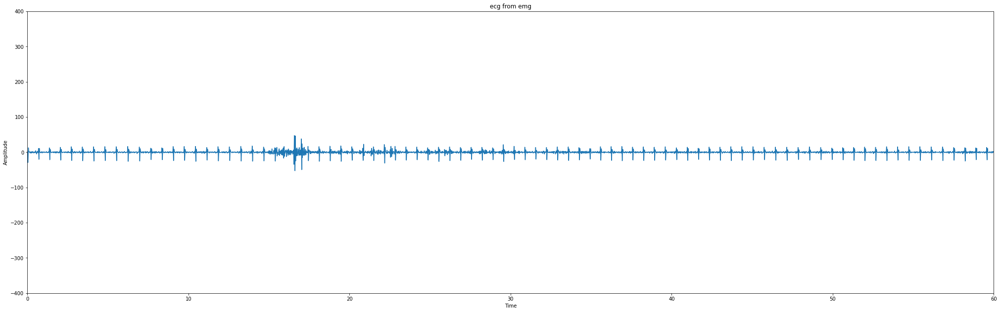

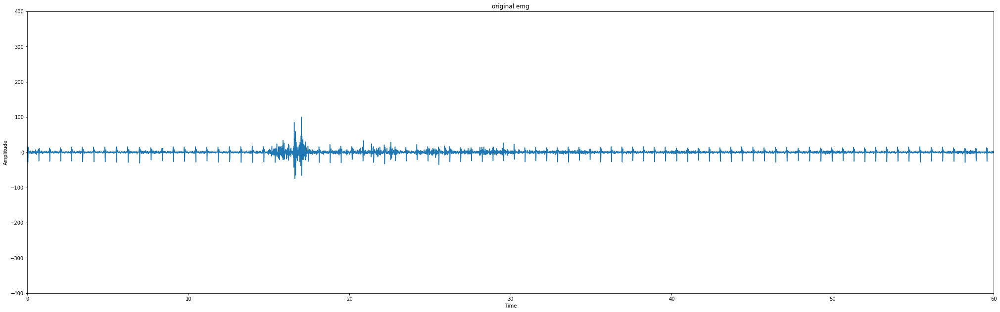

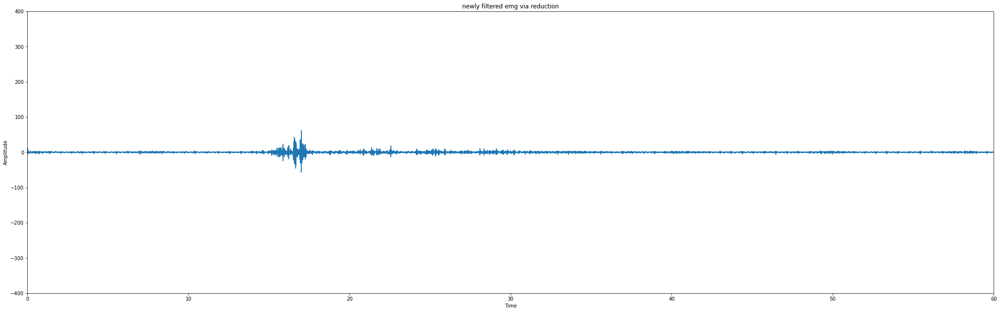

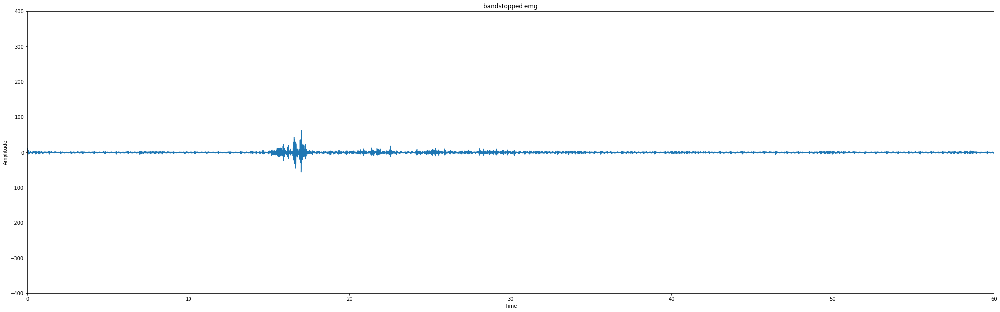

In [22]:
ecg_from_emg={"eog":filter_eog_signal(rem_data3["eog"][0:-1]),"emg":butter_bandpass_filter(rem_data3["emg"][0:-1],lowcut=5, highcut=30, fs=200, order=6)}
draw_figure_from_raw_data(ecg_from_emg["emg"], "ecg from emg",ylim=(-400,400))
draw_figure_from_raw_data(rem_data3["emg"], "original emg",ylim=(-400,400))
def reduce(listA,listB):
  new_list=[]
  for itema,itemb in zip(listA,listB):
    new_list.append(itema-itemb)
  return new_list
reduction = reduce(rem_data3["emg"][0:-1],ecg_from_emg["emg"])
draw_figure_from_raw_data(reduction, "newly filtered emg via reduction",ylim=(-400,400))

filtered_awake_emg=butter_bandstop_filter(rem_data3["emg"][0:-1],lowcut=5, highcut=30, fs=200, order=6)
draw_figure_from_raw_data(filtered_awake_emg, "bandstopped emg",ylim=(-400,400))

In [23]:
filtered_awake_data={"eog":filter_eog_signal(awake_data["eog"][0:-1]),"emg":filter_emg_signal(awake_data["emg"][0:-1])}
filtered_awake_data2={"eog":filter_eog_signal(awake_data2["eog"][0:-1]),"emg":filter_emg_signal(awake_data2["emg"][0:-1])}
filtered_awake_data3={"eog":filter_eog_signal(awake_data3["eog"][0:-1]),"emg":filter_emg_signal(awake_data3["emg"][0:-1])}
filtered_nonrem_data={"eog":filter_eog_signal(nonrem_data["eog"][0:-1]),"emg":filter_emg_signal(nonrem_data["emg"][0:-1])}
filtered_nonrem_data2={"eog":filter_eog_signal(nonrem_data2["eog"][0:-1]),"emg":filter_emg_signal(nonrem_data2["emg"][0:-1])}
filtered_nonrem_data3={"eog":filter_eog_signal(nonrem_data3["eog"][0:-1]),"emg":filter_emg_signal(nonrem_data3["emg"][0:-1])}
filtered_rem_data={"eog":filter_eog_signal(rem_data["eog"][0:-1]),"emg":filter_emg_signal(rem_data["emg"][0:-1])}
filtered_rem_data2={"eog":filter_eog_signal(rem_data2["eog"][0:-1]),"emg":filter_emg_signal(rem_data2["emg"][0:-1])}
filtered_rem_data3={"eog":filter_eog_signal(rem_data3["eog"][0:-1]),"emg":filter_emg_signal(rem_data3["emg"][0:-1])}


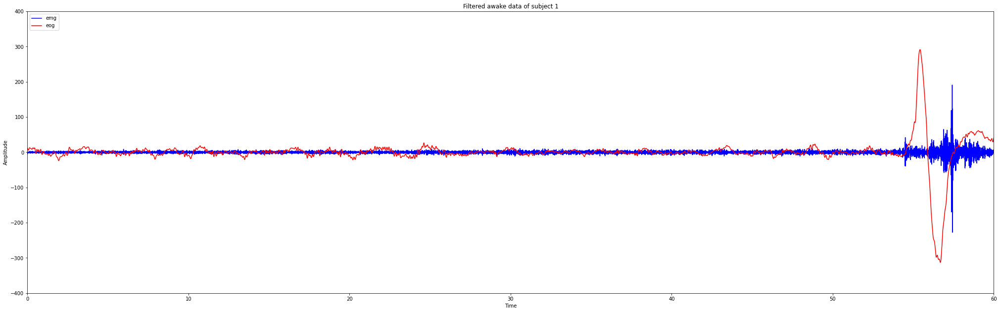

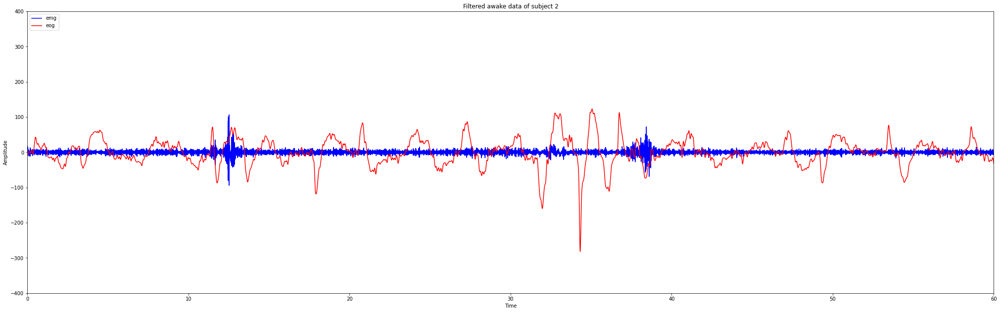

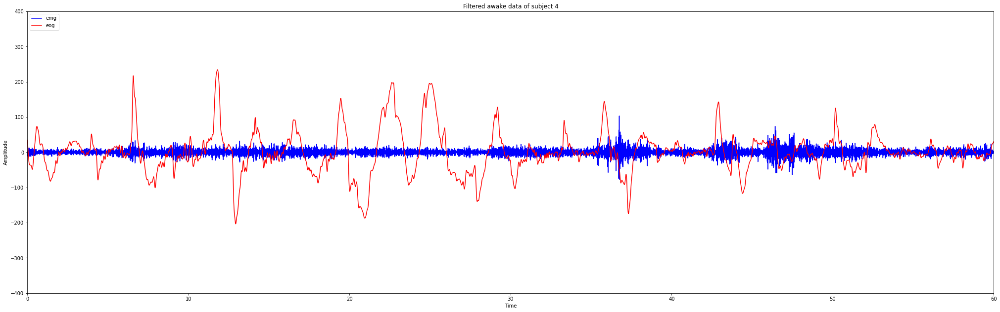

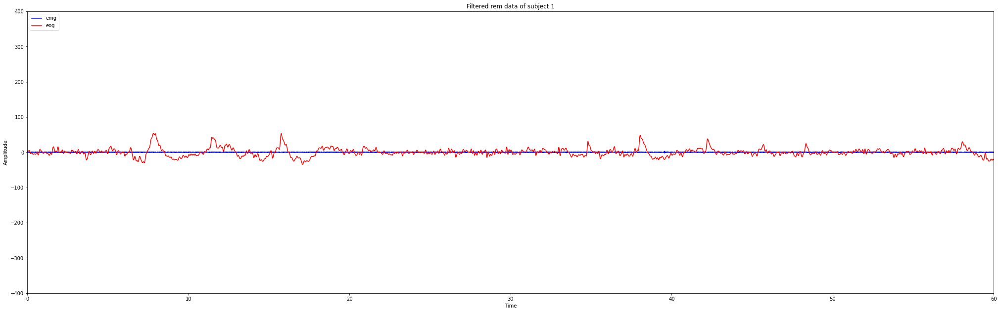

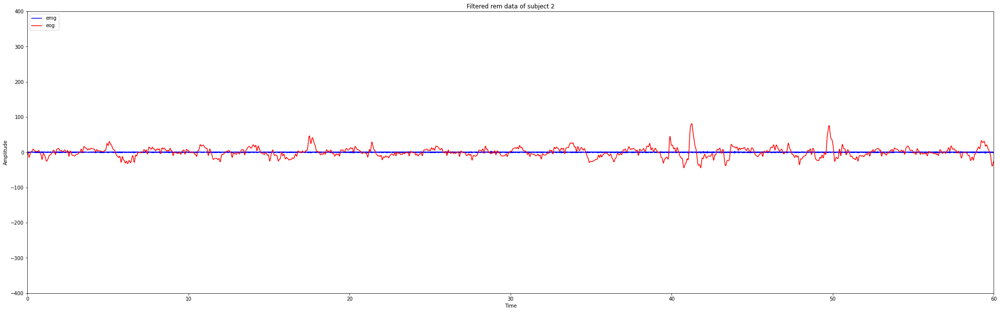

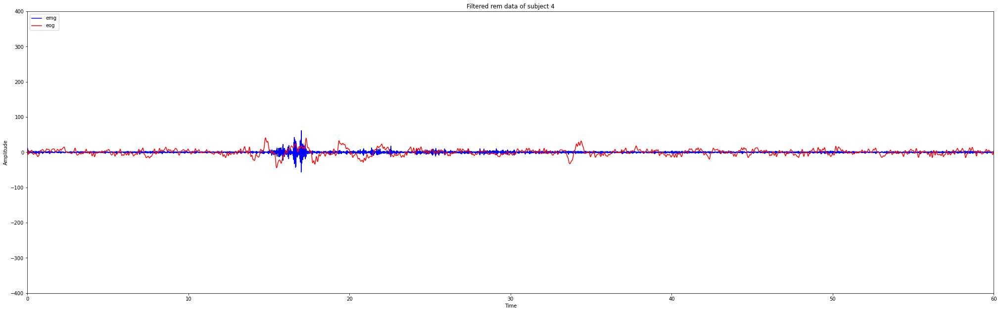

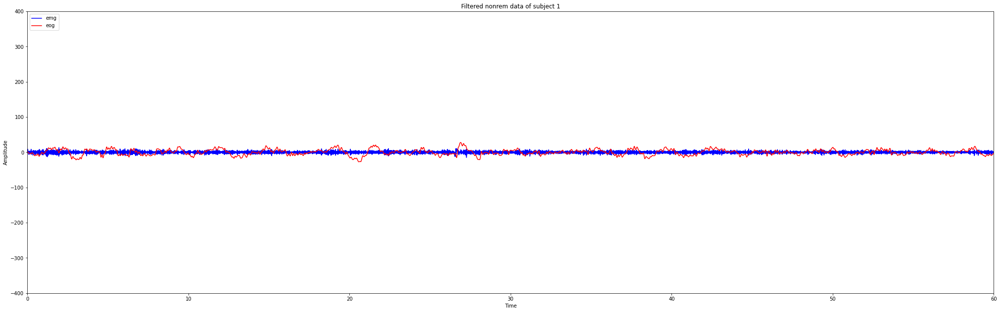

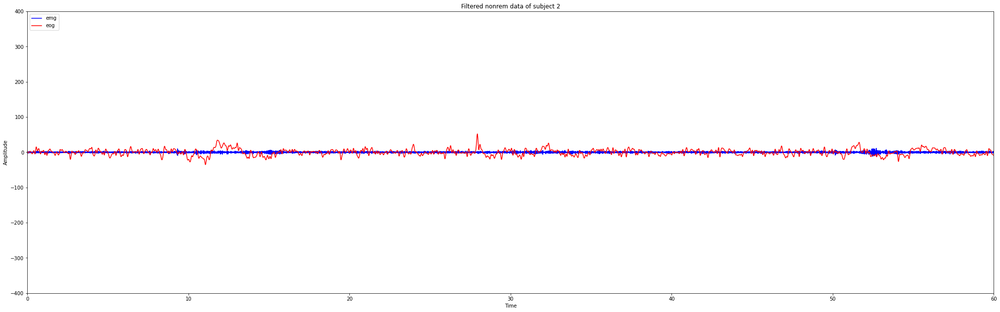

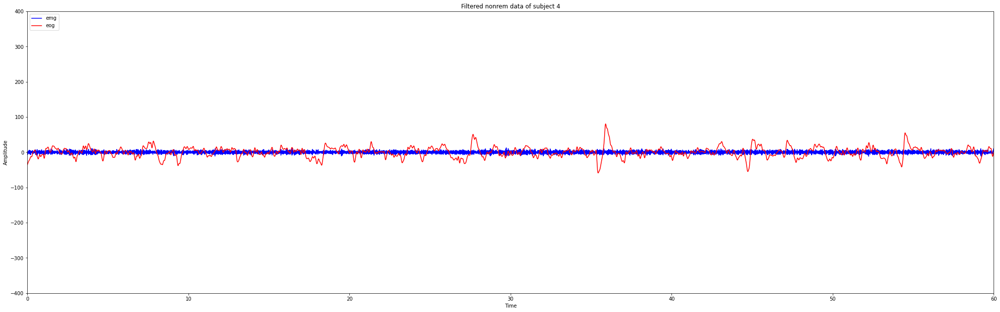

In [24]:
draw_figure_from_dual_raw_data(filtered_awake_data, "Filtered awake data of subject 1", )
draw_figure_from_dual_raw_data(filtered_awake_data2, "Filtered awake data of subject 2")
draw_figure_from_dual_raw_data(filtered_awake_data3, "Filtered awake data of subject 4")
draw_figure_from_dual_raw_data(filtered_rem_data, "Filtered rem data of subject 1")
draw_figure_from_dual_raw_data(filtered_rem_data2, "Filtered rem data of subject 2")
draw_figure_from_dual_raw_data(filtered_rem_data3, "Filtered rem data of subject 4")
draw_figure_from_dual_raw_data(filtered_nonrem_data, "Filtered nonrem data of subject 1")
draw_figure_from_dual_raw_data(filtered_nonrem_data2, "Filtered nonrem data of subject 2")
draw_figure_from_dual_raw_data(filtered_nonrem_data3, "Filtered nonrem data of subject 4")


12000


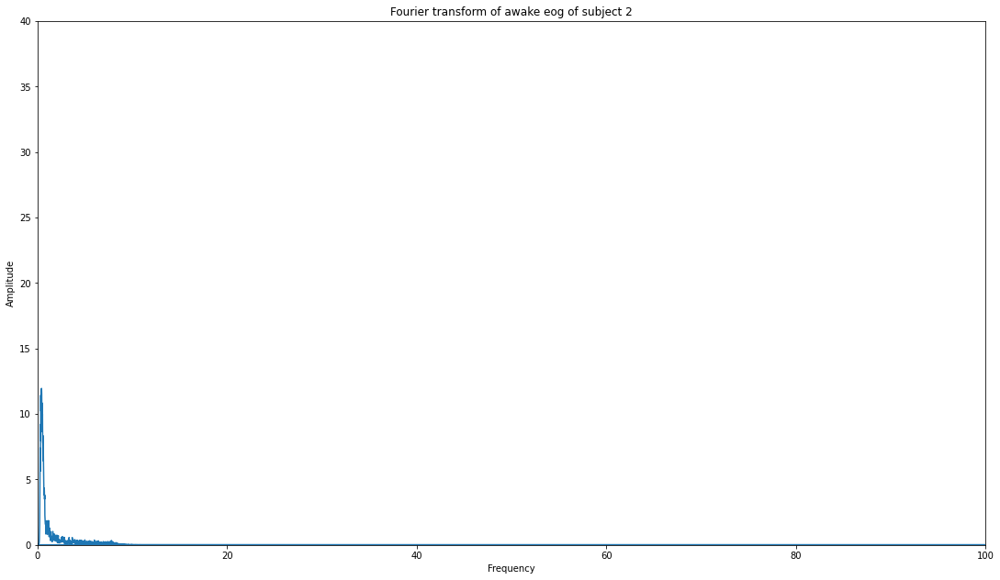

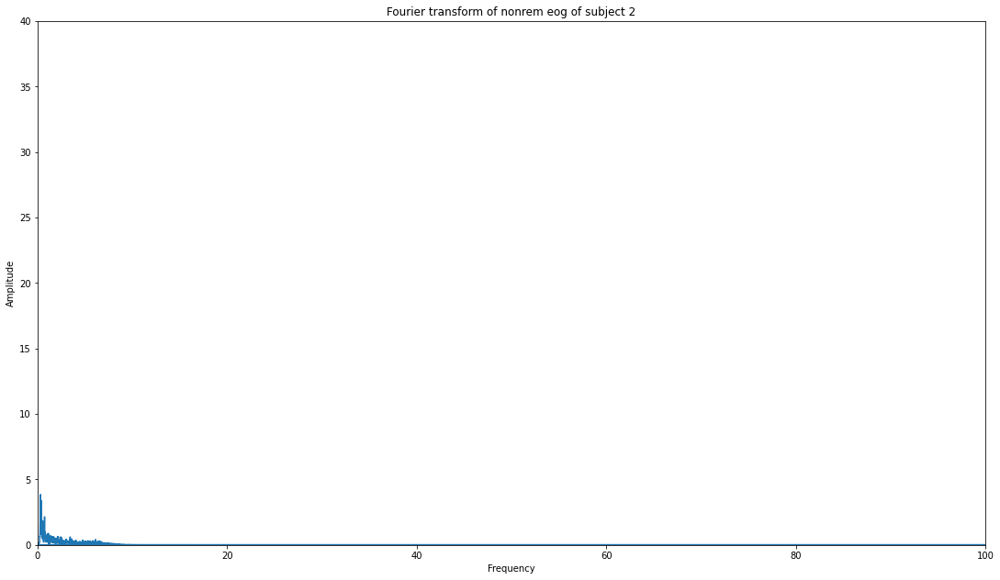

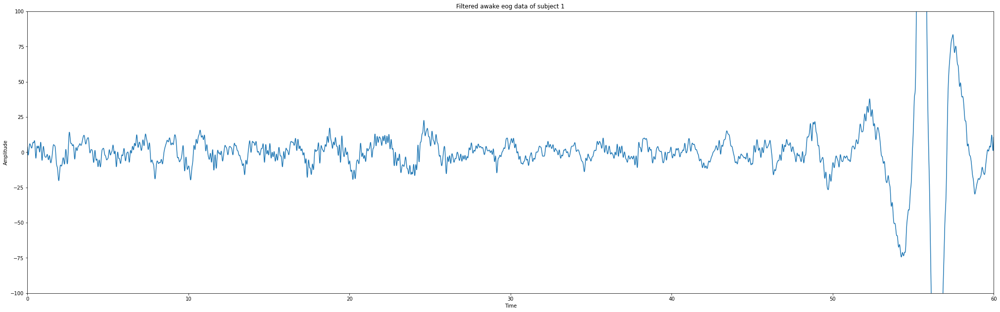

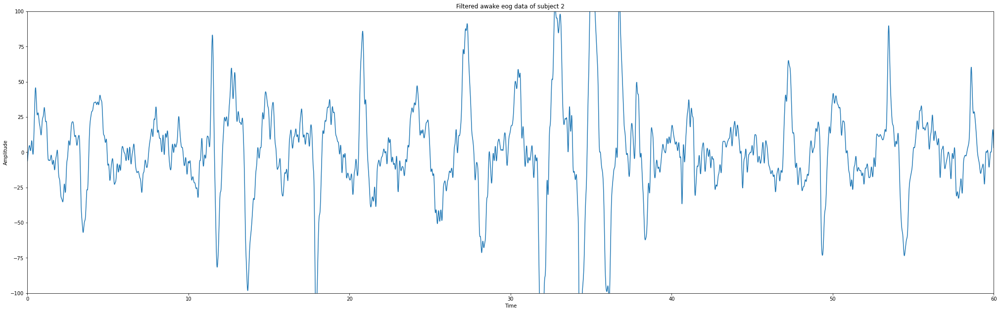

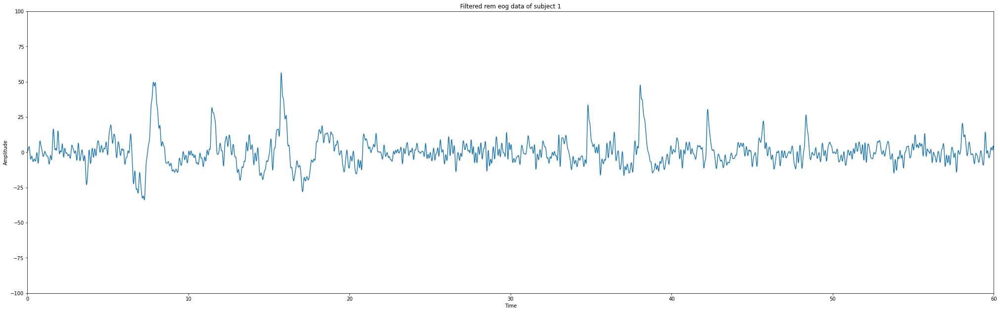

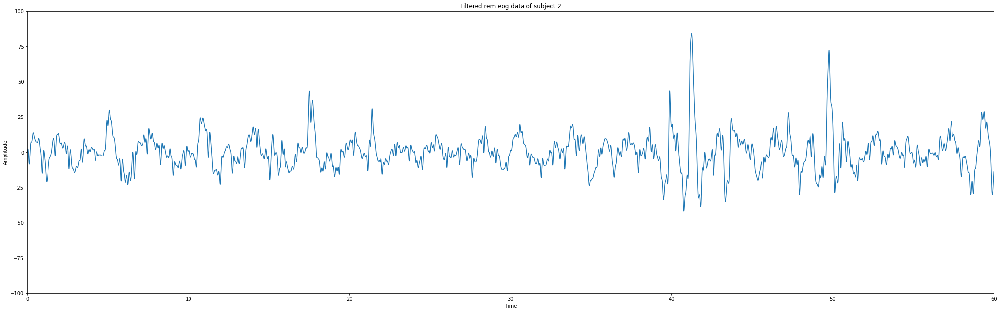

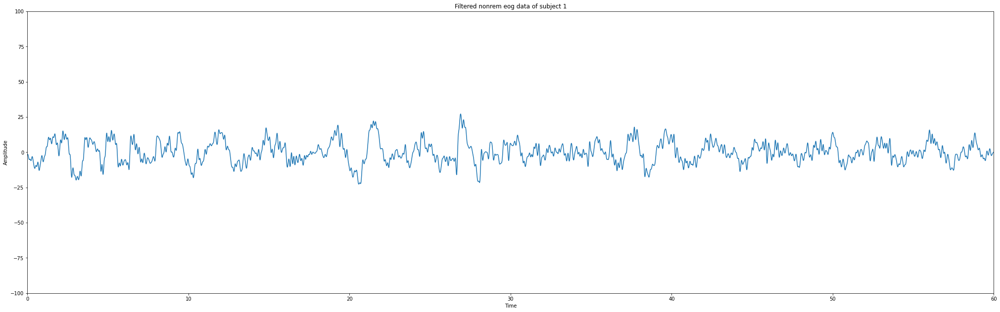

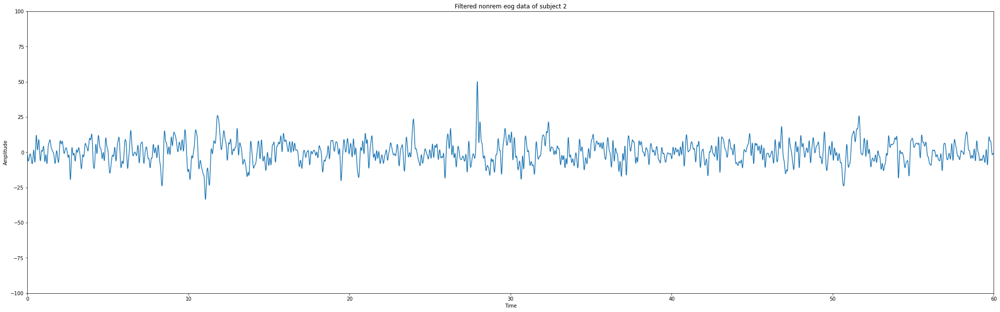

In [25]:

filtered_awake_eog_data=nk.eog_clean(awake_data["eog"][0:-1], sampling_rate=200, method='neurokit')
filtered_awake_eog_data2=nk.eog_clean(awake_data2["eog"][0:-1], sampling_rate=200, method='neurokit')
filtered_nonrem_eog_data=nk.eog_clean(nonrem_data["eog"][0:-1], sampling_rate=200, method='neurokit')
filtered_nonrem_eog_data2=nk.eog_clean(nonrem_data2["eog"][0:-1], sampling_rate=200, method='neurokit')
filtered_rem_eog_data=nk.eog_clean(rem_data["eog"][0:-1], sampling_rate=200, method='neurokit')
filtered_rem_eog_data2=nk.eog_clean(rem_data2["eog"][0:-1], sampling_rate=200, method='neurokit')
print(len(filtered_awake_eog_data))
plot_fourier_transform(filtered_awake_eog_data, "Fourier transform of awake eog of subject 2", fs=200,xlim=(0,100),ylim=(-0.01,40))
plot_fourier_transform(filtered_nonrem_eog_data, "Fourier transform of nonrem eog of subject 2", fs=200,xlim=(0,100),ylim=(-0.01,40))
draw_figure_from_raw_data(filtered_awake_eog_data, "Filtered awake eog data of subject 1", xlim=(0,60),ylim=(-100,100))
draw_figure_from_raw_data(filtered_awake_eog_data2, "Filtered awake eog data of subject 2", xlim=(0,60),ylim=(-100,100))
draw_figure_from_raw_data(filtered_rem_eog_data, "Filtered rem eog data of subject 1", xlim=(0,60),ylim=(-100,100))
draw_figure_from_raw_data(filtered_rem_eog_data2, "Filtered rem eog data of subject 2", xlim=(0,60),ylim=(-100,100))
draw_figure_from_raw_data(filtered_nonrem_eog_data, "Filtered nonrem eog data of subject 1", xlim=(0,60),ylim=(-100,100))
draw_figure_from_raw_data(filtered_nonrem_eog_data2, "Filtered nonrem eog data of subject 2", xlim=(0,60),ylim=(-100,100))

12000


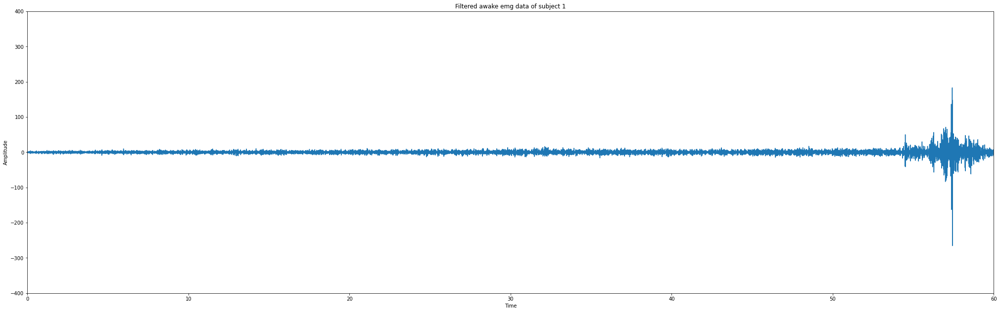

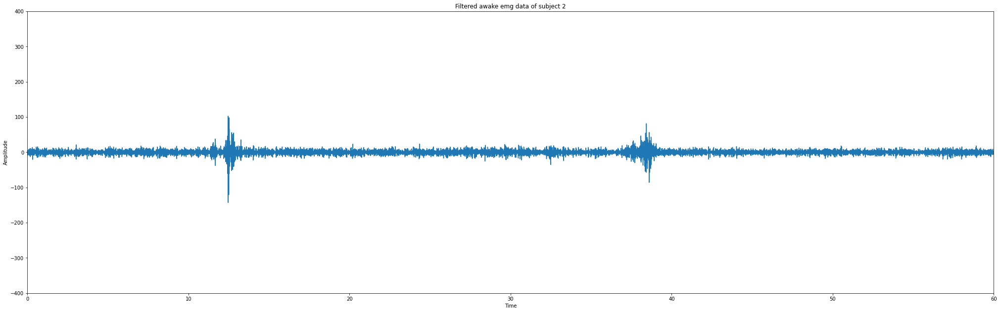

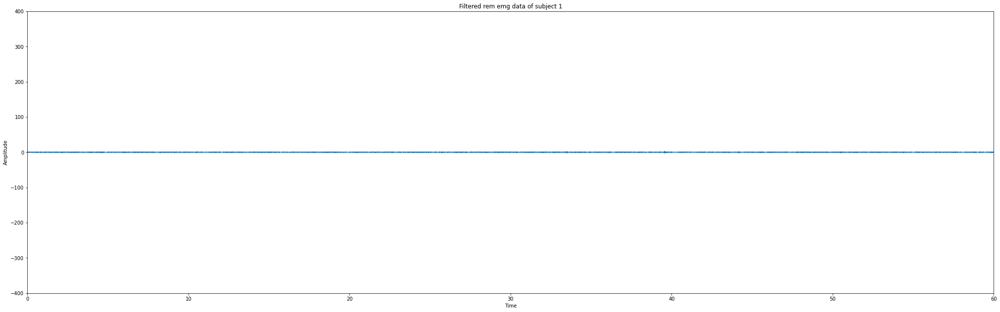

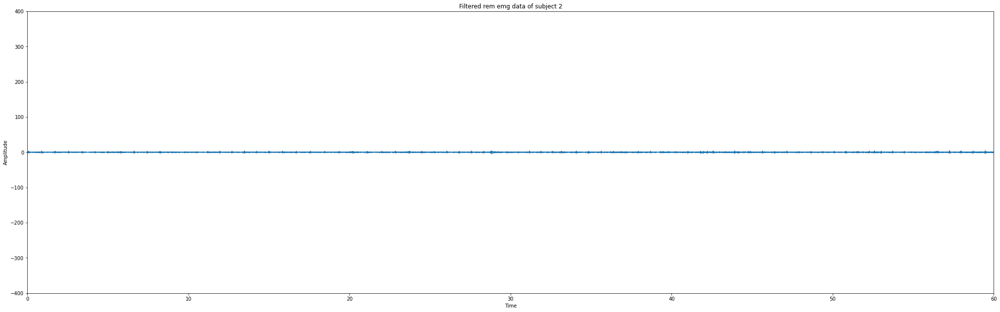

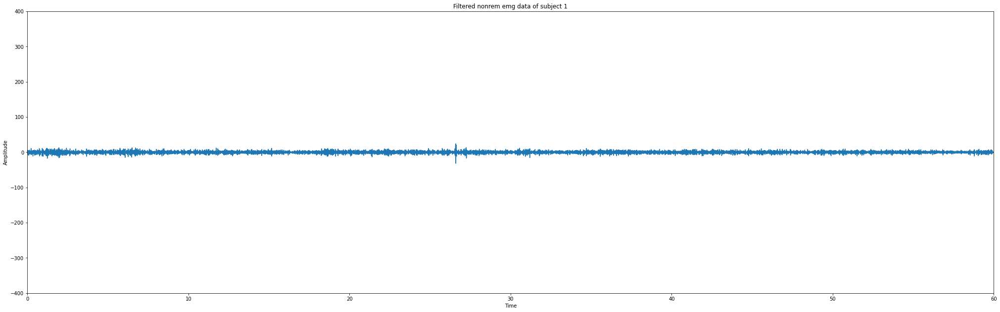

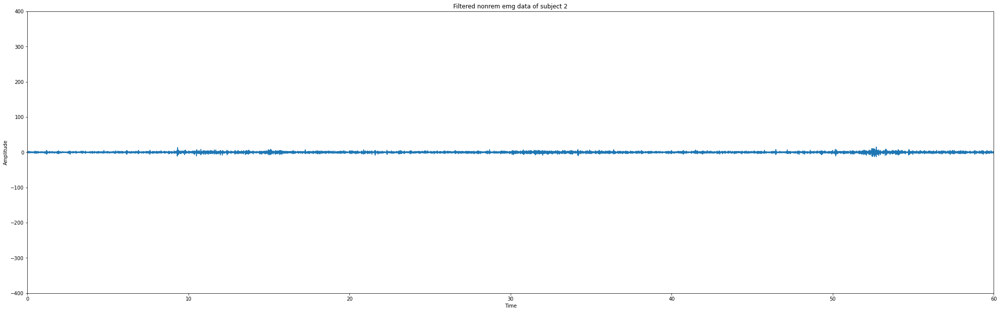

In [28]:
# Emg filtering for awake, nonrem and rem
filtered_awake_emg_data=butter_bandpass_filter_2(awake_data["emg"][0:-1],fs=200)
filtered_awake_emg_data2=butter_bandpass_filter_2(awake_data2["emg"][0:-1],fs=200)
filtered_nonrem_emg_data=butter_bandpass_filter_2(nonrem_data["emg"][0:-1],fs=200)
filtered_nonrem_emg_data2=butter_bandpass_filter_2(nonrem_data2["emg"][0:-1],fs=200)
filtered_rem_emg_data=butter_bandpass_filter_2(rem_data["emg"][0:-1],fs=200)
filtered_rem_emg_data2=butter_bandpass_filter_2(rem_data2["emg"][0:-1],fs=200)
print(len(filtered_awake_emg_data))

draw_figure_from_raw_data(filtered_awake_emg_data, "Filtered awake emg data of subject 1")
draw_figure_from_raw_data(filtered_awake_emg_data2, "Filtered awake emg data of subject 2")
draw_figure_from_raw_data(filtered_rem_emg_data, "Filtered rem emg data of subject 1")
draw_figure_from_raw_data(filtered_rem_emg_data2, "Filtered rem emg data of subject 2")
draw_figure_from_raw_data(filtered_nonrem_emg_data, "Filtered nonrem emg data of subject 1")
draw_figure_from_raw_data(filtered_nonrem_emg_data2, "Filtered nonrem emg data of subject 2")

#Feature extraction

In [29]:
def standardize(dataframe,columns,std_dict=0):
  if std_dict == 0:
    std_dict = {}
    for column_name in columns:
      column=dataframe[column_name]
      mean = np.mean(column)
      std = np.std(column)
      std_dict[column_name]=(mean,std)
      z_scores=[]
      for value in column:
          z_scores.append((value-mean)/std)
      for i in range(len(z_scores)):
          dataframe.at[i, column_name]=z_scores[i]
    return std_dict
  else:
    for column_name in columns:
      column=dataframe[column_name]
      mean = std_dict[column_name][0]
      std = std_dict[column_name][1]
      z_scores=[]
      for value in column:
          z_scores.append((value-mean)/std)
      for i in range(len(z_scores)):
          dataframe.at[i, column_name]=z_scores[i]

def getTypes(array):
    types=[]
    for i in range(len(array)):
        if(array[i] not in types):
            types.append(array[i])
    return types

def plotPCA(PCA,labels,message):
    colors=["green","blue","red"]
    types=getTypes(labels)
    temp_PCA=PCA.copy()
    temp_PCA['cluster']=labels
    x=[]
    y=[]
    for typ in types:
        x_type=[]
        y_type=[]
        for i in range( len(labels)):
            if(temp_PCA["cluster"][i]==typ):
                x_type.append(temp_PCA['principal component 1'][i])
                y_type.append(temp_PCA['principal component 2'][i])
        x.append(x_type)
        y.append(y_type)
    fig = plt.figure(figsize = (11,11))
    ax = fig.add_subplot(1,1,1) 
    ax.set_xlabel('principal component 1', fontsize = 15)
    ax.set_ylabel('principal component 2', fontsize = 15)
    ax.set_title('PCA of clustering with '+message, fontsize = 20)
    number_of_colors = len(types)

    #colors = ["#"+''.join([random.choice('0123456789ABCDEF') for j in range(6)])
    #         for i in range(number_of_colors)]
    #print(len(colors))
    #print(len(types))
    for i, color in zip(range(len(types)),colors):  
        ax.scatter(x[i], y[i], c = color, s = 50)
    ax.legend(types)
    ax.grid()

In [30]:
from scipy.stats.stats import kurtosis
def threshold_cross(data,threshold):
  count =0 
  for index in range(1,len(data)):
    if abs(data[index])>=threshold and abs(data[index-1])<=threshold:
      count += 1
  return count
def peak_statistics(data):
  peak_indices=sgnl.find_peaks(data) #returns tuple
  peaks = np.absolute(data[peak_indices[0]])
  mean = np.mean(peaks)
  variance=(np.std(peaks))**2
  return variance, mean

def extract_features(data,fs=200):
  spectral_centroid=tsfel.feature_extraction.features.spectral_centroid(data, fs=fs)
  rms =tsfel.feature_extraction.features.rms(data)
  spectral_spread = tsfel.feature_extraction.features.spectral_spread(data, fs=fs)
  zero_cross = float(tsfel.feature_extraction.features.zero_cross(data))
  positive_turning = float(tsfel.feature_extraction.features.positive_turning(data))
  negative_turning = float(tsfel.feature_extraction.features.negative_turning(data))
  abs_energy = tsfel.feature_extraction.features.abs_energy(data)
  variance = (np.std(data))**2
  threshold_cross60 = float(threshold_cross(data,60))
  threshold_cross25 = float(threshold_cross(data,25))
  peakvariance,peakmean = peak_statistics(data)
  kurtosiss = kurtosis(data)
  skewness = skew(data)
  return [rms,spectral_centroid,spectral_spread,zero_cross,positive_turning,negative_turning,abs_energy,threshold_cross60,threshold_cross25,variance,peakvariance,peakmean,kurtosiss,skewness]

In [31]:
#data_set={"labels":[],"rms_eog":[],"spectral_centroid_eog":[],"spectral_spread_eog":[]}
data_set={"labels":[]}
features_eog=["rms_eog", 	"spectral_centroid_eog", 	"spectral_spread_eog"
              ,"zero_cross_eog","positive_turning_eog","negative_turning_eog"
              ,"abs_energy_eog","threshold_cross_eog_60","threshold_cross_eog_25","variance_eog","peak_variance_eog","peak_mean_eog","kurtosis_eog","skew_eog"]
features_emg=["rms_emg", 	"spectral_centroid_emg", 	"spectral_spread_emg" 
              ,"zero_cross_emg","positive_turning_emg","negative_turning_emg"
              ,"abs_energy_emg","threshold_cross_emg_60","threshold_cross_emg_25","variance_emg","peak_variance_emg","peak_mean_emg","kurtosis_emg","skew_emg"]
for feature in features_emg:
  data_set[feature]=[]
for feature in features_eog:
  data_set[feature]=[]

for sleep_state in train_paths.keys():
  files = os.listdir(train_paths[sleep_state])
  for filename in files:
    if ".csv" in filename:
      signal_df=pd.read_csv(train_paths[sleep_state]+"/"+filename)
      real_features_eog = extract_features(filter_eog_signal(signal_df["eog"][0:-1]))
      real_features_emg = extract_features(filter_emg_signal(signal_df["emg"][0:-1]))
      data_set["labels"].append(sleep_state)
      for i in range(0,len(features_emg)):
        data_set[features_emg[i]].append(real_features_emg[i])
      for i in range(0,len(features_eog)):
        data_set[features_eog[i]].append(real_features_eog[i])
      

data_set_df=pd.DataFrame(data_set)
features=features_emg+features_eog
data_set_df.head()

,labels,rms_emg,spectral_centroid_emg,spectral_spread_emg,zero_cross_emg,positive_turning_emg,negative_turning_emg,abs_energy_emg,threshold_cross_emg_60,threshold_cross_emg_25,variance_emg,peak_variance_emg,peak_mean_emg,kurtosis_emg,skew_emg,rms_eog,spectral_centroid_eog,spectral_spread_eog,zero_cross_eog,positive_turning_eog,negative_turning_eog,abs_energy_eog,threshold_cross_eog_60,threshold_cross_eog_25,variance_eog,peak_variance_eog,peak_mean_eog,kurtosis_eog,skew_eog
0,awake,35.004085,47.293204,16.717993,5216.0,2887.0,2887.0,1.470343e+07,391.0,1278.0,1225.285133,1322.453570,25.145240,28.534527,0.250632,41.111477,1.977283,2.979210,120.0,255.0,255.0,2.028184e+07,35.0,96.0,1689.890813,794.172603,28.935858,1.970064,0.165050
1,awake,7.747439,49.363594,17.508200,5689.0,3178.0,3178.0,7.202737e+05,0.0,45.0,60.022805,30.025566,7.935166,0.775878,0.098971,13.720646,2.581667,5.806057,201.0,289.0,289.0,2.259073e+06,2.0,15.0,188.253563,92.626778,7.040030,18.398905,1.077491
2,awake,5.563242,47.663197,17.912535,5272.0,2879.0,2878.0,3.713959e+05,4.0,40.0,30.949654,22.470805,4.991913,16.190805,-0.192982,20.553679,7.664261,16.829948,134.0,335.0,336.0,5.069445e+06,6.0,58.0,422.404520,202.047586,14.721387,4.953932,0.774360
3,awake,7.893345,49.386806,16.059699,5599.0,3102.0,3101.0,7.476588e+05,24.0,93.0,62.304888,83.318860,2.962722,172.693258,-0.255002,9.920516,5.478985,9.943550,480.0,437.0,438.0,1.181000e+06,0.0,20.0,98.411869,47.066598,8.574828,2.498506,-0.359301
4,awake,5.381629,48.433568,17.564533,5491.0,3022.0,3023.0,3.475431e+05,0.0,14.0,28.961908,15.254067,5.406197,2.021075,0.023754,18.419249,5.632739,13.282948,328.0,342.0,343.0,4.071225e+06,4.0,34.0,339.057778,158.720887,10.157254,15.038759,0.145847


In [32]:
std_data_set=data_set_df.copy()
dataset_means_and_std=standardize(std_data_set,features)
print(dataset_means_and_std)
std_data_set.head()

{'rms_emg': (10.174532775423177, 19.243257065751536), 'spectral_centroid_emg': (49.58592746660404, 3.0637732883251236), 'spectral_spread_emg': (19.869042677431892, 2.9972684732790356), 'zero_cross_emg': (6002.901587301587, 1137.055517832089), 'positive_turning_emg': (3422.9031746031746, 582.2293432017659), 'negative_turning_emg': (3422.9126984126983, 582.2487416391189), 'abs_energy_emg': (5685888.7163610915, 25839356.34685148), 'threshold_cross_emg_60': (134.4, 470.7739814255898), 'threshold_cross_emg_25': (305.3619047619048, 717.5732820114556), 'variance_emg': (473.82361608026565, 2153.2784991718686), 'peak_variance_emg': (373.98936828296695, 1925.3898556010936), 'peak_mean_emg': (8.12886742119007, 14.652736475719523), 'kurtosis_emg': (26.44779033034519, 81.09294631436815), 'skew_emg': (0.016442928264243786, 0.5036926758870507), 'rms_eog': (37.47061484686979, 92.26210330913358), 'spectral_centroid_eog': (4.249863615167797, 1.8877500093227684), 'spectral_spread_eog': (9.34487120563603,

,labels,rms_emg,spectral_centroid_emg,spectral_spread_emg,zero_cross_emg,positive_turning_emg,negative_turning_emg,abs_energy_emg,threshold_cross_emg_60,threshold_cross_emg_25,variance_emg,peak_variance_emg,peak_mean_emg,kurtosis_emg,skew_emg,rms_eog,spectral_centroid_eog,spectral_spread_eog,zero_cross_eog,positive_turning_eog,negative_turning_eog,abs_energy_eog,threshold_cross_eog_60,threshold_cross_eog_25,variance_eog,peak_variance_eog,peak_mean_eog,kurtosis_eog,skew_eog
0,awake,1.290299,-0.748333,-1.051307,-0.692052,-0.920433,-0.920419,0.348985,0.545060,1.355455,0.348985,0.492609,1.161310,0.025733,0.464944,0.039462,-1.203857,-1.529602,-1.213969,-1.275910,-1.274759,-0.096795,1.462507,1.872816,-0.096791,-0.111873,0.179223,-0.454491,0.143205
1,awake,-0.126127,-0.072568,-0.787665,-0.276065,-0.420630,-0.420632,-0.192173,-0.285487,-0.362837,-0.192172,-0.178646,-0.013219,-0.316574,0.163846,-0.257418,-0.883696,-0.850340,-0.268330,-0.516237,-0.515455,-0.114467,-0.443437,-0.787739,-0.114461,-0.121710,-0.247420,1.171745,1.336831
2,awake,-0.239632,-0.627569,-0.652764,-0.642802,-0.934173,-0.935876,-0.205674,-0.276991,-0.369805,-0.205674,-0.182570,-0.214087,-0.126484,-0.415779,-0.183357,1.808712,1.798586,-1.050525,0.511556,0.534171,-0.111711,-0.212413,0.624654,-0.111706,-0.120176,-0.097748,-0.159128,0.940285
3,awake,-0.118545,-0.064992,-1.270938,-0.355217,-0.551163,-0.552878,-0.191113,-0.234507,-0.295945,-0.191113,-0.150967,-0.352572,1.803430,-0.538911,-0.298607,0.651104,0.143856,2.988873,2.790574,2.812084,-0.115524,-0.558949,-0.623507,-0.115518,-0.122349,-0.217514,-0.402182,-0.542734
4,awake,-0.249069,-0.376124,-0.768870,-0.450199,-0.688566,-0.686842,-0.206597,-0.285487,-0.406038,-0.206597,-0.186318,-0.185813,-0.301219,0.014514,-0.206492,0.732552,0.946279,1.214340,0.667959,0.690499,-0.112690,-0.327925,-0.163658,-0.112687,-0.120784,-0.186681,0.839136,0.118084


In [33]:
print(len(data_set_df))

630


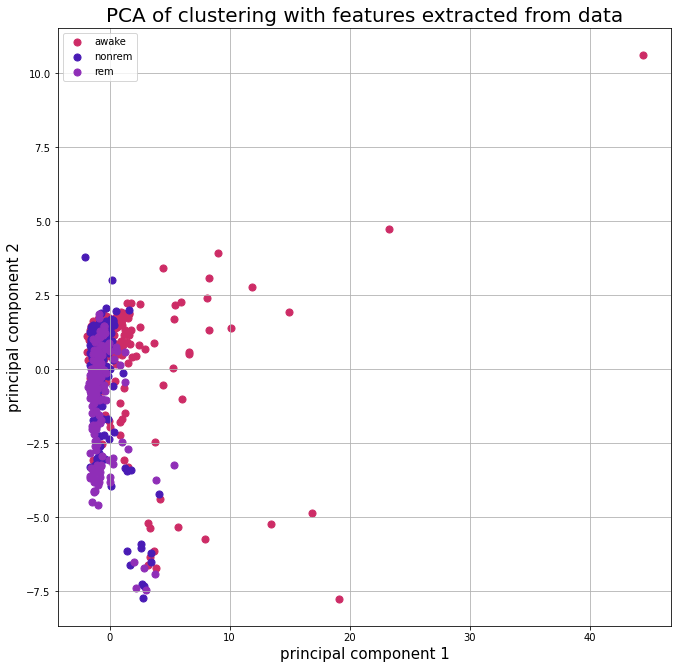

In [34]:

x=std_data_set.loc[:,features].values
pca = PCA(n_components=2)
pca=pca.fit_transform(x)
pca_df=pd.DataFrame(data=pca, columns=["principal component 1","principal component 2"])

plotPCA(pca_df,std_data_set["labels"],"features extracted from data")

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:15: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  from ipykernel import kernelapp as app


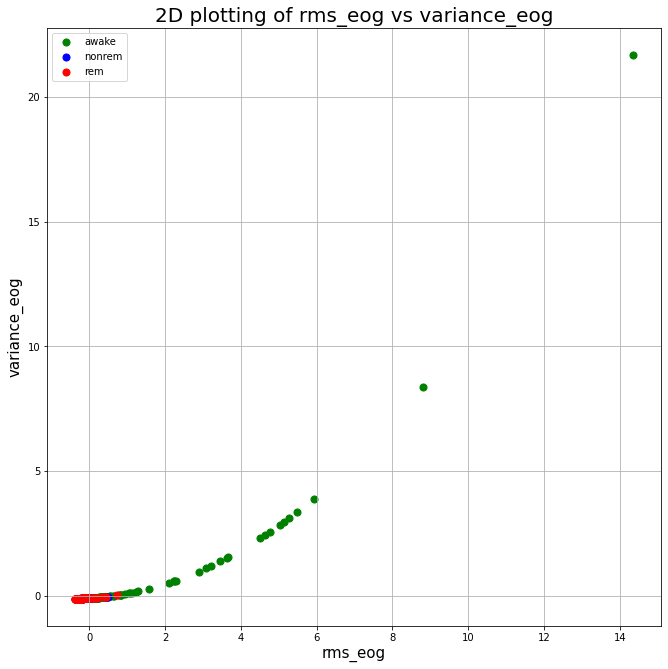

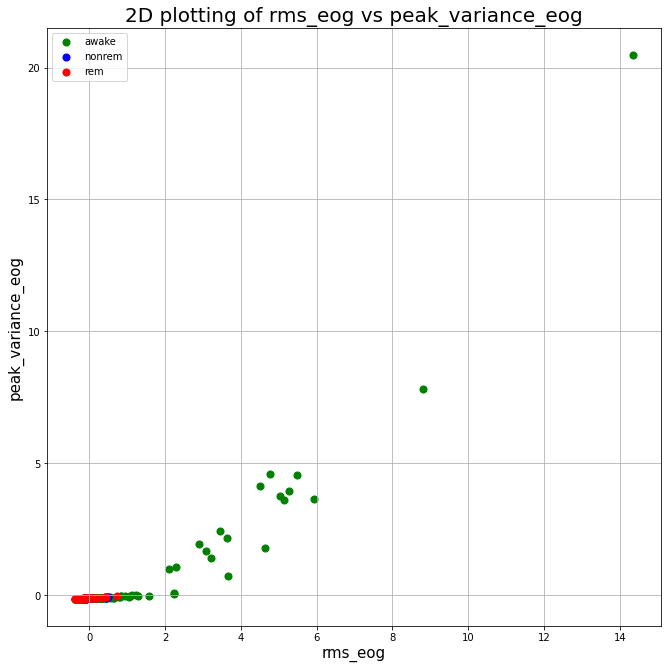

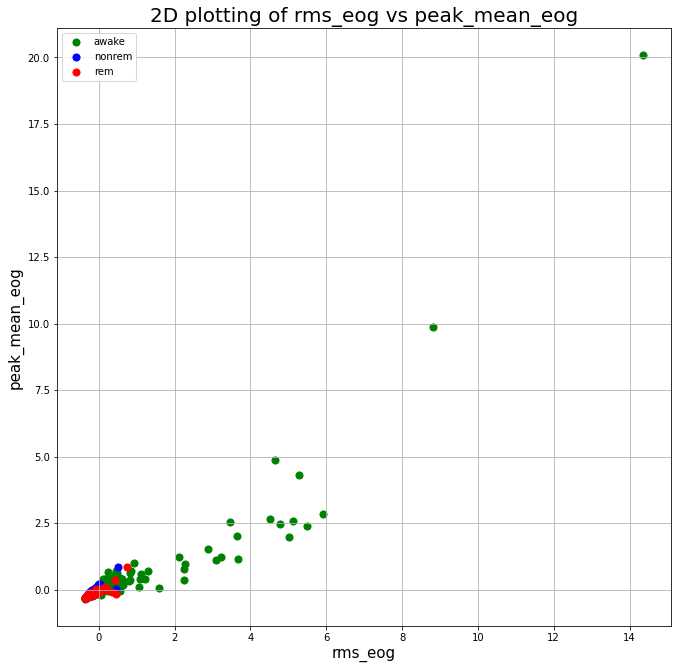

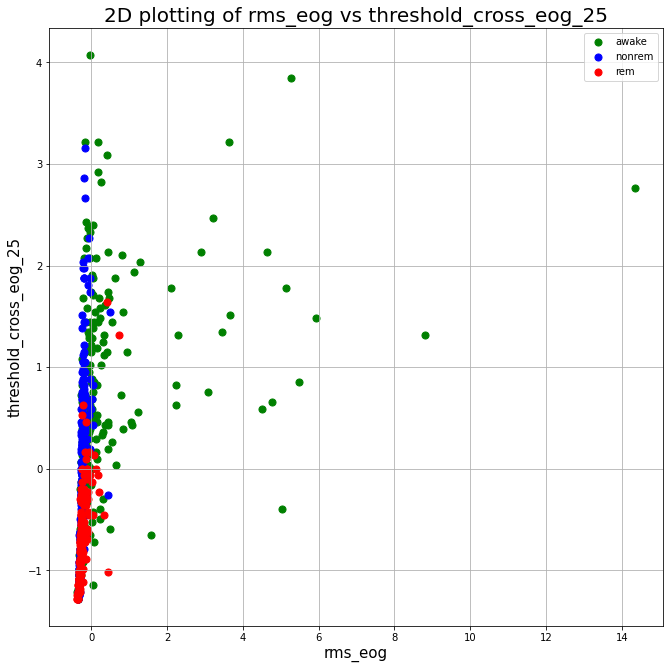

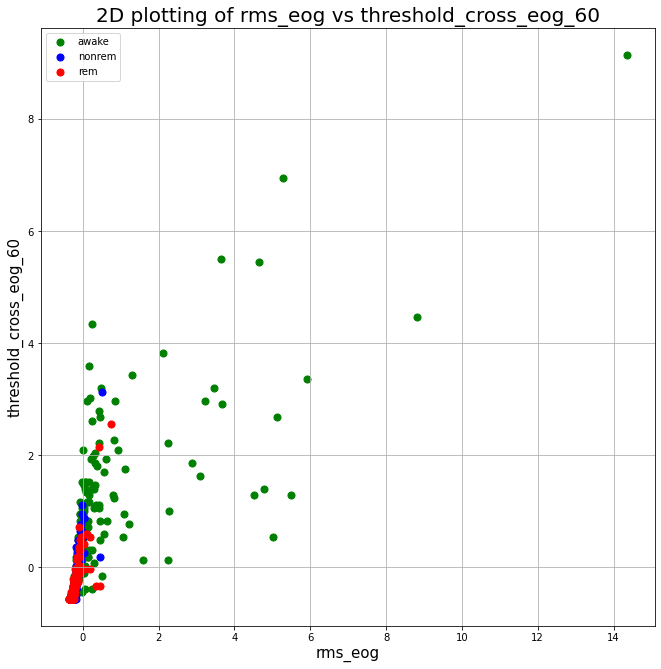

...

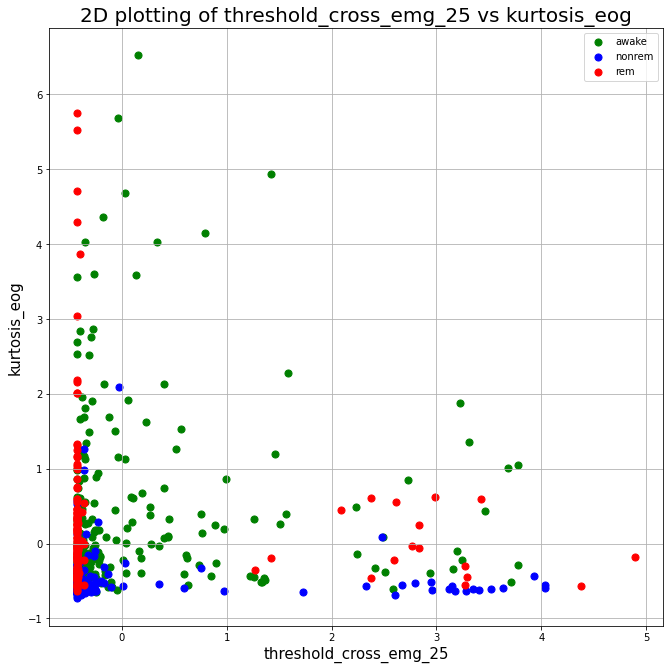

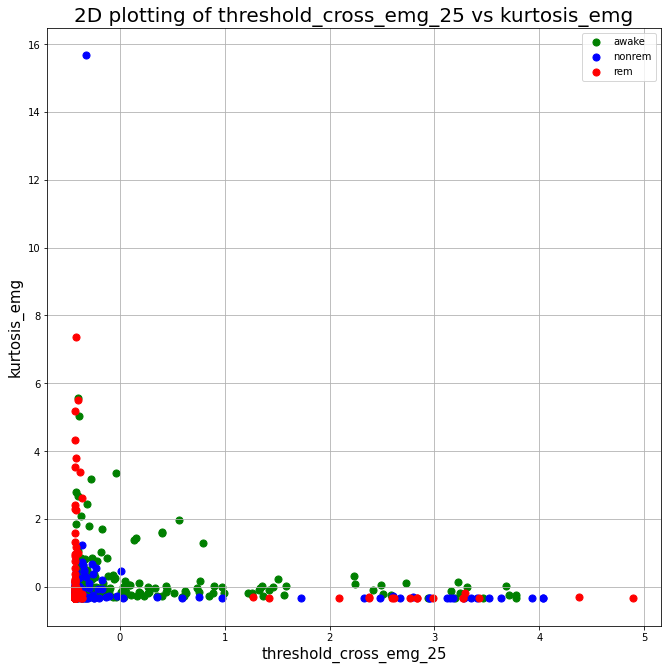

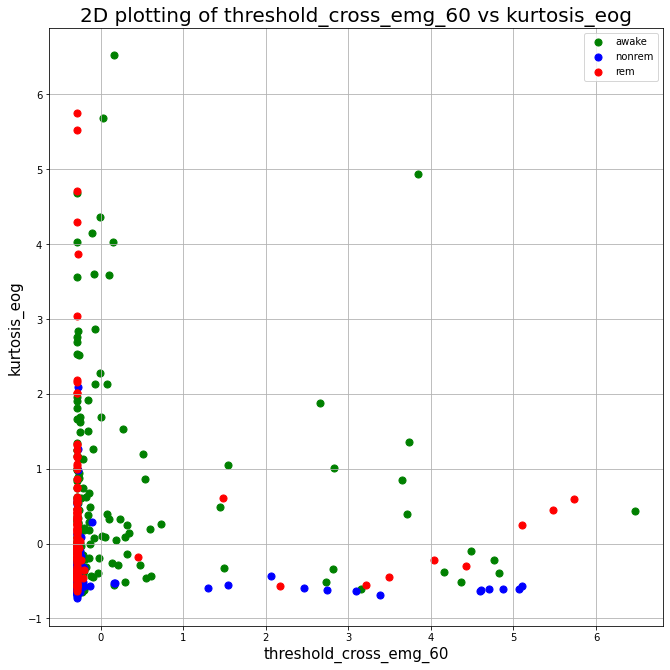

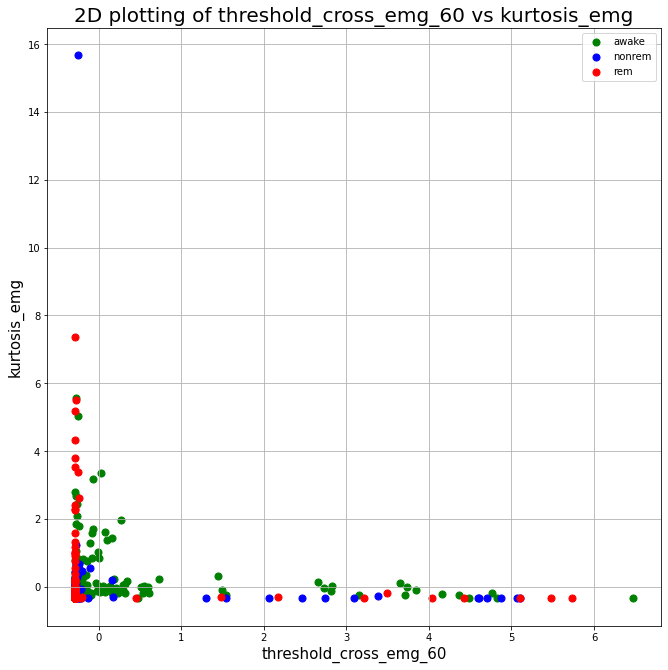

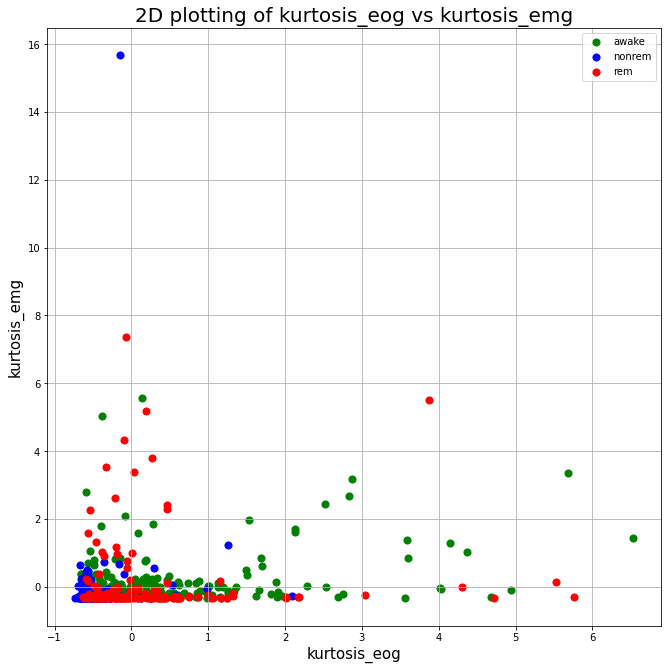

In [49]:
def plot2Dmapping(columnx,columny,labels,message):
    types=getTypes(labels)
    colors=["green","blue","red"]
    x=[]
    y=[]
    for typ in types:
        x_type=[]
        y_type=[]
        for i in range( len(labels)):
            if(labels[i]==typ):
                x_type.append(columnx[i])
                y_type.append(columny[i])
        x.append(x_type)
        y.append(y_type)
    fig = plt.figure(figsize = (11,11))
    ax = fig.add_subplot(1,1,1) 
    ax.set_xlabel(message[0], fontsize = 15)
    ax.set_ylabel(message[1], fontsize = 15)
    ax.set_title('2D plotting of '+message[0]+" vs "+message[1], fontsize = 20)
    number_of_colors = len(types)

    #colors = ["#"+''.join([random.choice('0123456789ABCDEF') for j in range(6)])
    #         for i in range(number_of_colors)]
    #print(len(colors))
    #print(len(types))
    for i, color in zip(range(len(types)),colors):  
        ax.scatter(x[i], y[i], c = color, s = 50)
    ax.legend(types)
    ax.grid()

for i in range(len(features)):
  for j in range(i+1,len(features)):
    plot2Dmapping(std_data_set[features[i]],std_data_set[features[j]],std_data_set["labels"],[features[i],features[j]])


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


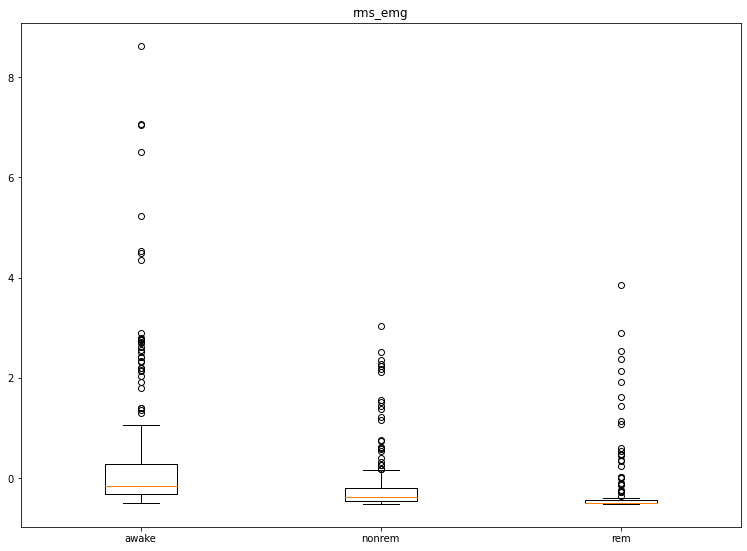

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


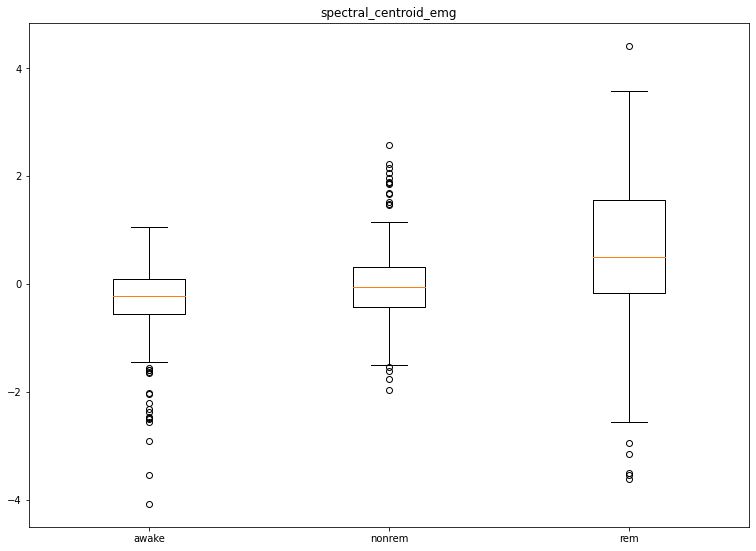

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


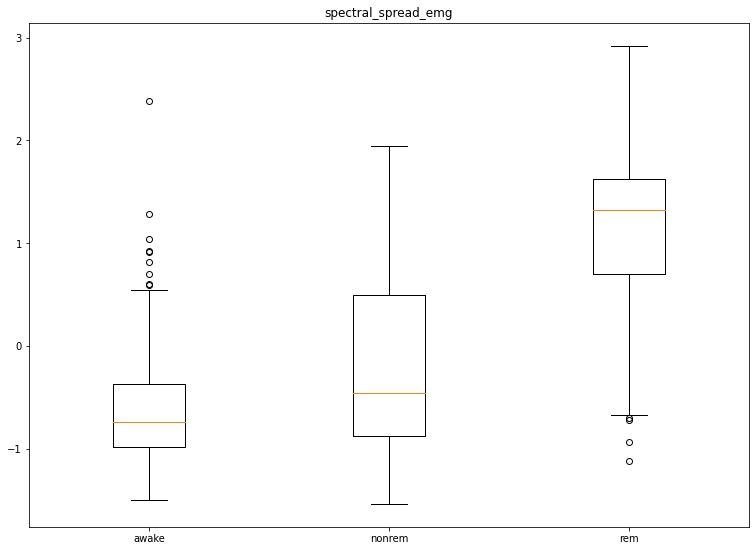

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


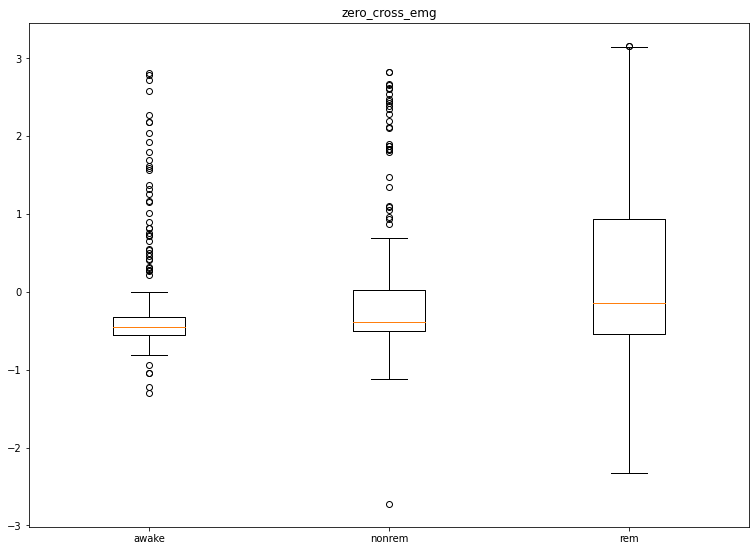

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


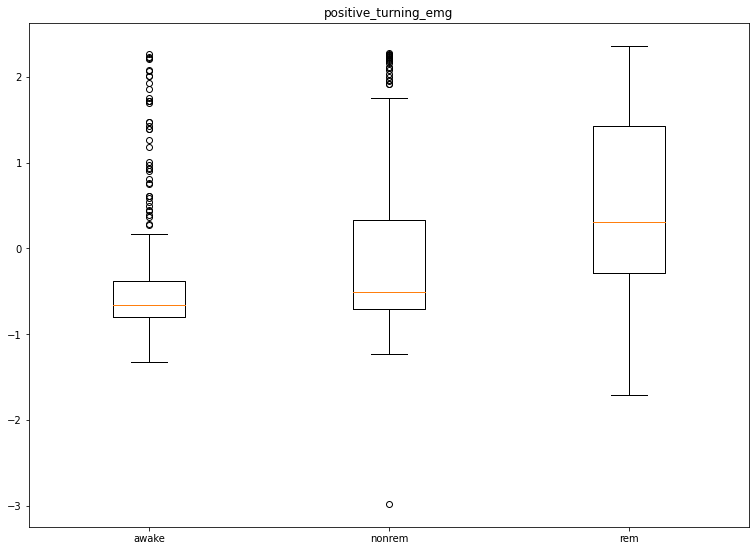

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


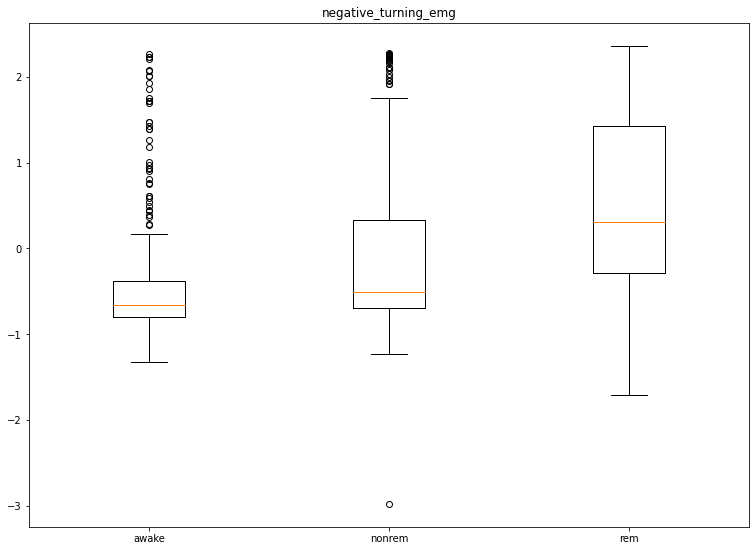

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


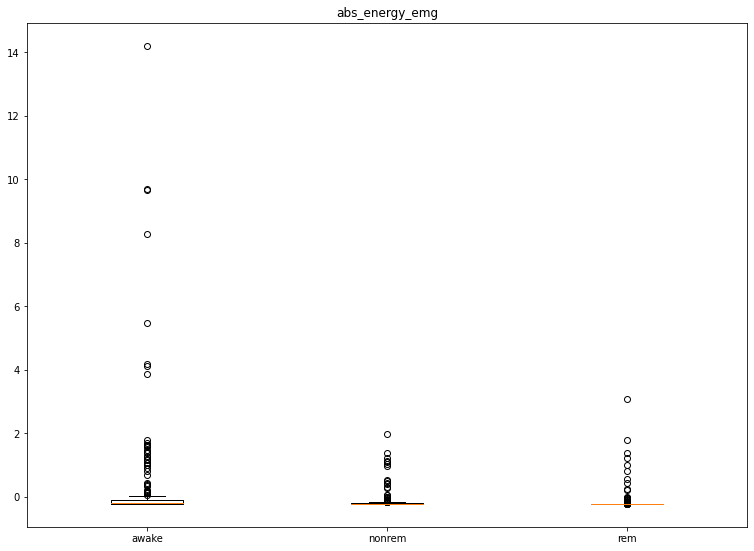

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


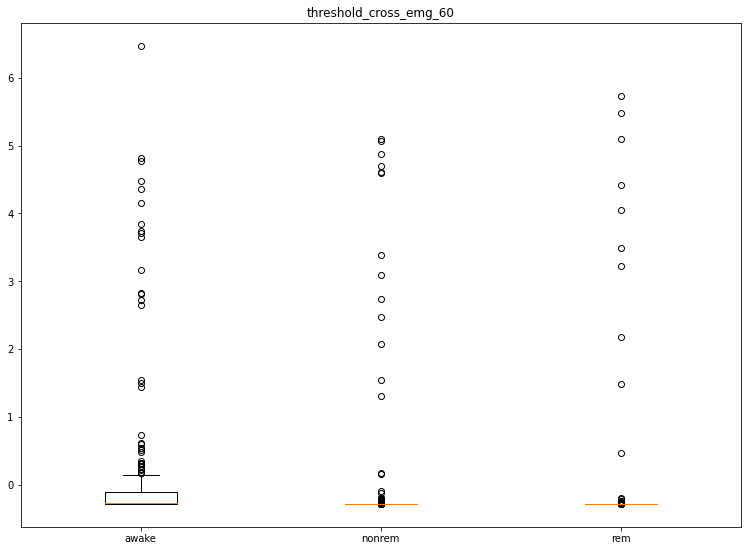

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


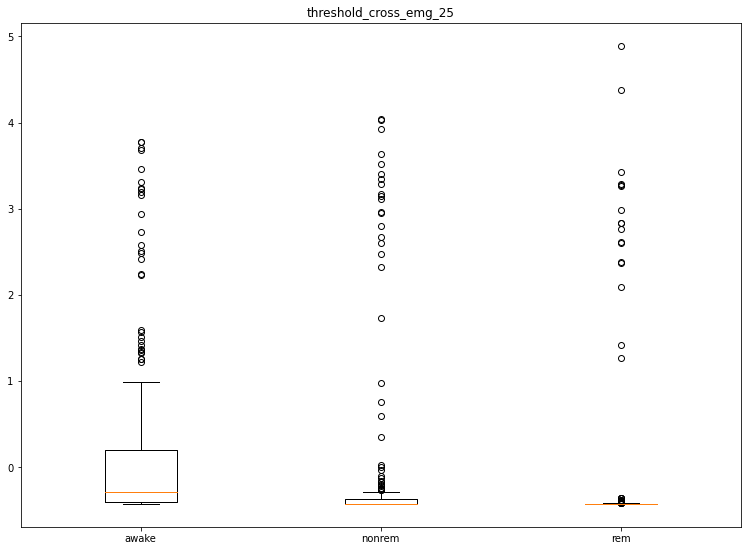

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


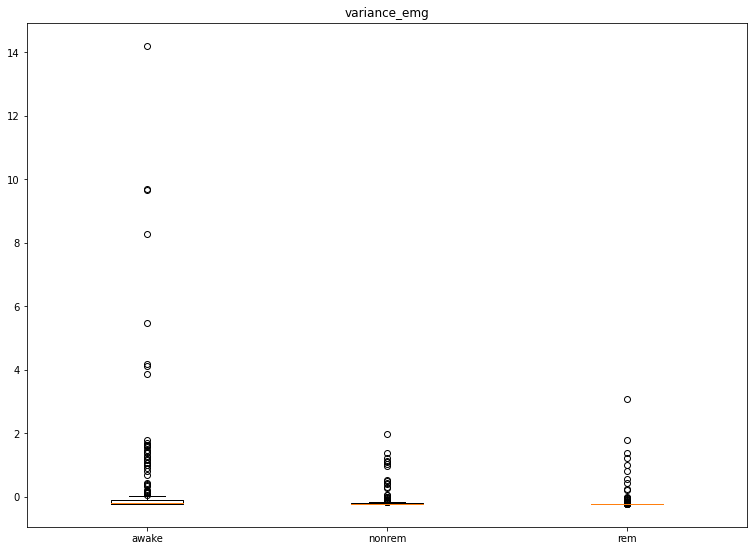

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


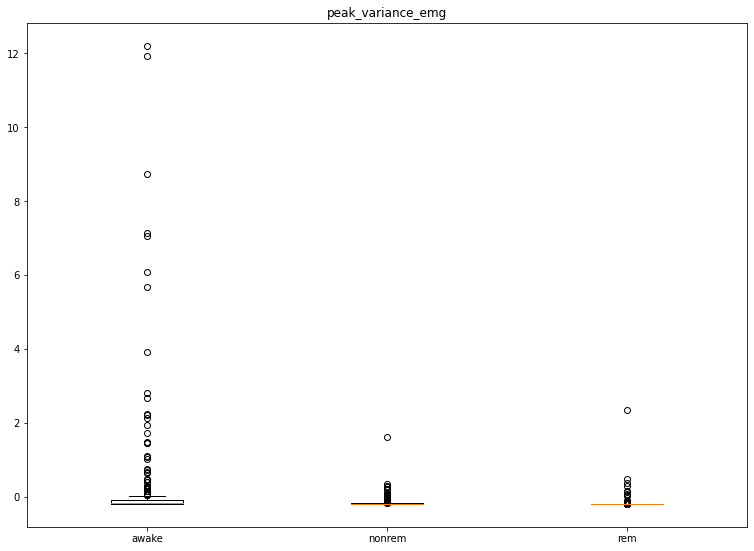

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


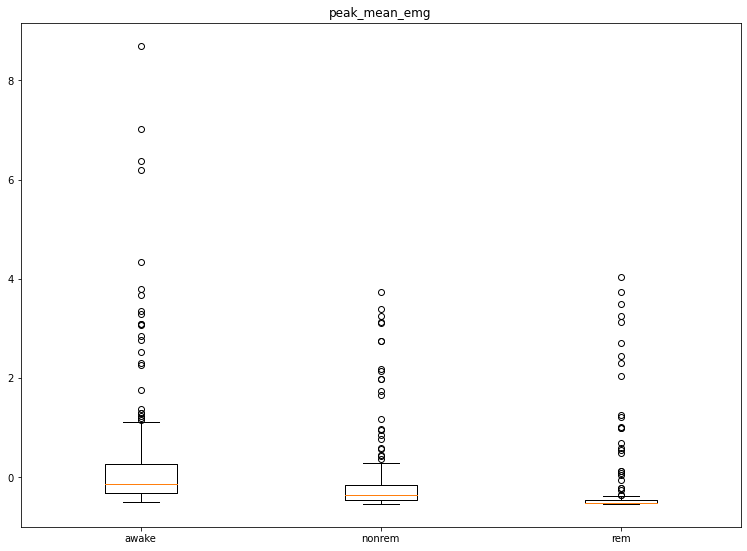

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


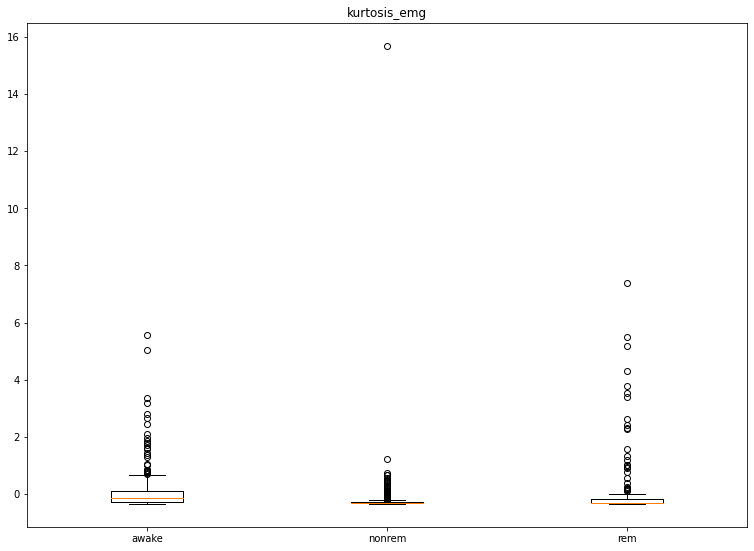

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


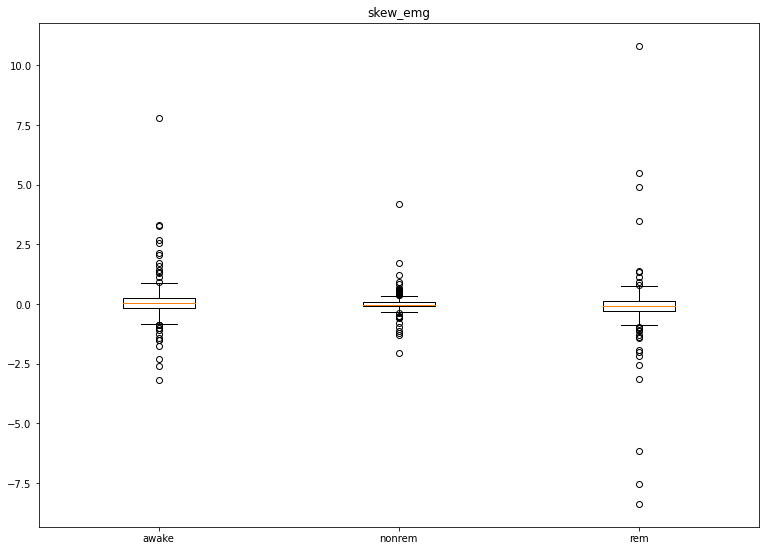

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


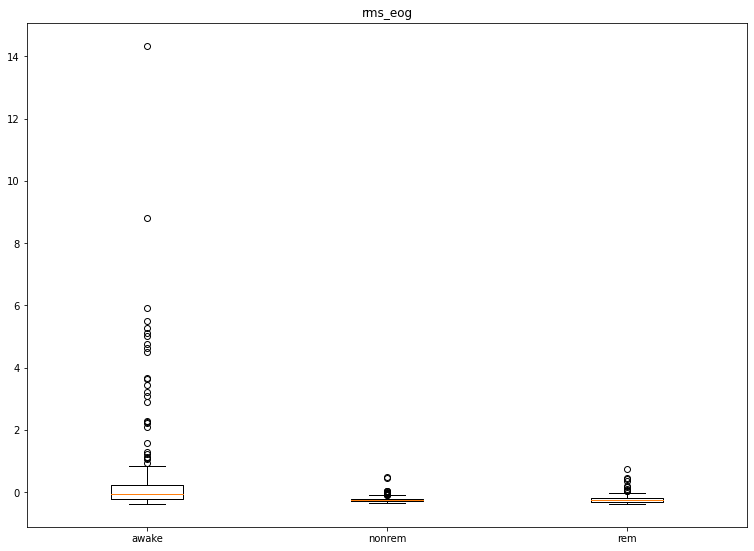

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


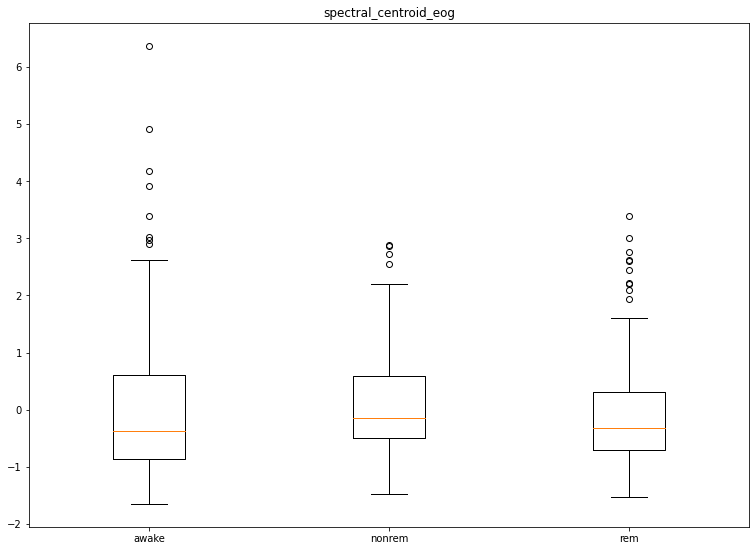

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


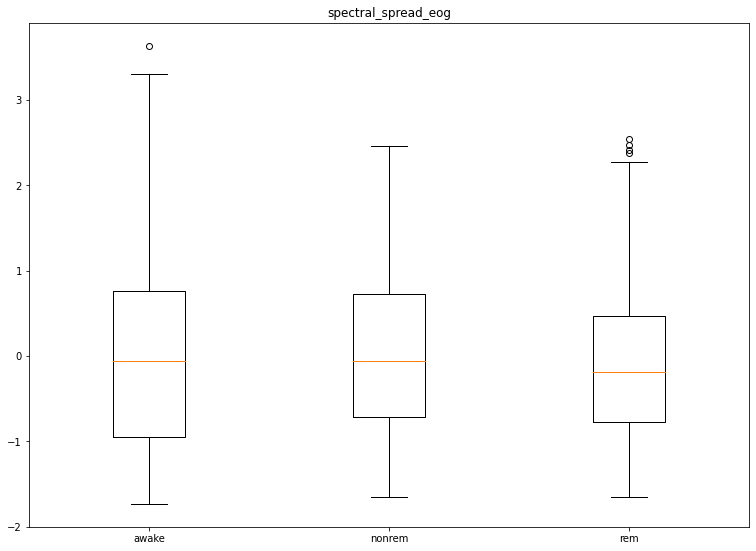

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


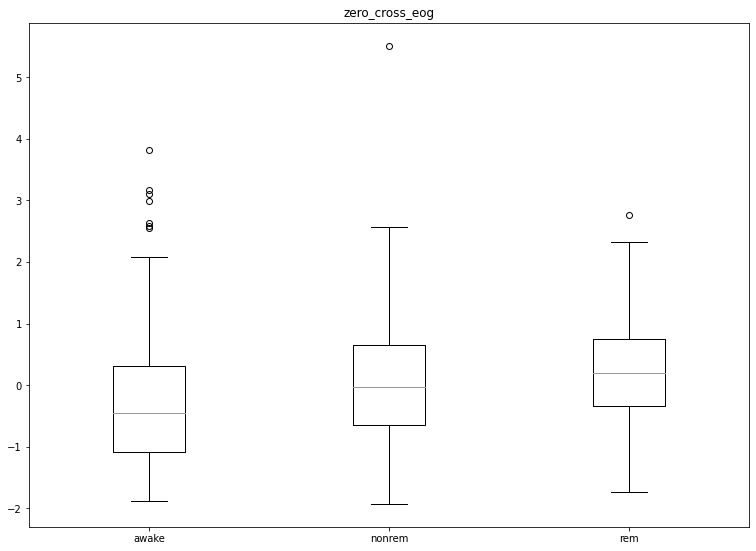

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


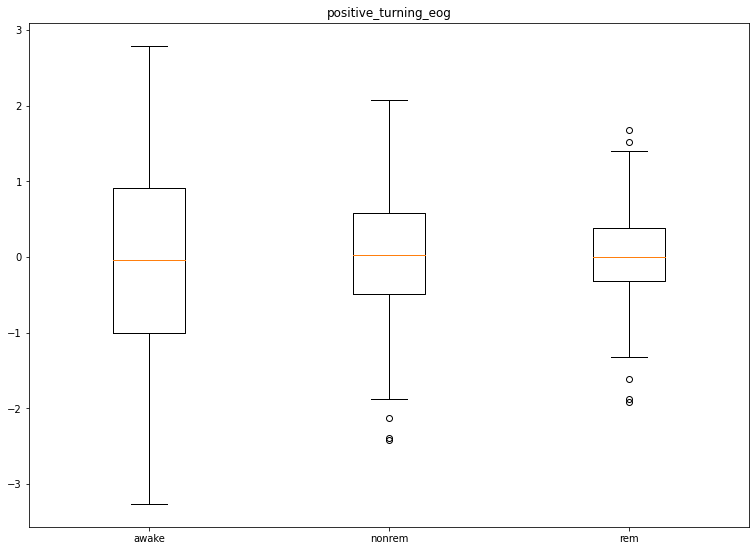

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


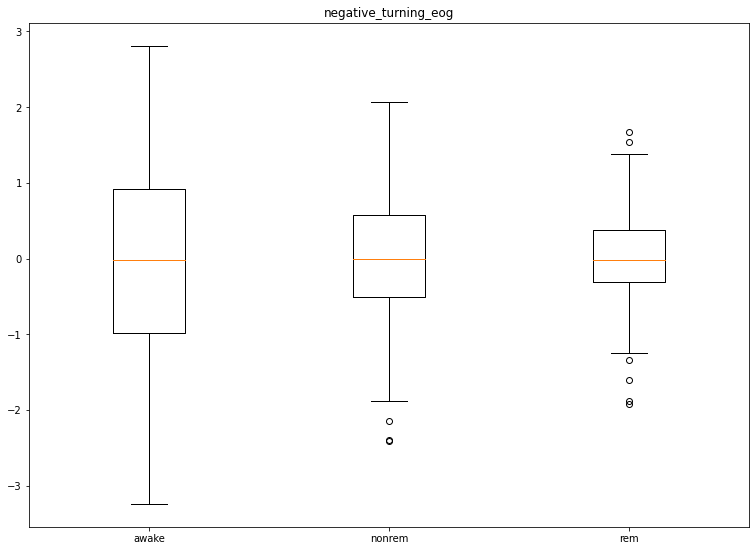

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


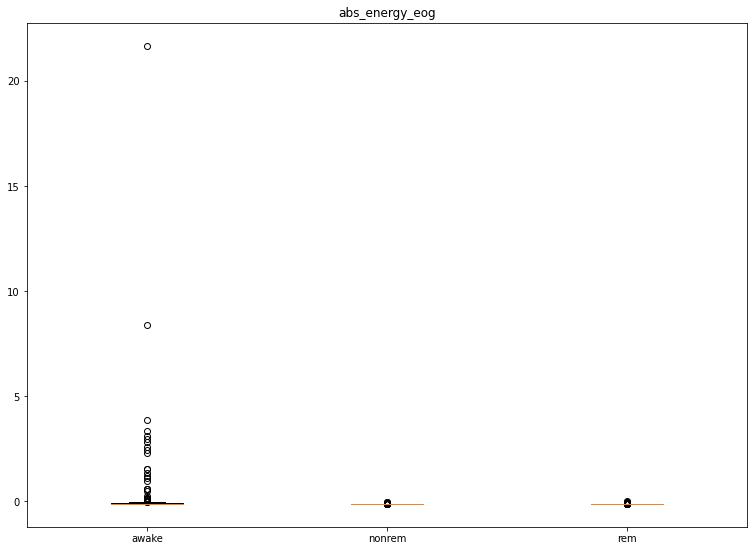

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


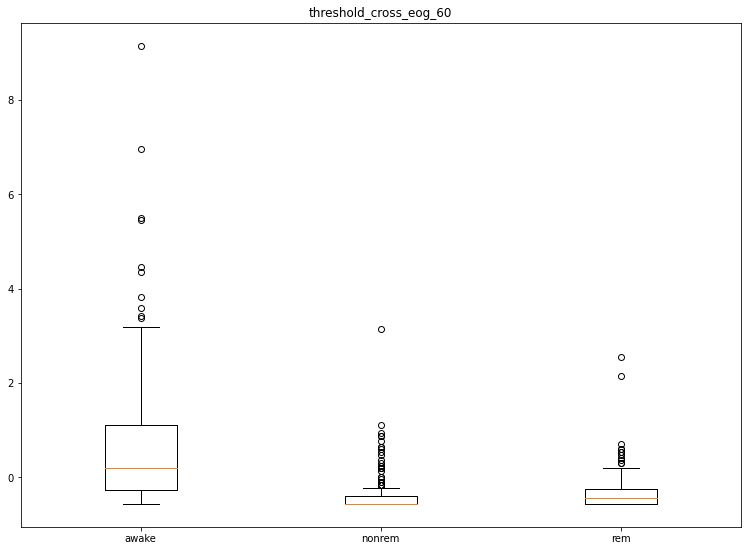

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


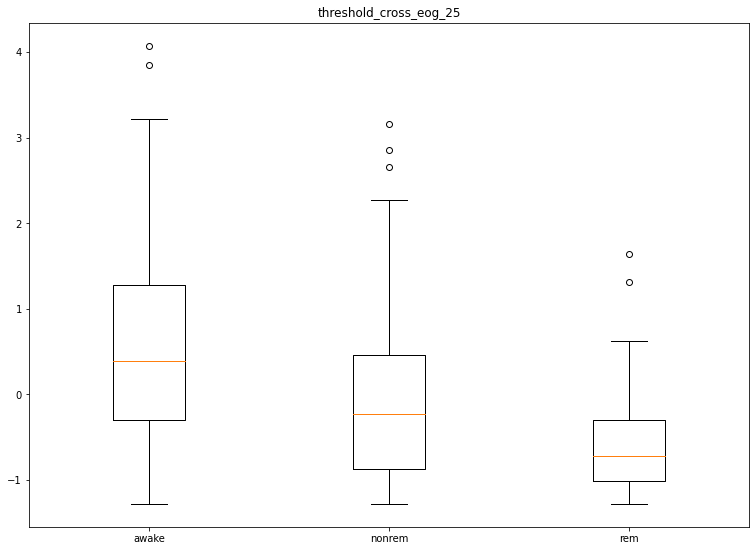

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


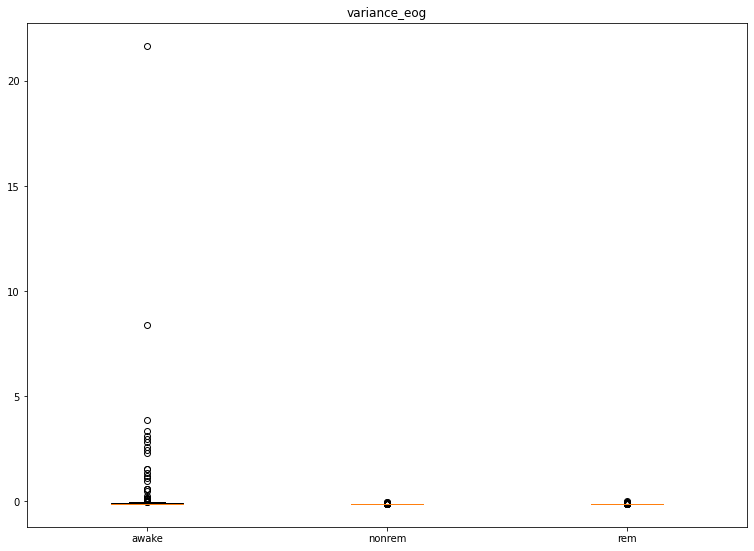

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


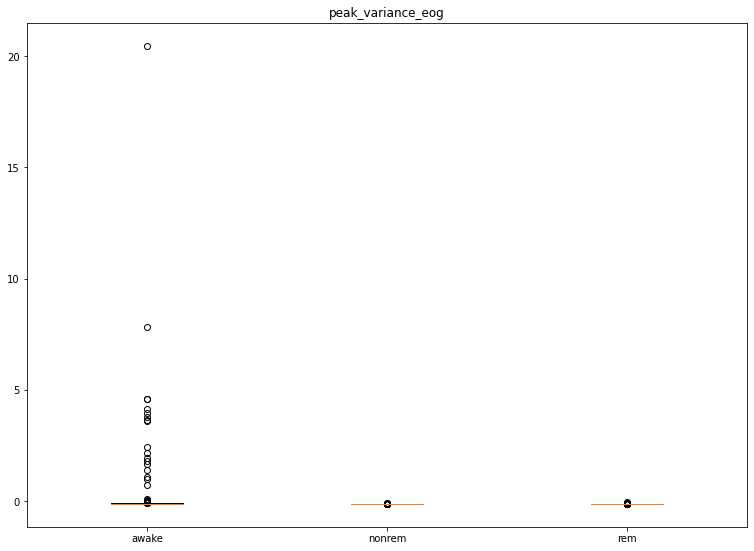

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


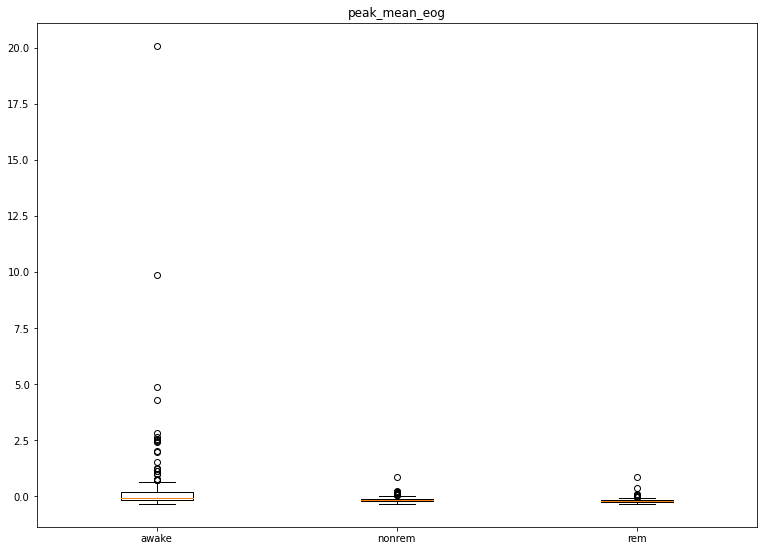

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


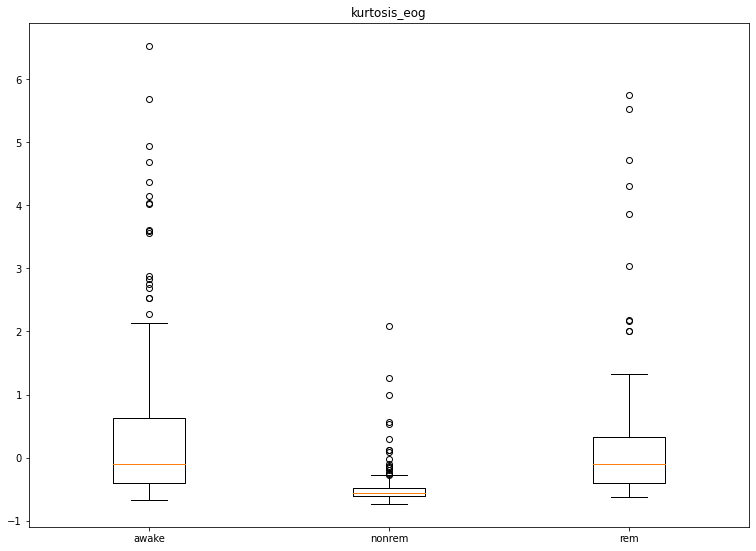

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


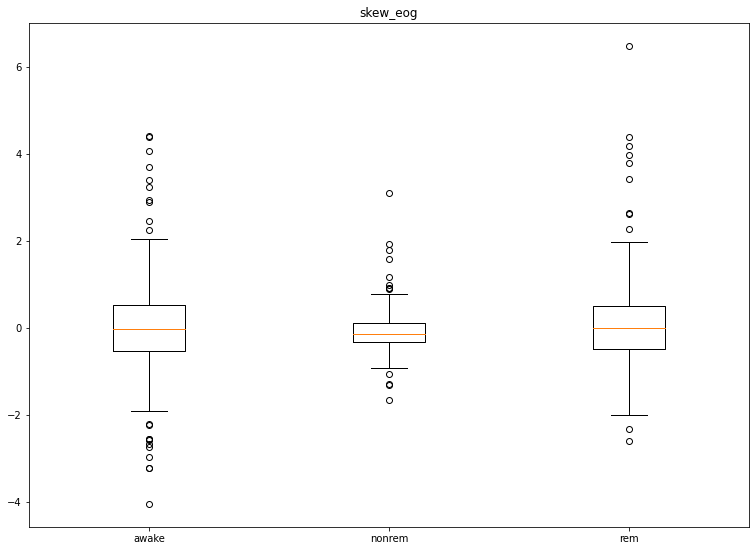

In [36]:
from numpy.core.numeric import NaN
def boxplot(dataframe,feature,ylim=(0,0)):
  labels=dataframe["labels"]
  types=getTypes(labels)
  x=[]
  for typ in types:
      x_type=[]
      for i in range(len(labels)):
        if(labels[i]==typ):
              x_type.append(dataframe[feature][i])
      x.append(x_type)
  fig = plt.figure(figsize =(10, 7))

  # Creating axes instance
  ax = fig.add_axes([0, 0, 1, 1])
  ax.set_title(feature)
  # Creating plot
  bp = ax.boxplot(x)
  ax.set_xticklabels(types)
  if ylim != (0,0) : plt.ylim(ylim[0],ylim[1])
  # show plot
  plt.show()
for feature in features:
  boxplot(std_data_set,feature)

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


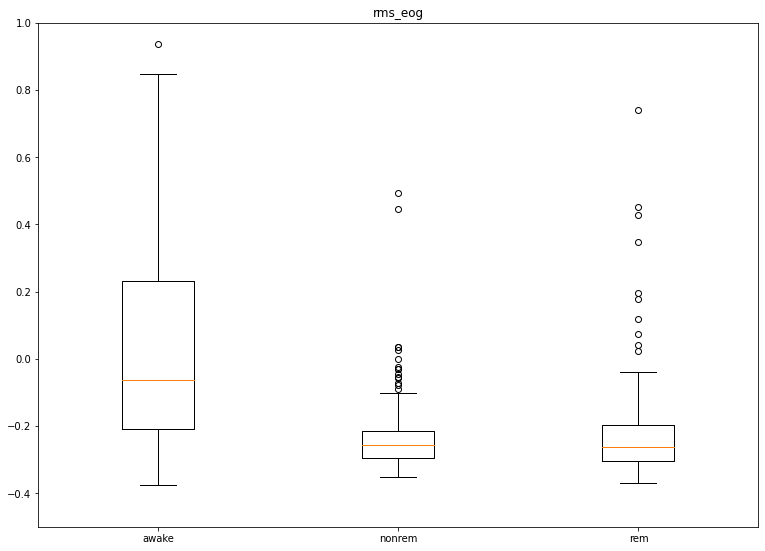

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


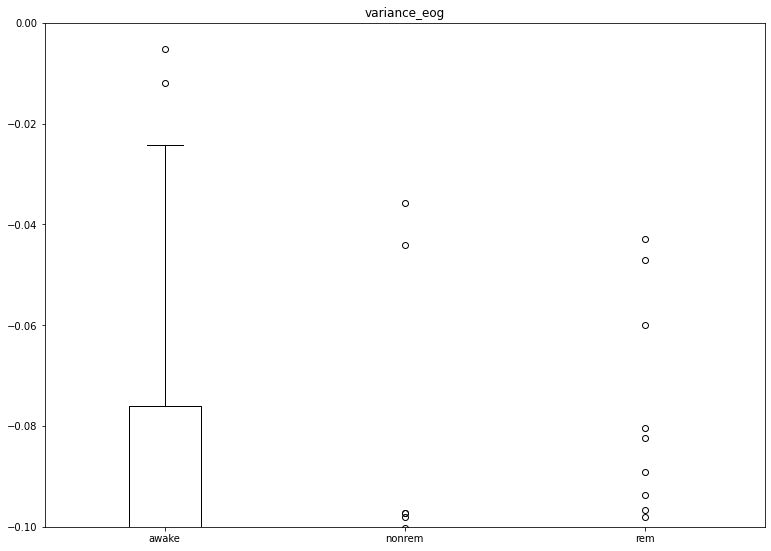

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


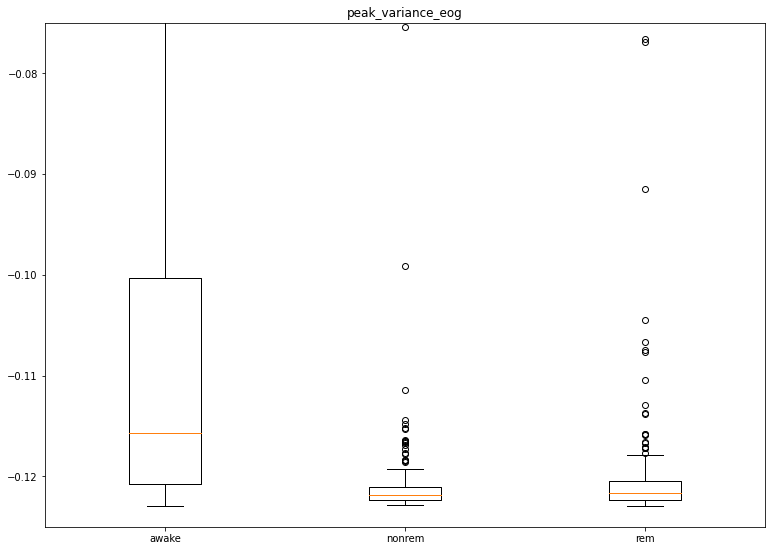

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


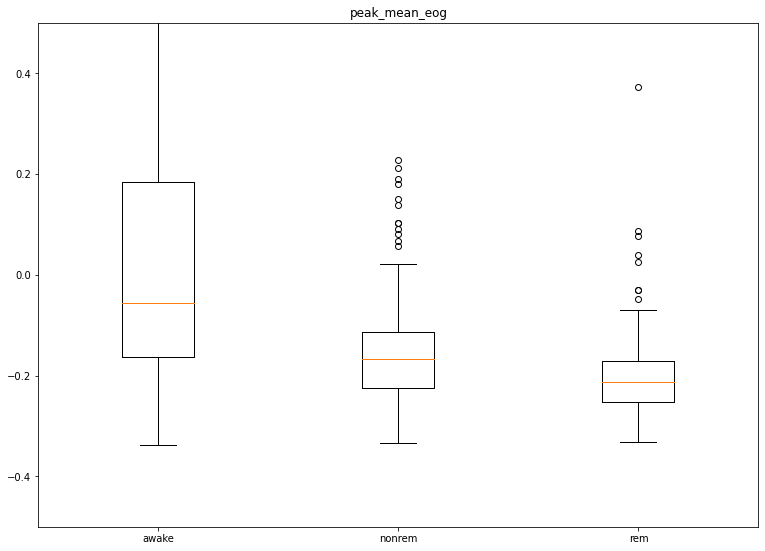

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


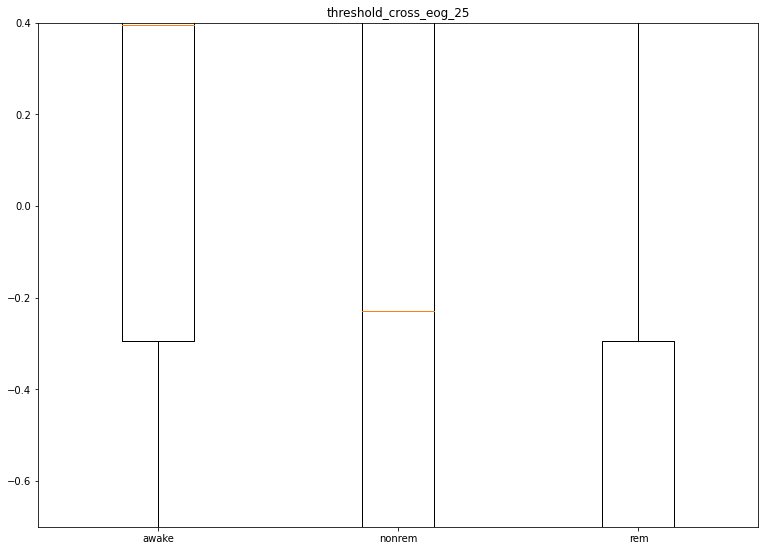

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


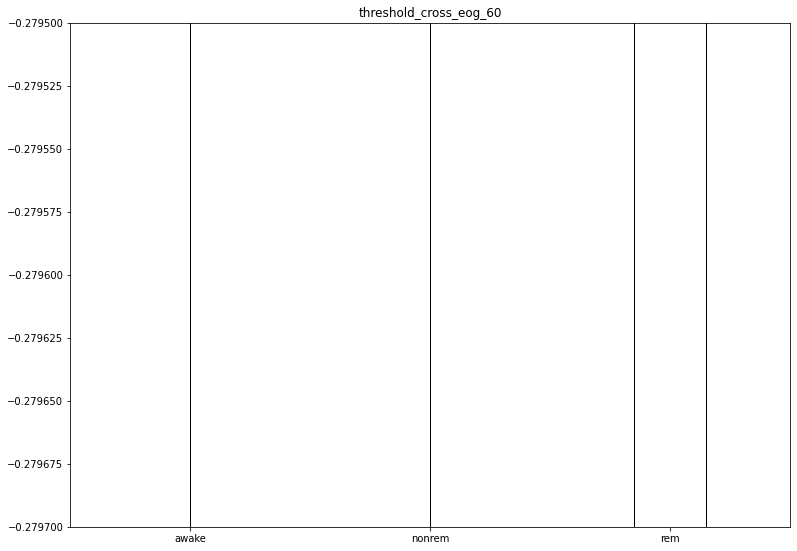

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


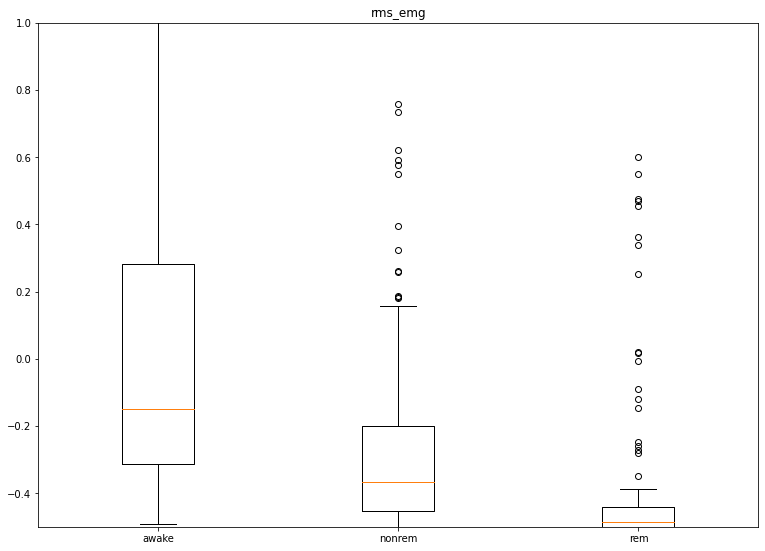

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


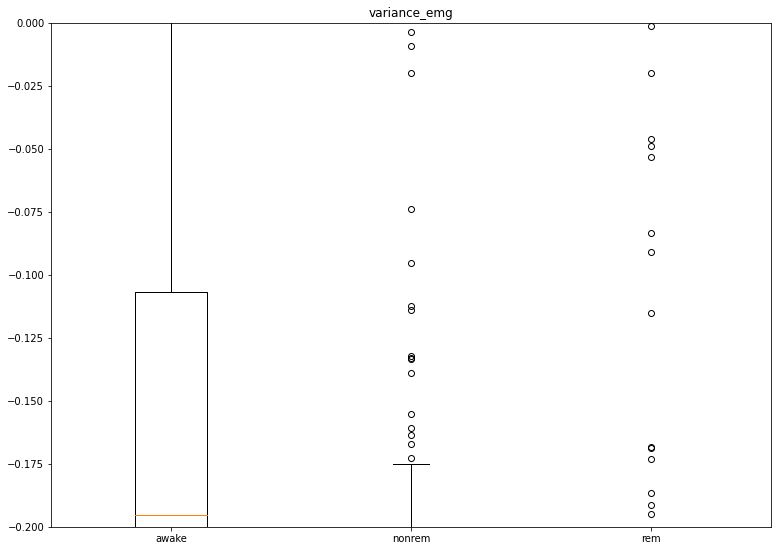

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


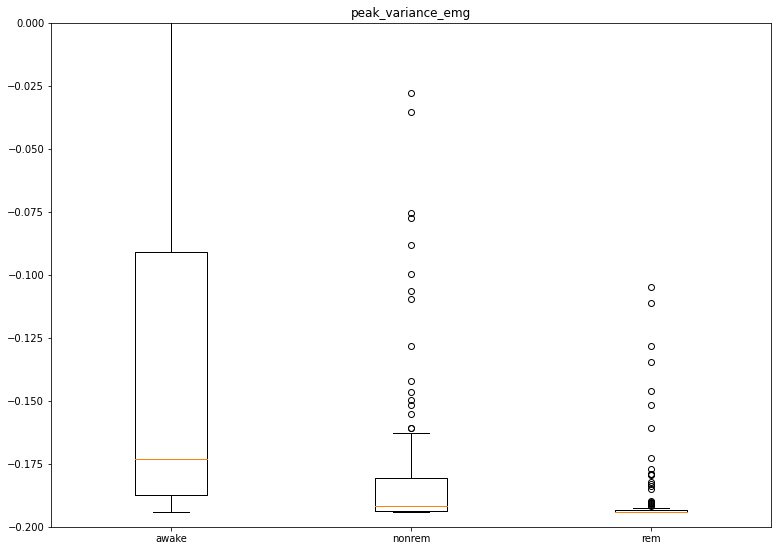

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


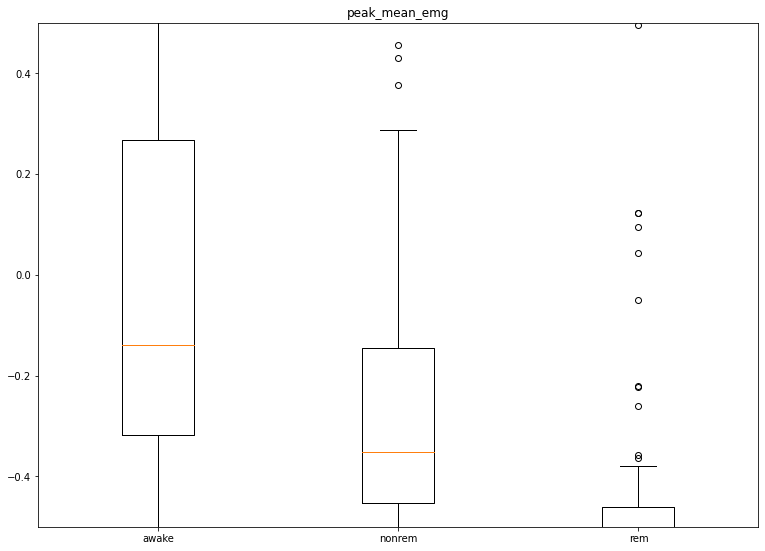

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


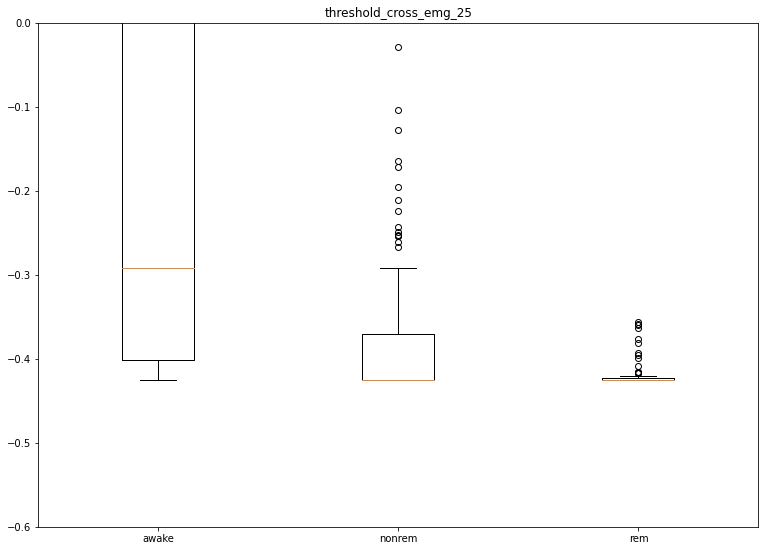

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


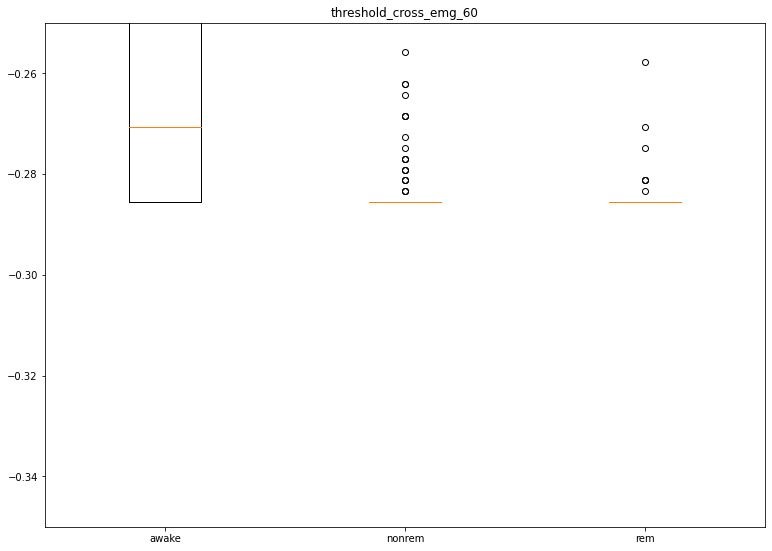

In [37]:


boxplot(std_data_set,"rms_eog",ylim=(-0.5,1.0))
boxplot(std_data_set,"variance_eog",ylim=(-0.1,0.0))
boxplot(std_data_set,"peak_variance_eog",ylim=(-0.125,-0.075))
boxplot(std_data_set,"peak_mean_eog",ylim=(-0.5,0.5))
boxplot(std_data_set,"threshold_cross_eog_25",ylim=(-0.7,0.4))
boxplot(std_data_set,"threshold_cross_eog_60",ylim=(-0.2797,-0.2795))
boxplot(std_data_set,"rms_emg",ylim=(-0.5,1.0))
boxplot(std_data_set,"variance_emg",ylim=(-0.2,0.0))
boxplot(std_data_set,"peak_variance_emg",ylim=(-0.2,0.0))
boxplot(std_data_set,"peak_mean_emg",ylim=(-0.5,0.5))
boxplot(std_data_set,"threshold_cross_emg_25",ylim=(-0.6,0))
boxplot(std_data_set,"threshold_cross_emg_60",ylim=(-0.35,-0.25))

#Comparison of training and test data
The comparison is done by comparing the feature distributins.

In [38]:
test_paths={"awake":"/content/gdrive/My Drive/Colabdata/DataDTEK0086/Test/awake","nonrem":"/content/gdrive/My Drive/Colabdata/DataDTEK0086/Test/nonrem", "rem":"/content/gdrive/My Drive/Colabdata/DataDTEK0086/Test/rem"}
test_data_set={"labels":[]}

for feature in features_emg:
  test_data_set[feature]=[]
for feature in features_eog:
  test_data_set[feature]=[]

for sleep_state in test_paths.keys():
  files = os.listdir(test_paths[sleep_state])
  for filename in files:
    if ".csv" in filename:
      signal_df=pd.read_csv(test_paths[sleep_state]+"/"+filename)
      real_features_eog = extract_features(filter_eog_signal(signal_df["eog"][0:-1]))
      real_features_emg = extract_features(filter_emg_signal(signal_df["emg"][0:-1]))
      test_data_set["labels"].append(sleep_state)
      for i in range(0,len(features_emg)):
        test_data_set[features_emg[i]].append(real_features_emg[i])
      for i in range(0,len(features_eog)):
        test_data_set[features_eog[i]].append(real_features_eog[i])


#standardization with z-score
test_data_set_df=pd.DataFrame(test_data_set)
test_std_data_set=test_data_set_df.copy()
standardize(test_std_data_set,features,dataset_means_and_std)


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


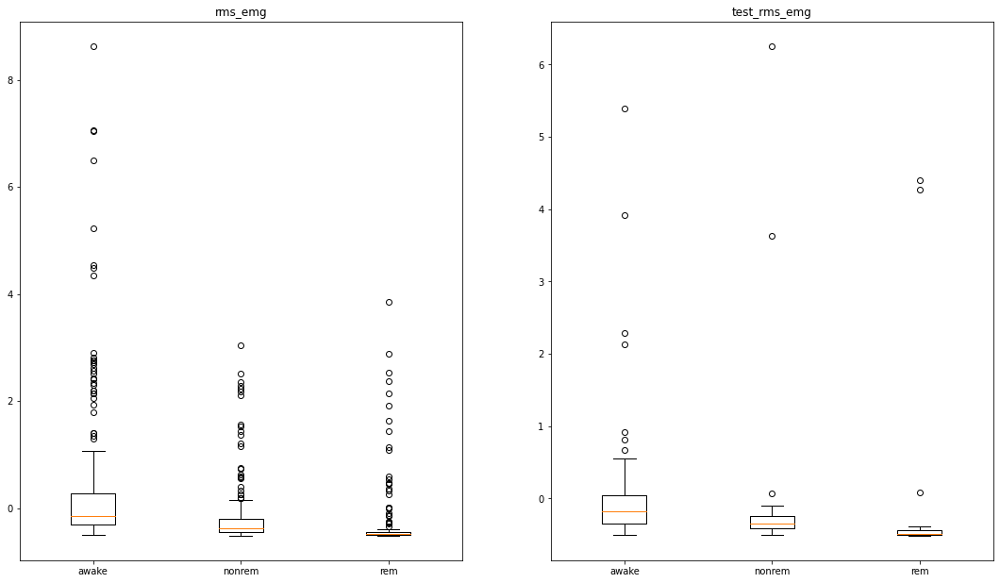

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


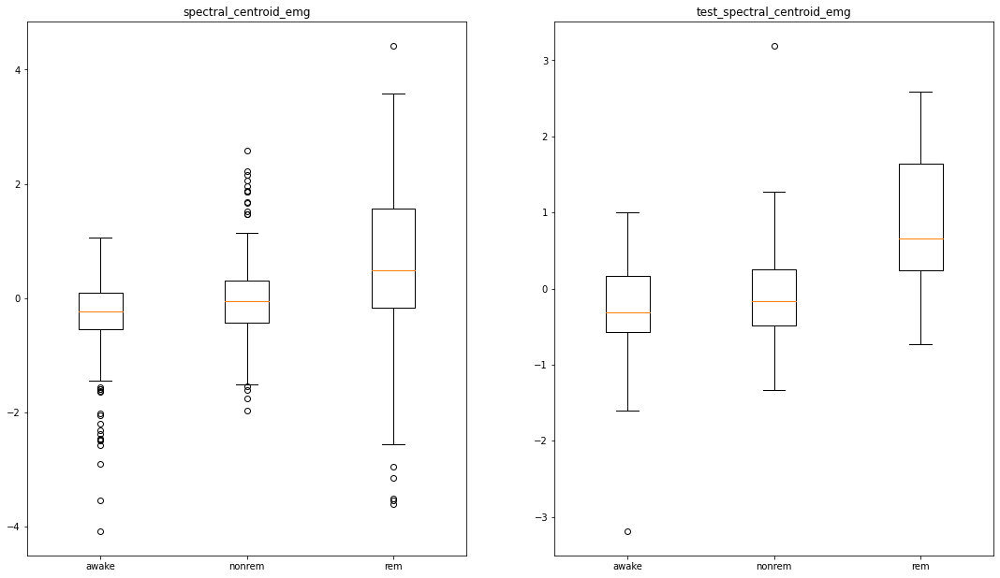

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


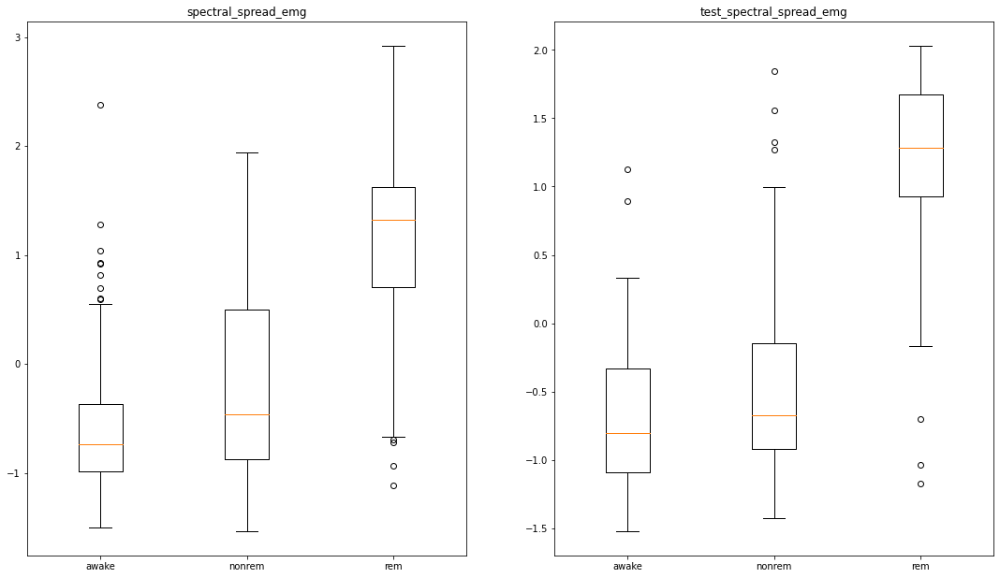

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


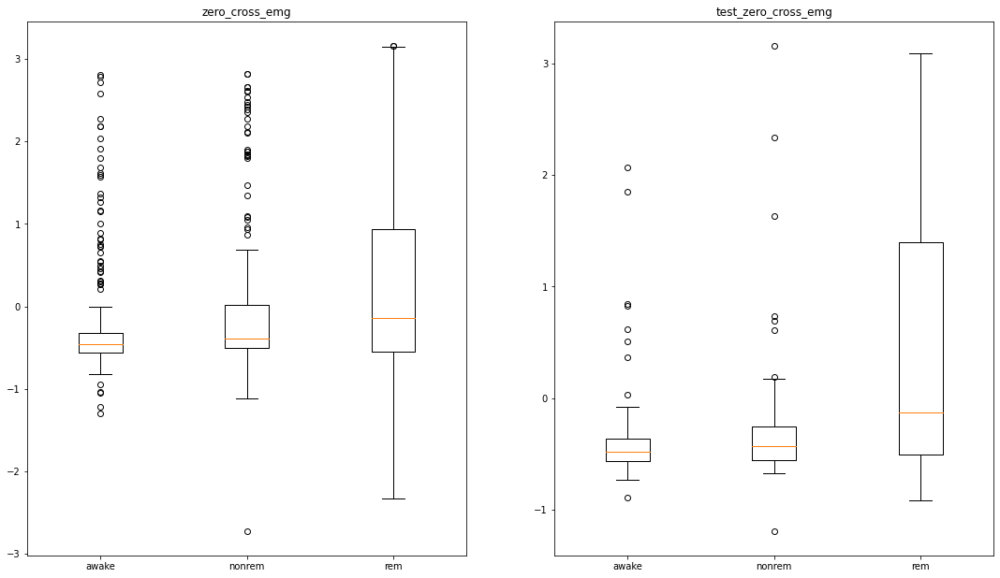

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


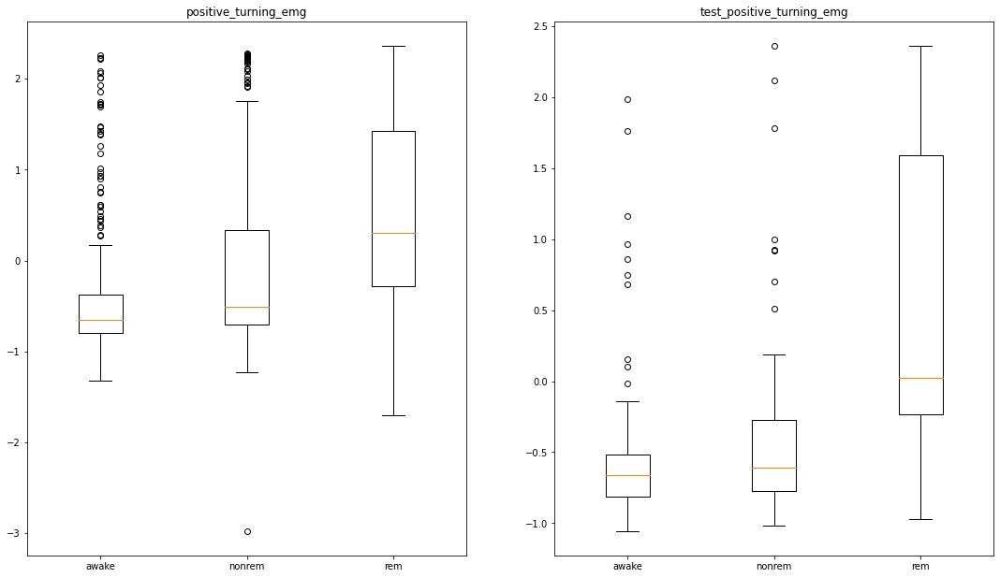

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


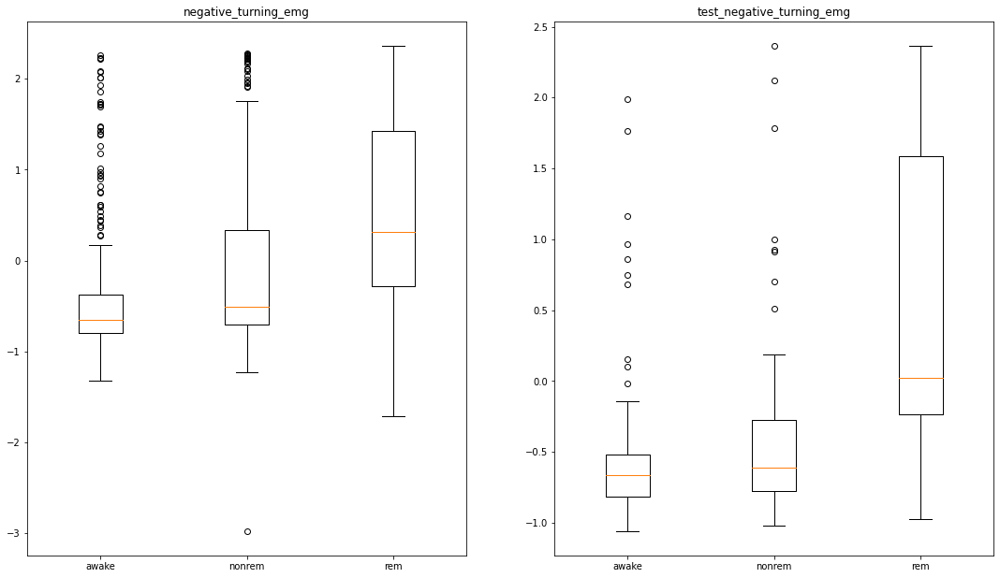

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


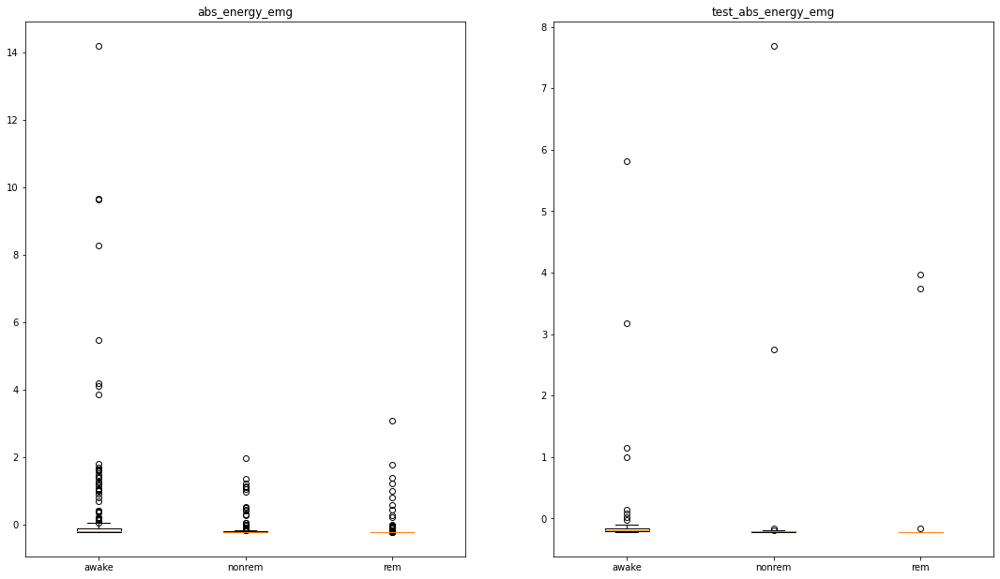

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


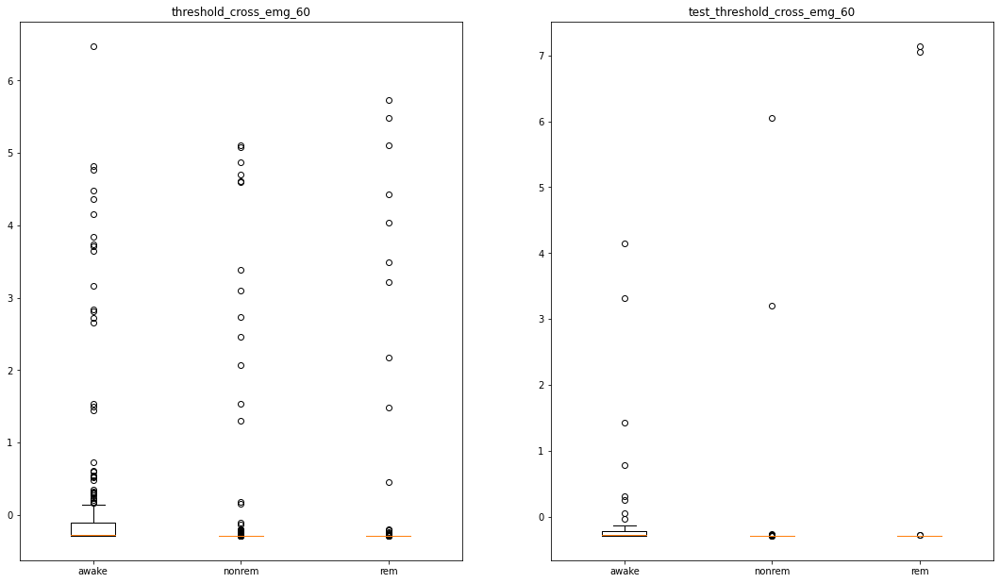

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


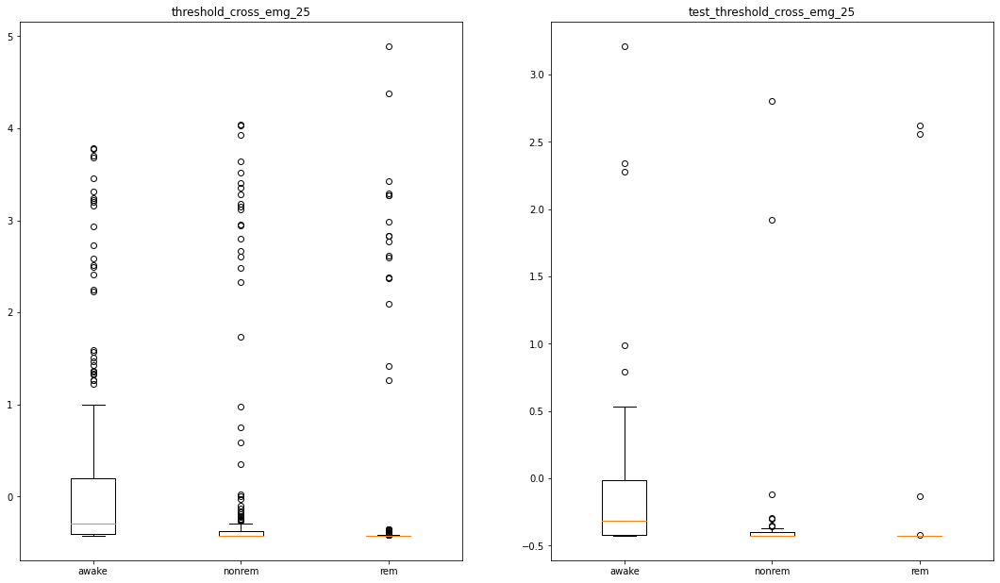

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


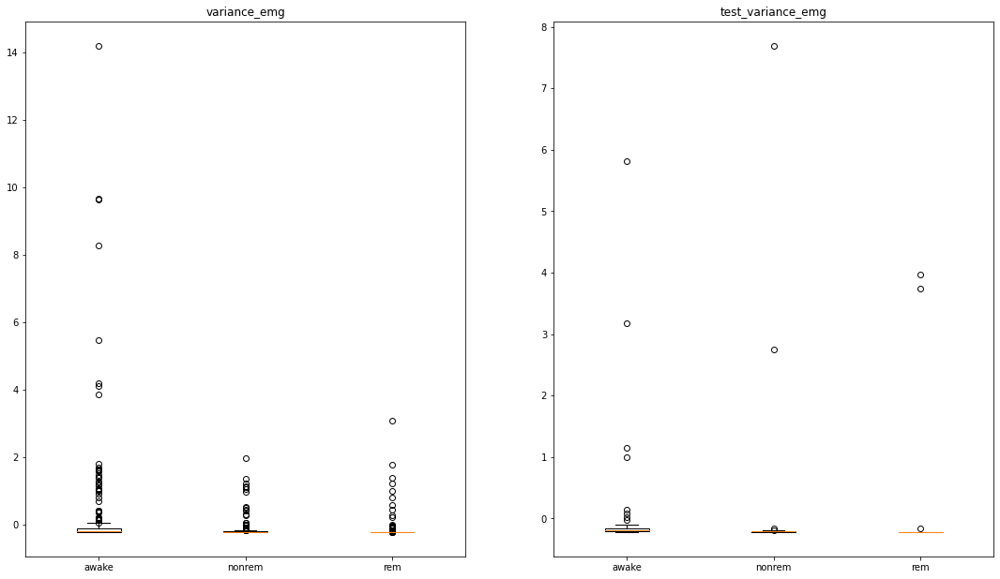

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


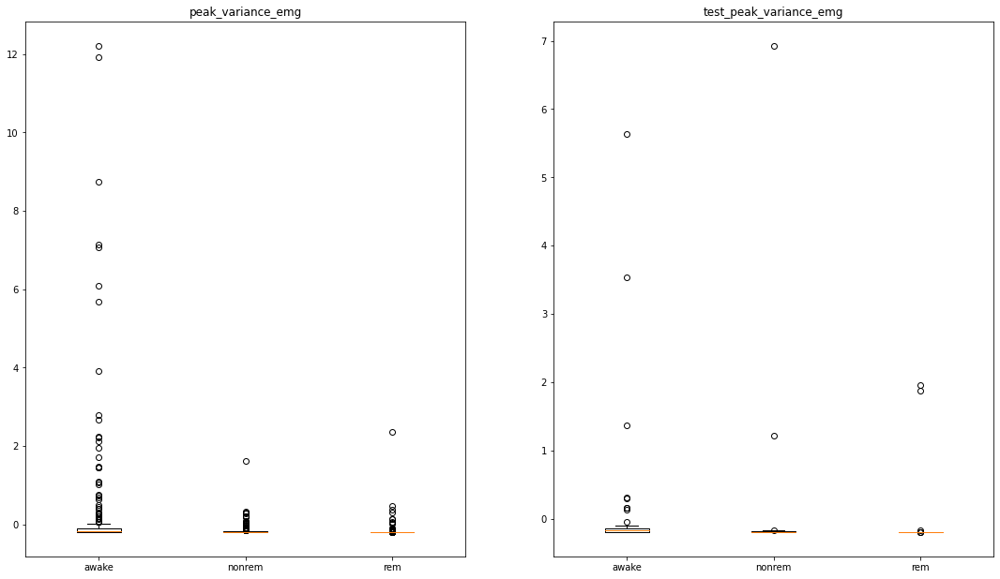

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


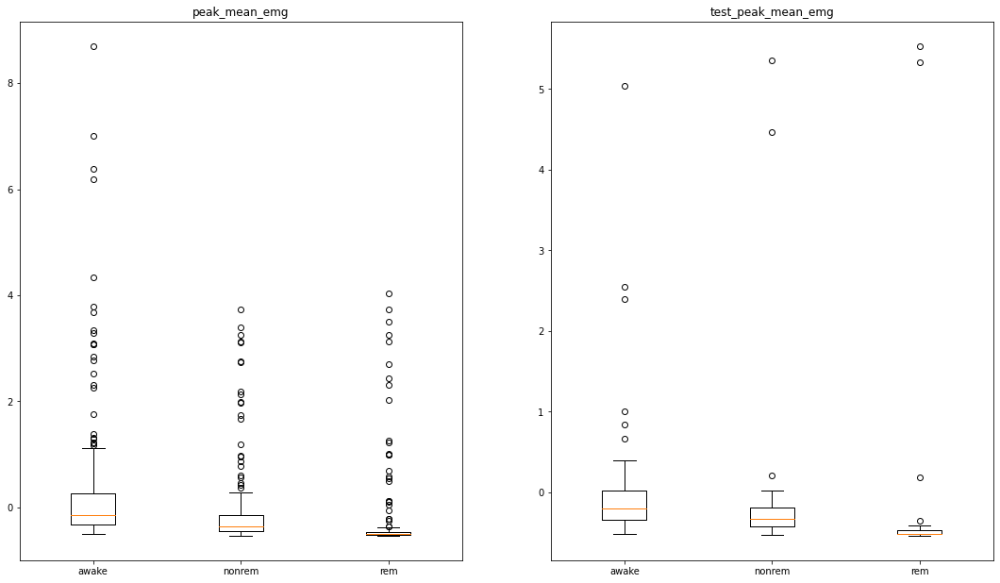

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


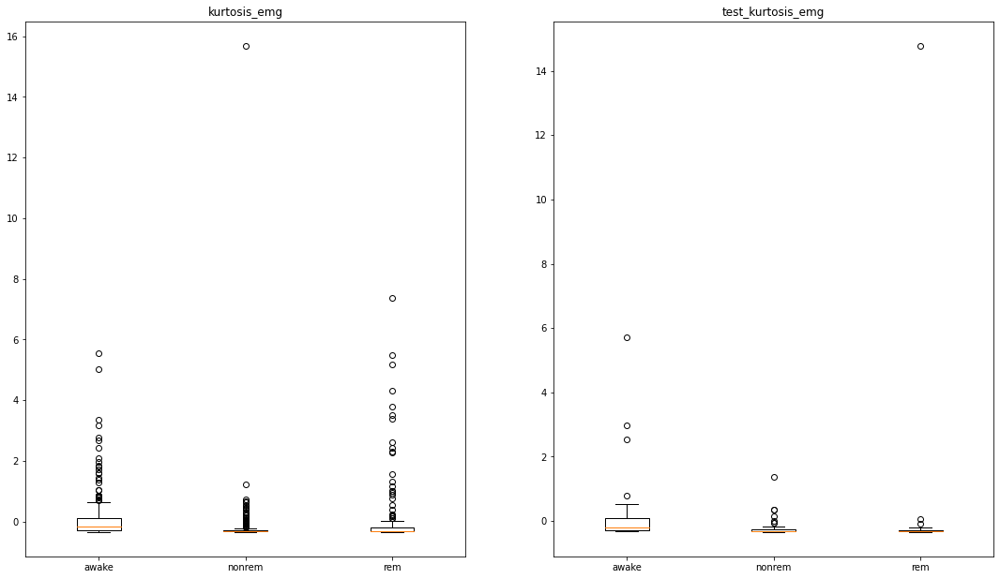

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


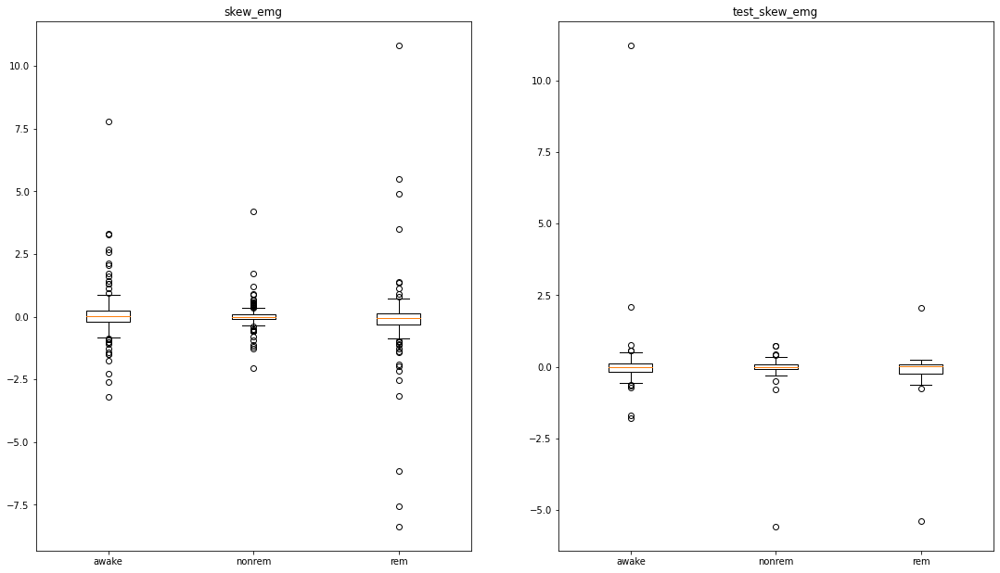

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


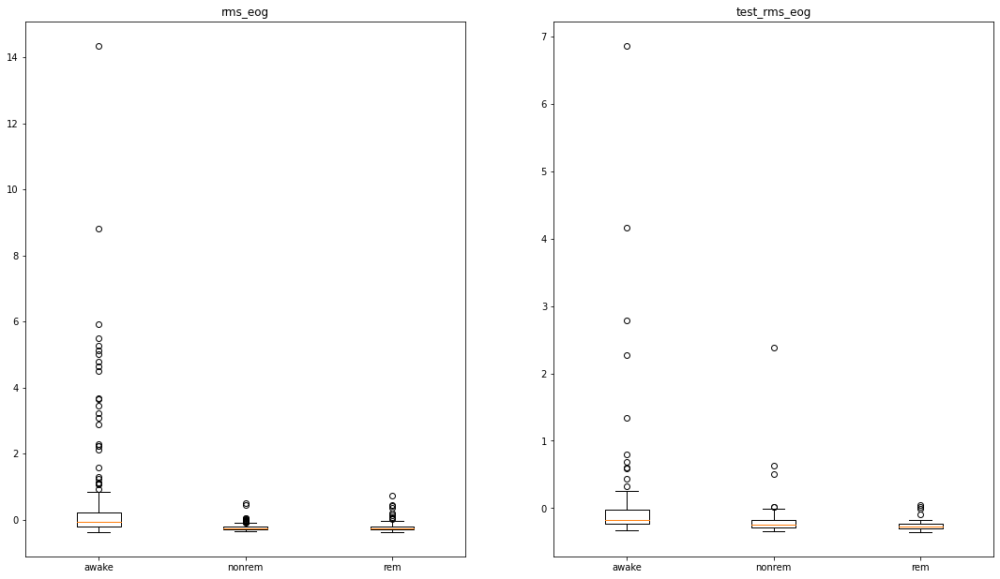

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


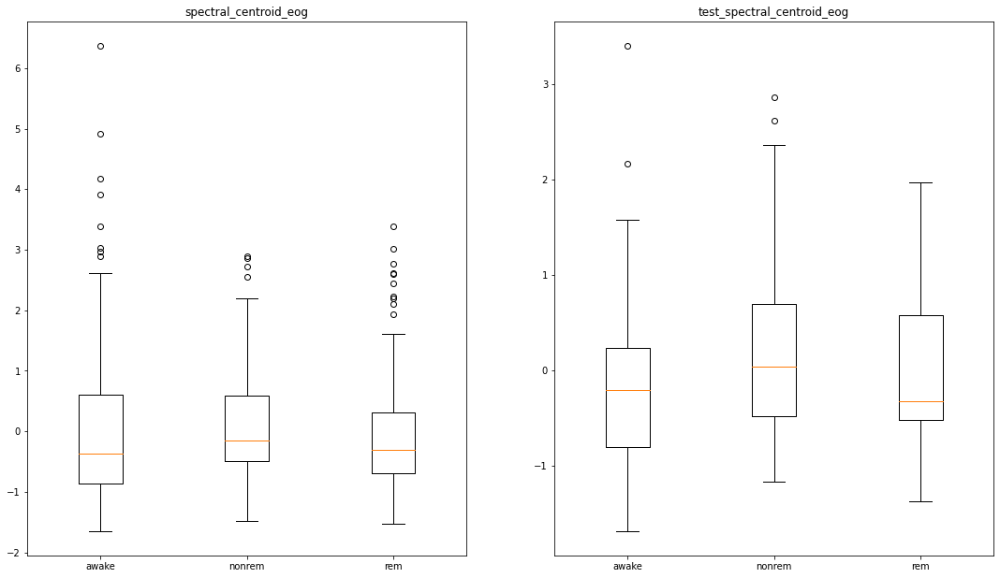

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


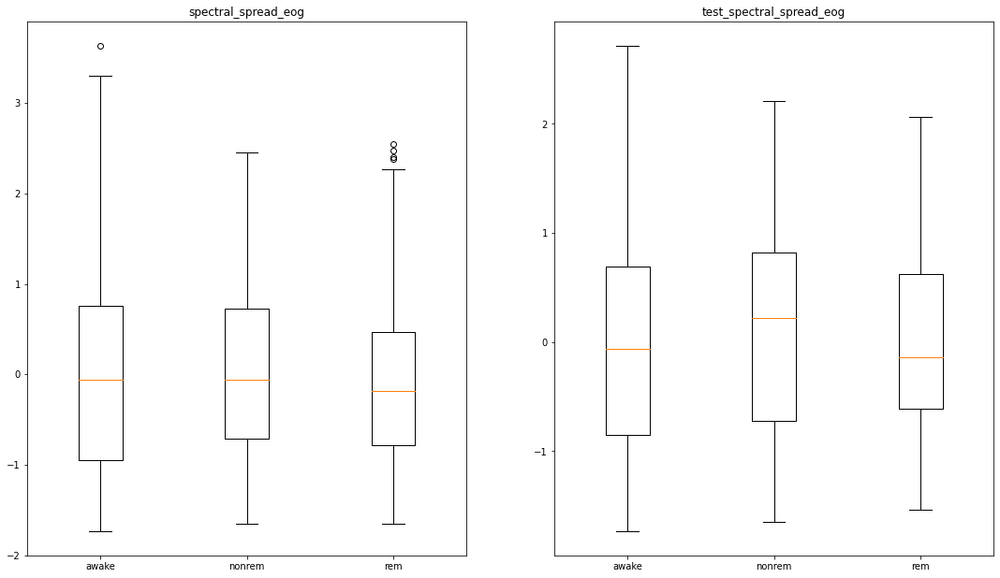

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


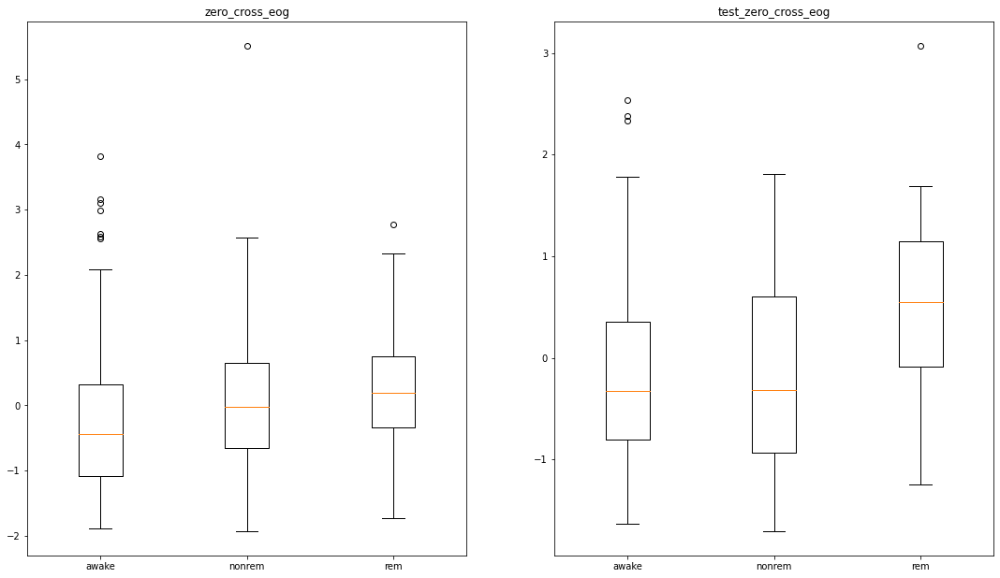

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


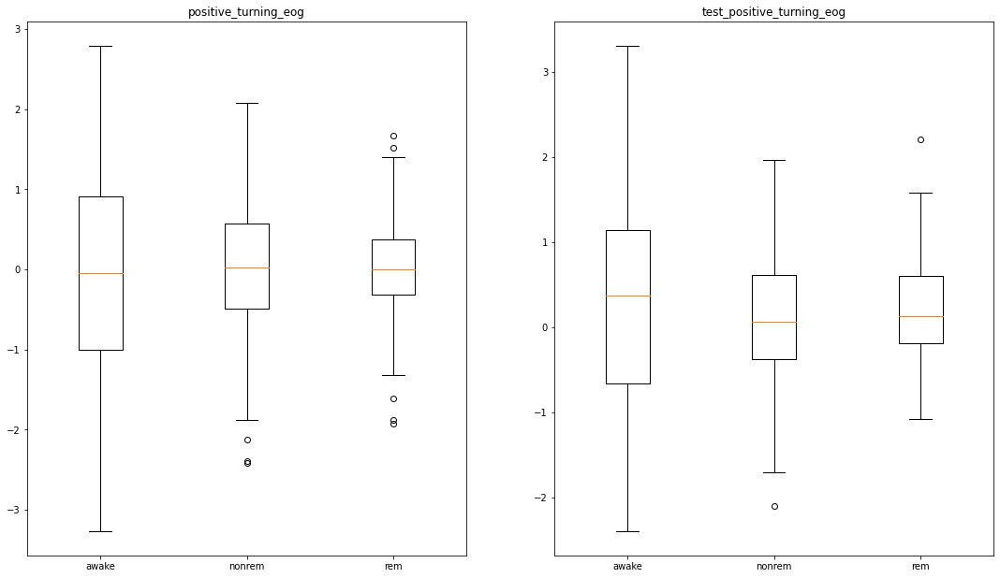

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


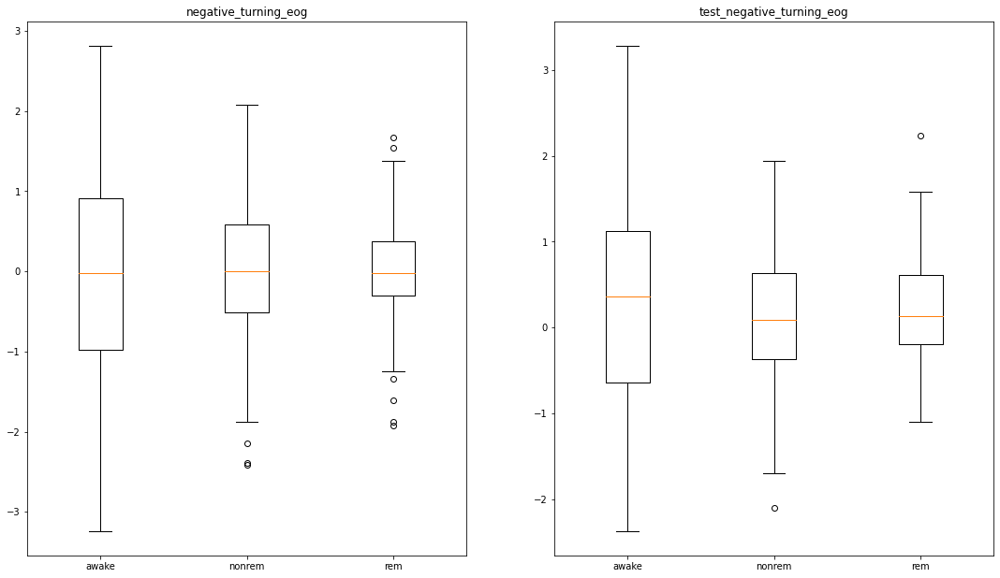

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


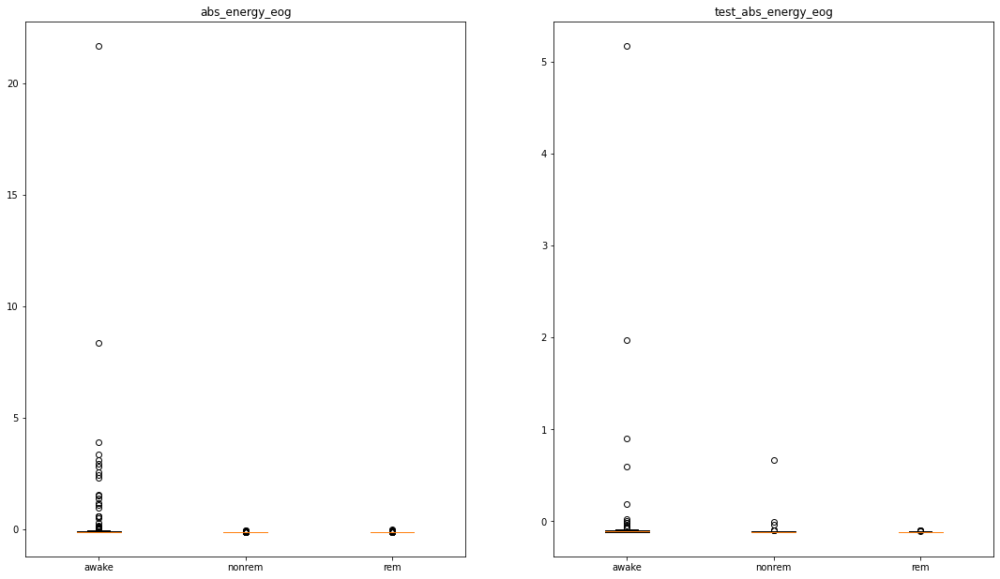

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


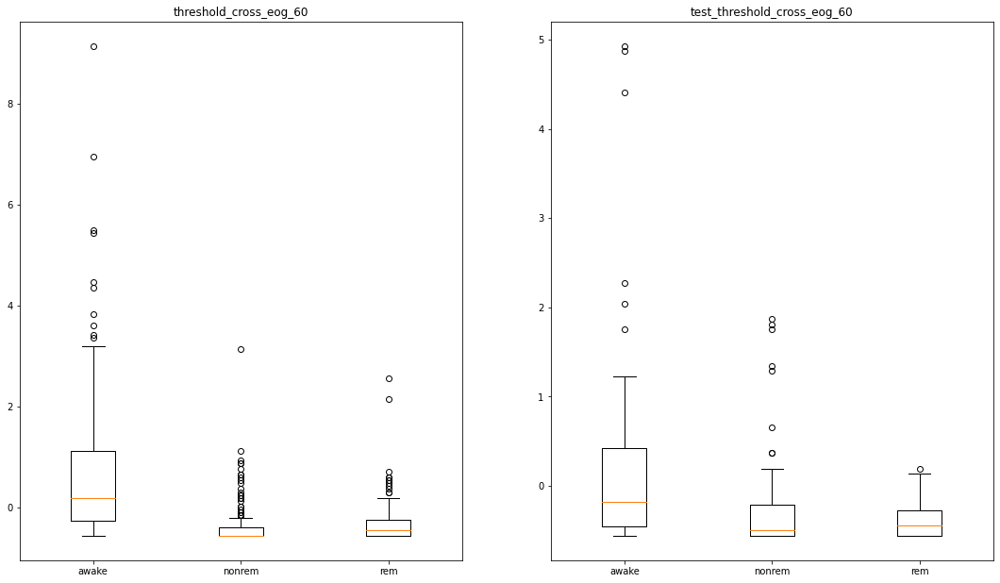

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


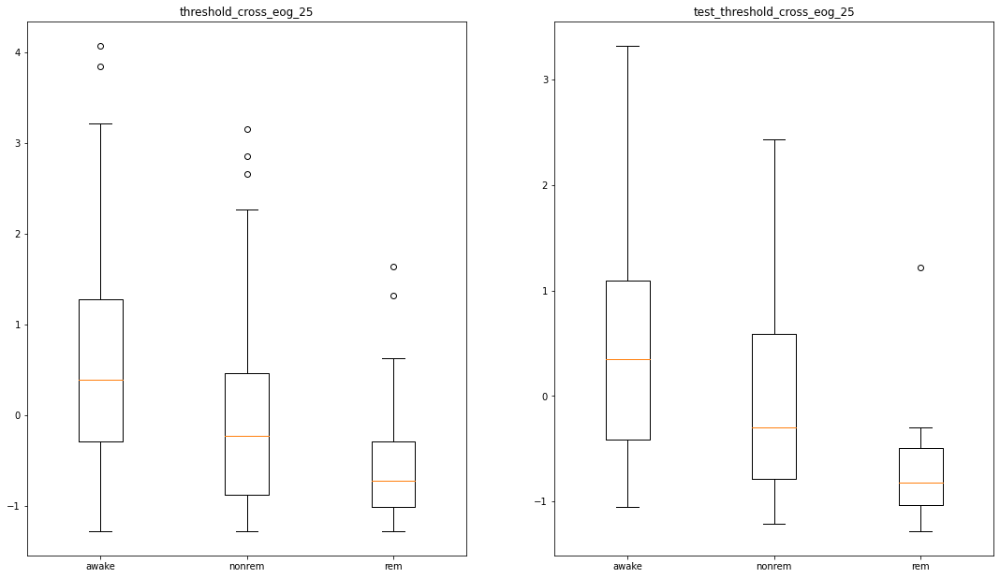

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


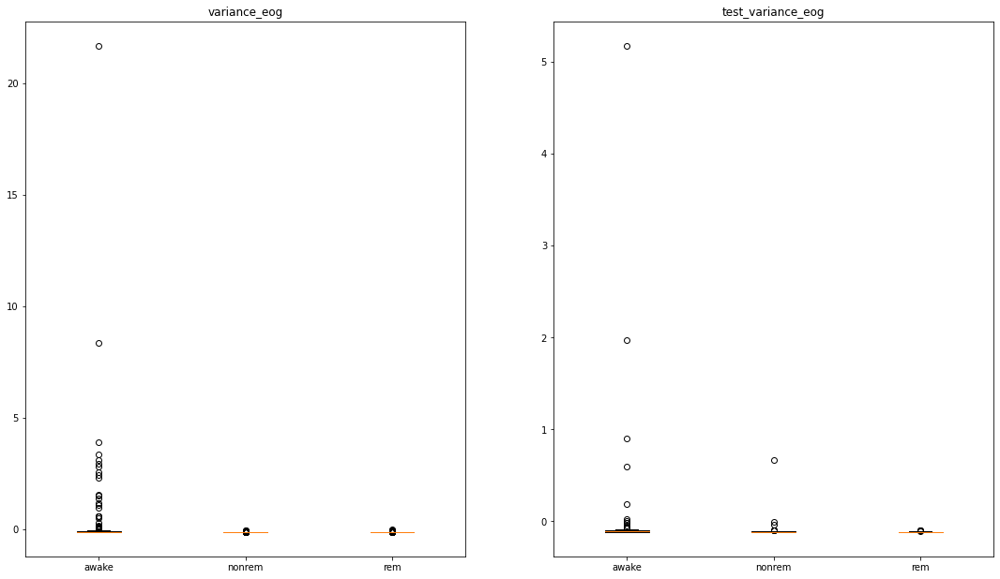

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


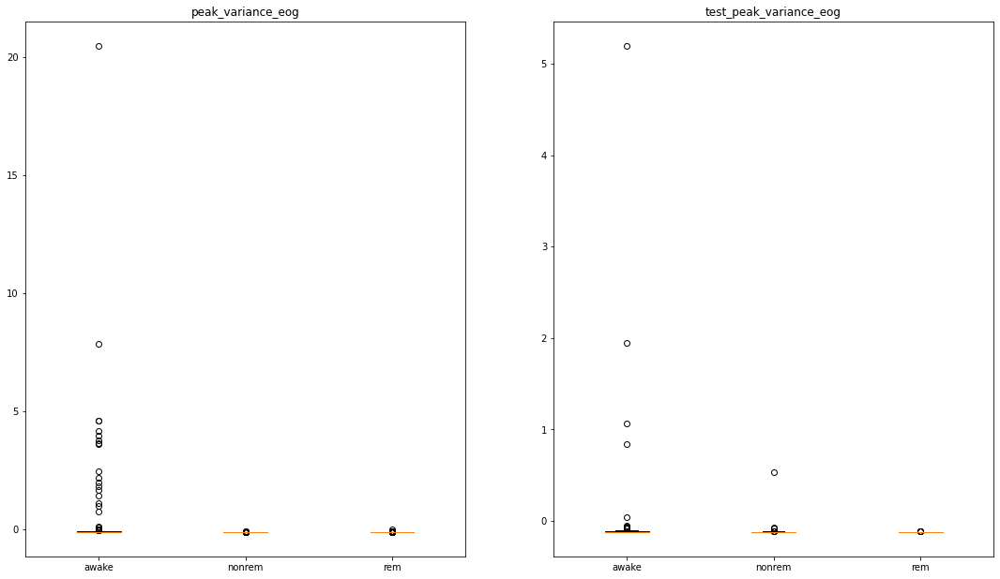

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


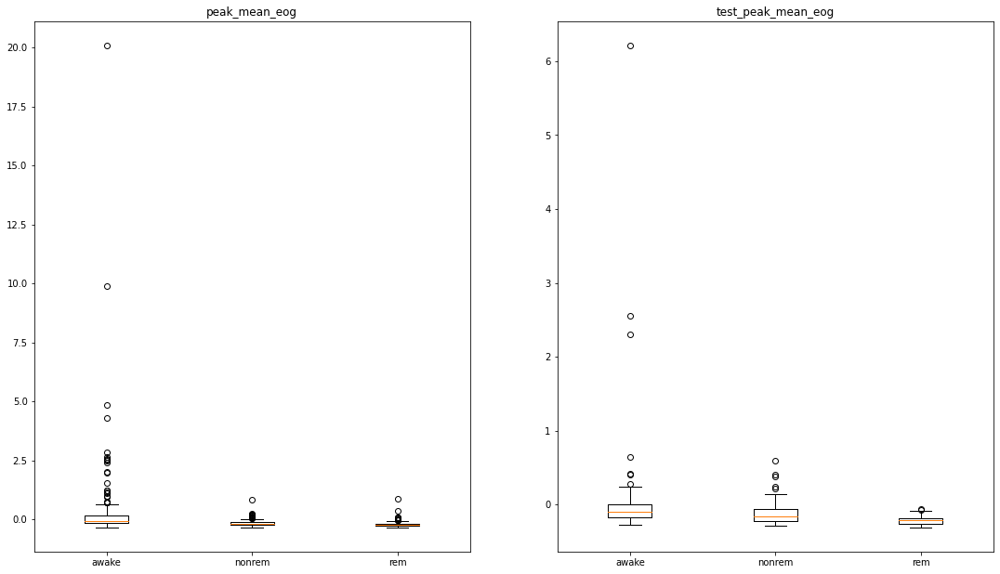

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


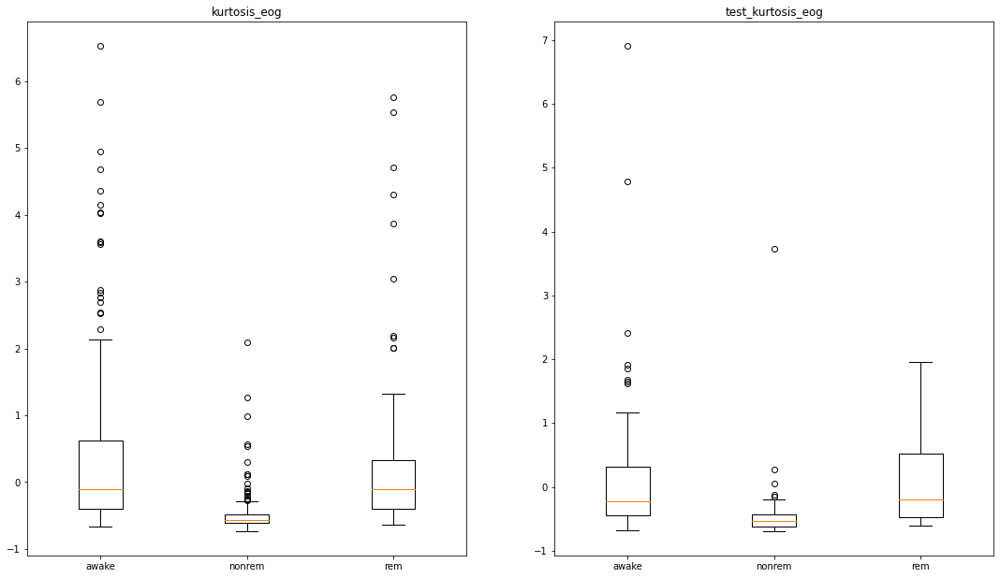

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


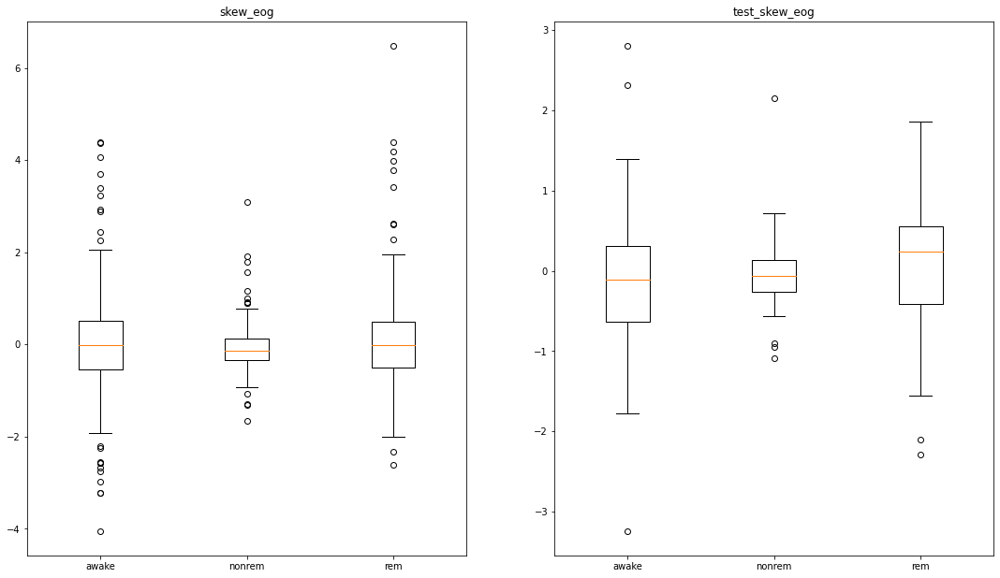

In [39]:
for feature in features:
  labels=std_data_set["labels"]
  labels_test=test_std_data_set["labels"]
  types=getTypes(labels)
  x_test=[]
  x=[]
  for typ in types:
      x_type=[]
      for i in range( len(labels)):
          if(labels[i]==typ):
              x_type.append(std_data_set[feature][i])
      x.append(x_type)

  for typ in types:
      x_type_test=[]
      for j in range(len(labels_test)):
          if(labels_test[j]==typ):
              x_type_test.append(test_std_data_set[feature][j])
      x_test.append(x_type_test)
  
  fig, (ax1, ax2) = plt.subplots(1, 2)
  fig.set_size_inches(18.5, 10.5)
  # Creating axes instance
  
  ax1.set_title(feature)
  ax2.set_title("test_"+feature)
  # Creating plot
  bp1 = ax1.boxplot(x)
  bp2 = ax2.boxplot(x_test)
  ax1.set_xticklabels(types)
  ax2.set_xticklabels(types)
  # show plot
  plt.show()

#Machine learning
Because of the nature of the problem that is classification we shall use K-nearest neighbour classifier.

In [40]:
#imports
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
import sklearn
import seaborn as sns
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.model_selection import LeaveOneOut
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.metrics import recall_score
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import precision_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn import preprocessing
from sklearn import tree
from sklearn.naive_bayes import GaussianNB
import time

In [41]:
def getSamplesAndLabels(data,variables,label):
    x=[]
    y=[]
    for row in range(len(data)):
        sample=[]
        for variable in variables:
            sample.append(data[variable][row])
        x.append(sample)
        y.append(data[label][row])
        
    return x,y

In [42]:
features=["rms_eog","variance_eog","peak_variance_eog","peak_mean_eog",
          "threshold_cross_eog_25","threshold_cross_eog_60","rms_emg",
          "variance_emg","peak_variance_emg","peak_mean_emg",
          "threshold_cross_emg_25","threshold_cross_emg_60","kurtosis_eog","kurtosis_emg"]
X,y=getSamplesAndLabels(std_data_set,features,"labels")

#print(x)
#print(y)
print(len(X)==len(y))

True


In [43]:
X_train, X_test, y_train, y_test = train_test_split( X, y, test_size=0.20, random_state=42, shuffle=True, stratify=y)

#KNN-classifier

accuracy:  0.6666666666666666


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


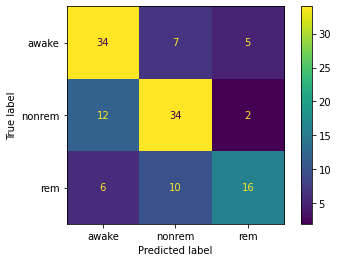

In [44]:
knn=KNeighborsClassifier(n_neighbors=7)
knn.fit(X_train,y_train)

plot_confusion_matrix(knn,X_test,y_test)
predictions = knn.predict(X_test)
corrects=0
for pred,true in zip(predictions,y_test):
    if(pred==true):
        corrects=corrects+1
print("accuracy: ",corrects/len(y_test))

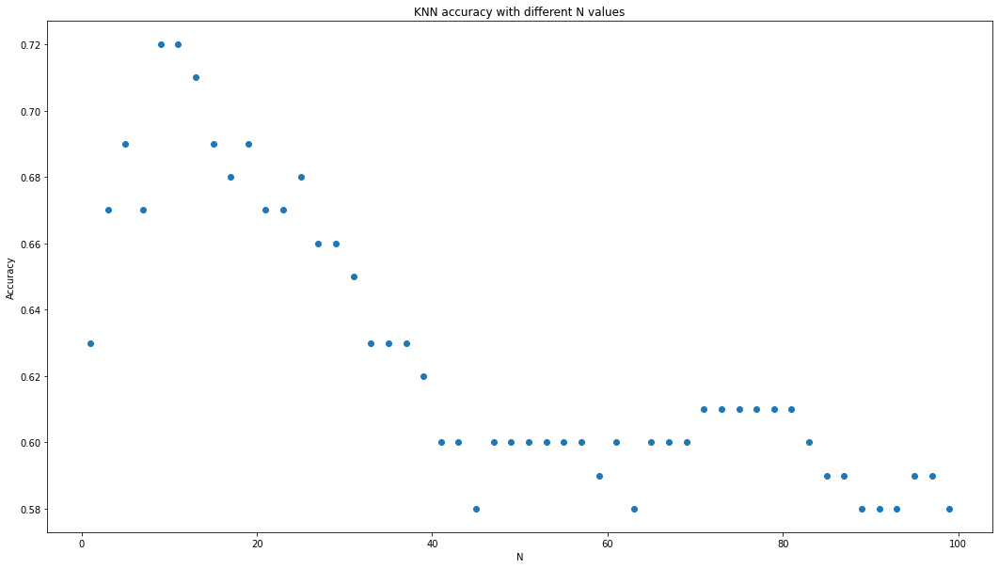

In [45]:
knn_accuracies=[]
x = range(1,100,2)
for i in x:
  knn=KNeighborsClassifier(n_neighbors=i)
  knn.fit(X_train,y_train)
  predictions = knn.predict(X_test)
  accuracy=np.round(accuracy_score(y_test, predictions),2)
  knn_accuracies.append(accuracy)

fig, axs = plt.subplots()
fig.set_size_inches(18, 10)
axs.set_title("KNN accuracy with different N values")
axs.scatter(x, knn_accuracies, color='C0')
axs.set_xlabel("N")
axs.set_ylabel("Accuracy")
plt.show()

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMa

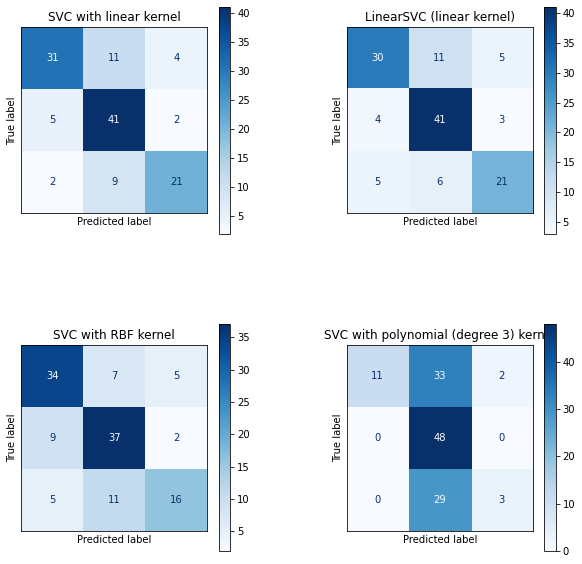

SVC with linear kernel accuracy: 0.74
LinearSVC (linear kernel) accuracy: 0.73
SVC with RBF kernel accuracy: 0.69
SVC with polynomial (degree 3) kernel accuracy: 0.49


In [46]:
C=1.0
svm_models = (
    sklearn.svm.SVC(kernel="linear", C=C),
    sklearn.svm.LinearSVC(C=C, max_iter=10000),
    sklearn.svm.SVC(kernel="rbf", gamma=0.7, C=C),
    sklearn.svm.SVC(kernel="poly", degree=3, gamma="auto", C=C),
)
svm_models = (clf.fit(X_train, y_train) for clf in svm_models)
titles = (
    "SVC with linear kernel",
    "LinearSVC (linear kernel)",
    "SVC with RBF kernel",
    "SVC with polynomial (degree 3) kernel",
)

# Set-up 2x2 grid for plotting.
fig, sub = plt.subplots(2, 2,figsize=(10,10))
plt.subplots_adjust(wspace=0.4, hspace=0.4)
accuracies = {}
for clf, title, ax in zip(svm_models, titles, sub.flatten()):
  plot_confusion_matrix(clf, X_test, y_test, ax=ax, cmap="Blues")
  ax.set_xticks(())
  ax.set_yticks(())
  ax.set_title(title)
  predictions_list=clf.predict(X_test)
  accuracies[title]= np.round(accuracy_score(y_test, predictions_list),2)
plt.show()
for key in accuracies.keys():
  print(key+" accuracy: "+str(accuracies[key]))

# Many machine learning models
* KNN
* Support vector classifier
* Decision tree
* Random forest
* Extra trees
* Naive Bayes

KNN
Training time:  0.0053942203521728516 seconds
Prediction time:  0.011375188827514648 seconds
Accuracy:  0.72


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


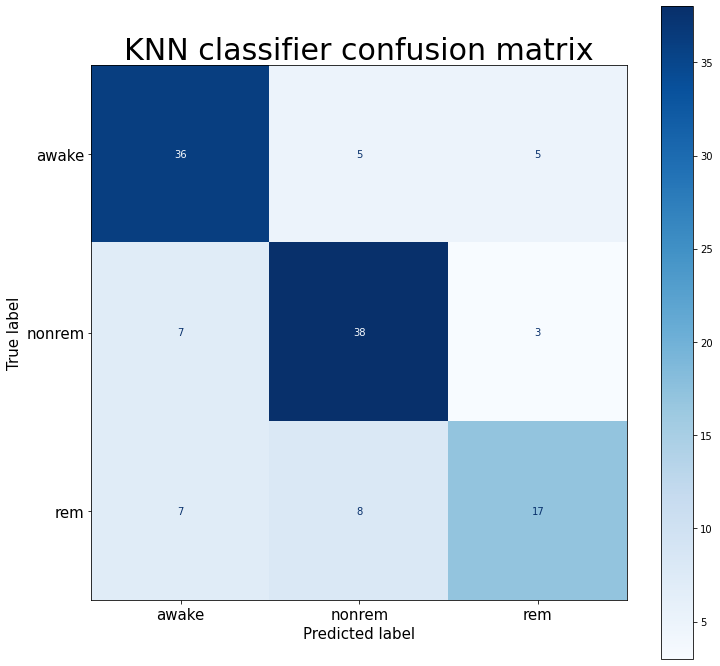

------------------------------
SVC
Training time:  0.5179510116577148 seconds
Prediction time:  0.0009644031524658203 seconds
Accuracy:  0.73


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


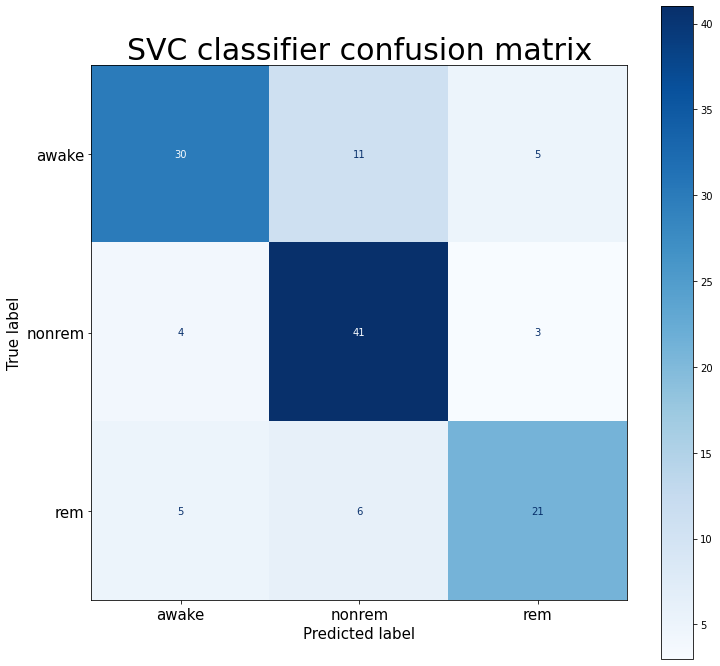

------------------------------
Decision tree
Training time:  0.01179361343383789 seconds
Prediction time:  0.0009765625 seconds
Accuracy:  0.68


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


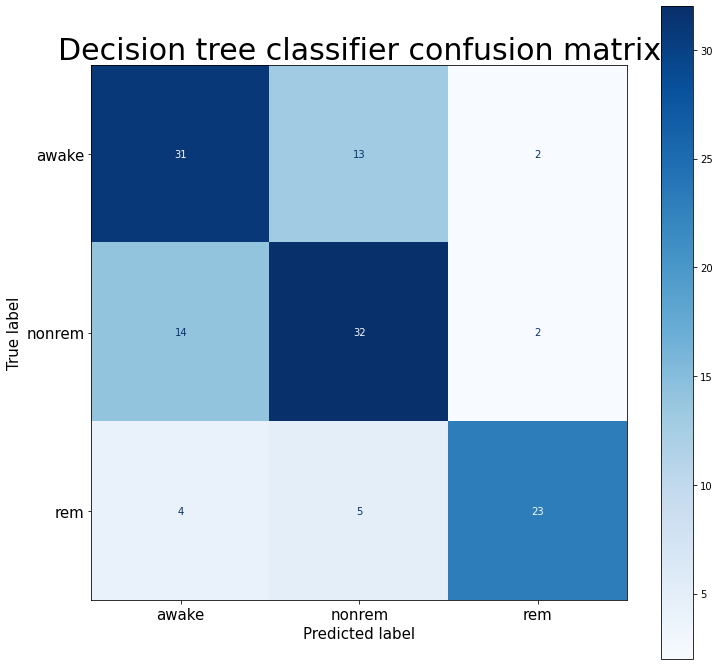

------------------------------
Random forest
Training time:  1.363300085067749 seconds
Prediction time:  0.06997489929199219 seconds
Accuracy:  0.79


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


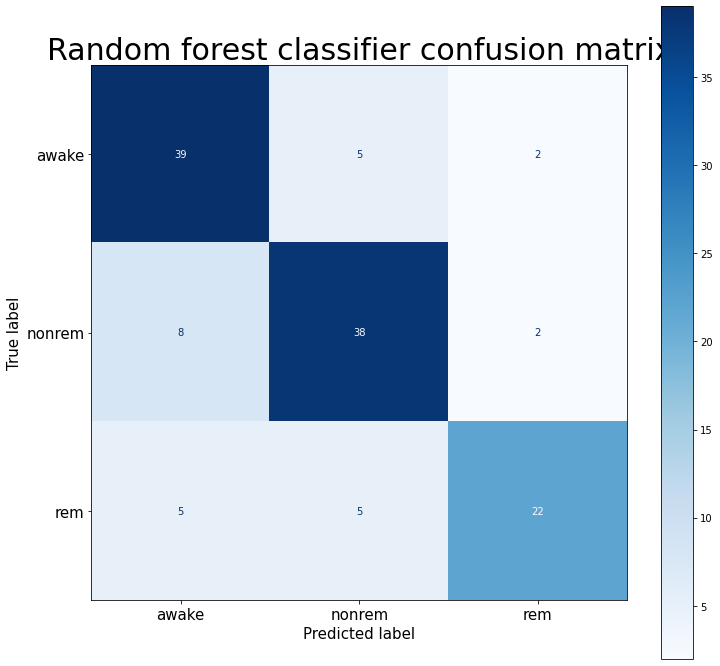

------------------------------
Extra trees
Training time:  1.2447340488433838 seconds
Prediction time:  0.22799301147460938 seconds
Accuracy:  0.76


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


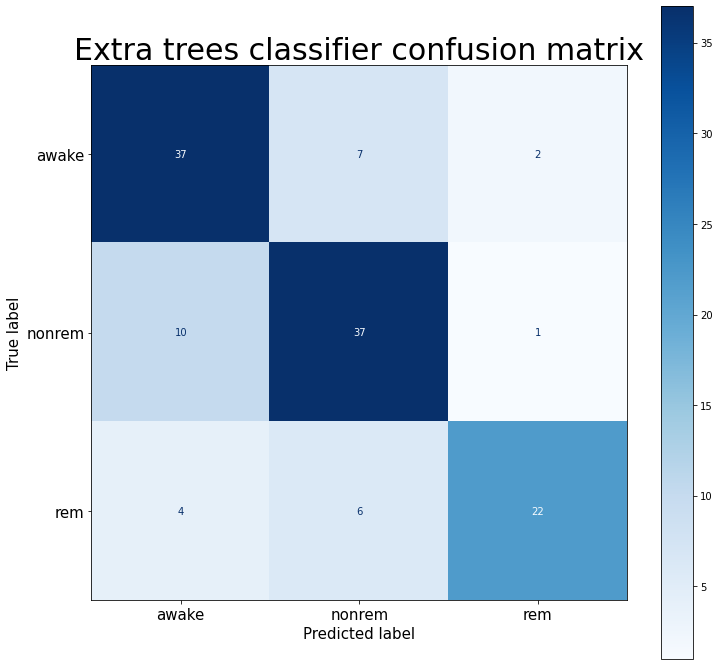

------------------------------
Naive bayes
Training time:  0.0047664642333984375 seconds
Prediction time:  0.0014536380767822266 seconds
Accuracy:  0.53


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


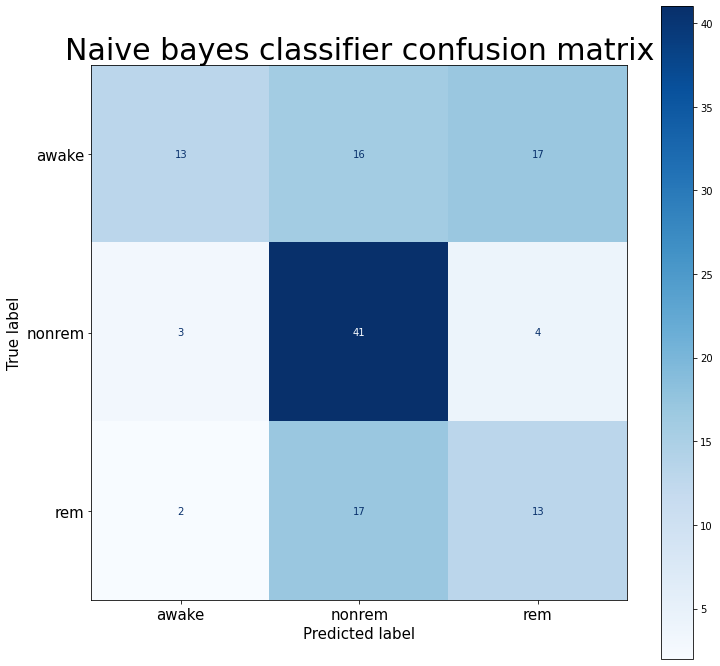

------------------------------
KNN accuracy: 0.72
SVC accuracy: 0.73
Decision tree accuracy: 0.68
Random forest accuracy: 0.79
Extra trees accuracy: 0.76
Naive bayes accuracy: 0.53


In [47]:
#hyperparameters
N=9




models = {"KNN":KNeighborsClassifier(n_neighbors=N),"SVC":sklearn.svm.LinearSVC(C=C, max_iter=10000),
          "Decision tree":tree.DecisionTreeClassifier(),"Random forest": RandomForestClassifier(n_estimators = 500),
          "Extra trees":ExtraTreesClassifier(n_estimators = 500),"Naive bayes":GaussianNB()}
predictions ={}
accuracies = {}
for key in models.keys():
  start=time.time()
  # Constructing the model
  models[key].fit(X_train, y_train)
  print(key)
  end=time.time()
  print("Training time: ",end-start,"seconds")
  start=time.time()
  predictions[key] = models[key].predict(X_test)
  end=time.time()
  print("Prediction time: ",end-start,"seconds")
  accuracy = np.round(accuracy_score(y_test, predictions[key]),2)
  accuracies[key]=accuracy
  print("Accuracy: ", accuracy)
  fig, ax = plt.subplots(figsize=(12, 12))
  ax.set_title(key+" classifier confusion matrix", fontsize=30)
  plot_confusion_matrix(models[key], X_test, y_test, ax=ax, cmap="Blues")
  ax.xaxis.set_ticklabels(['awake','nonrem',"rem"],fontsize=15)
  ax.yaxis.set_ticklabels(['awake','nonrem',"rem"],fontsize=15)
  ax.set_xlabel("Predicted label",fontsize=15)
  ax.set_ylabel("True label",fontsize=15)
  plt.show()
  print("------------------------------")
for key in accuracies.keys():
  print(key+" accuracy: "+str(accuracies[key]))

#Performance on the actual test data

KNN
Training time:  0.005640506744384766 seconds
Prediction time:  0.013949155807495117 seconds
Accuracy:  0.67


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


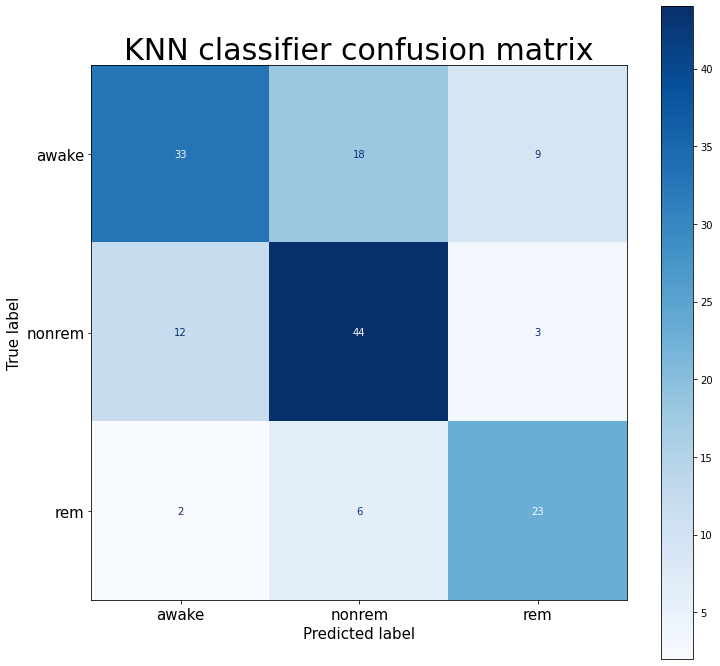

------------------------------------------
SVC
Training time:  0.03813505172729492 seconds
Prediction time:  0.004488229751586914 seconds
Accuracy:  0.66


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


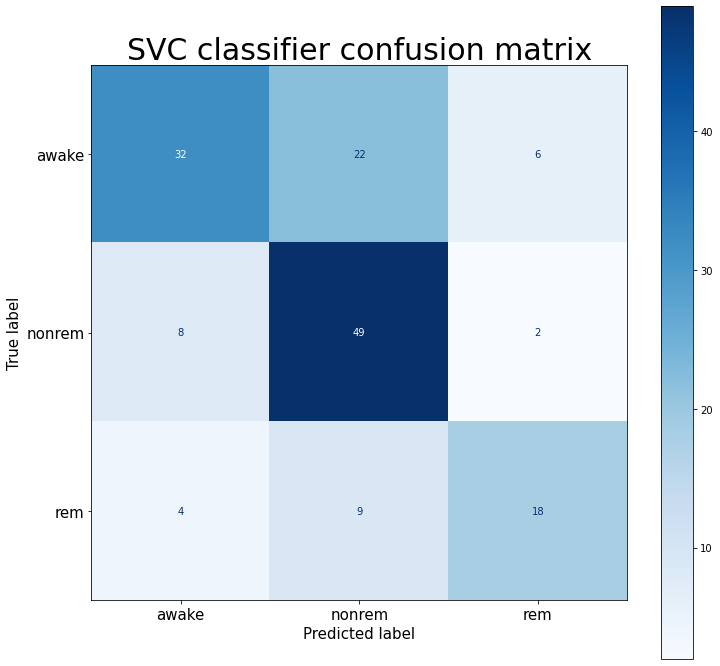

------------------------------------------
Decision tree
Training time:  0.015894412994384766 seconds
Prediction time:  0.0009624958038330078 seconds
Accuracy:  0.65


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


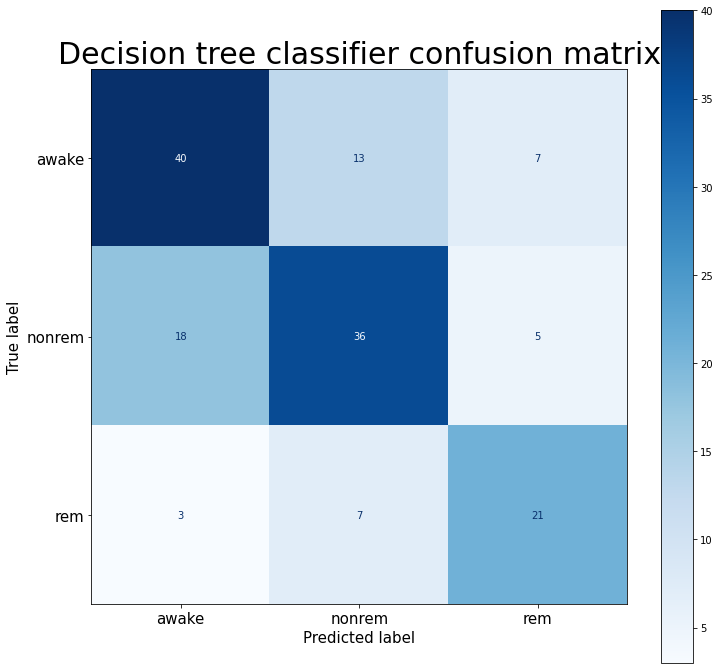

------------------------------------------
Random forest
Training time:  2.170949935913086 seconds
Prediction time:  0.15248894691467285 seconds
Accuracy:  0.72


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


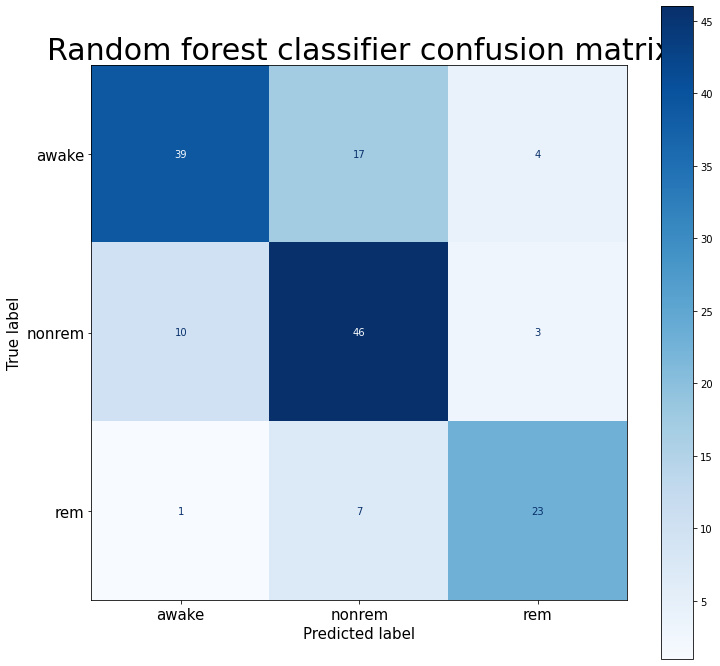

------------------------------------------
Extra trees
Training time:  1.300102949142456 seconds
Prediction time:  0.07229495048522949 seconds
Accuracy:  0.75


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


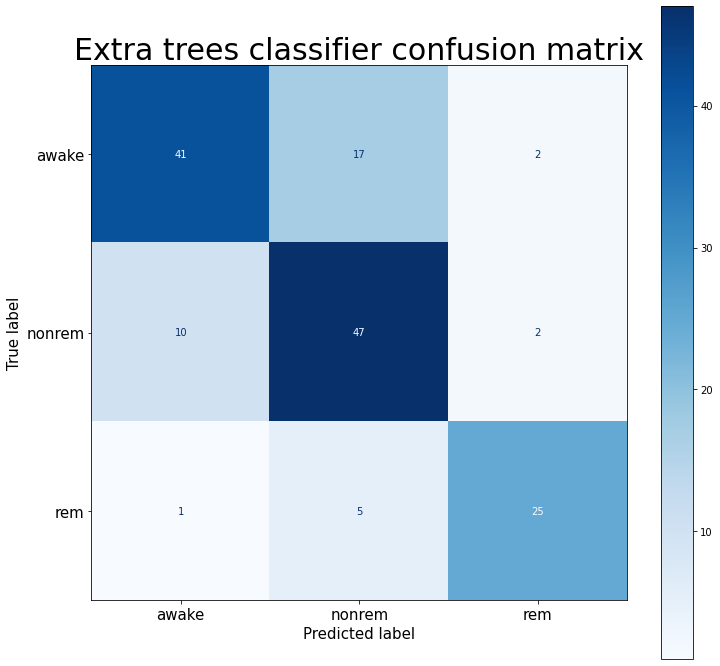

------------------------------------------
Naive bayes
Training time:  0.009417057037353516 seconds
Prediction time:  0.0011577606201171875 seconds
Accuracy:  0.51


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


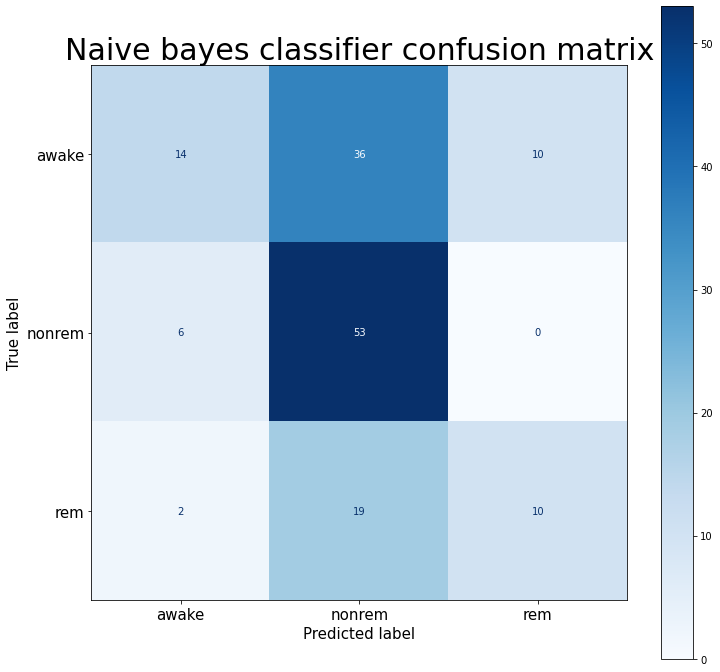

------------------------------------------
KNN accuracy: 0.67
SVC accuracy: 0.66
Decision tree accuracy: 0.65
Random forest accuracy: 0.72
Extra trees accuracy: 0.75
Naive bayes accuracy: 0.51


In [48]:
X_test2,y_test2=getSamplesAndLabels(test_std_data_set,features,"labels")
#print(len(y_test2))
models = {"KNN":KNeighborsClassifier(n_neighbors=N),"SVC":sklearn.svm.SVC(kernel='linear'),
          "Decision tree":tree.DecisionTreeClassifier(),"Random forest": RandomForestClassifier(n_estimators = 500),
          "Extra trees":ExtraTreesClassifier(n_estimators = 500),"Naive bayes":GaussianNB()}
predictions ={}
accuracies = {}
for key in models.keys():
  start=time.time()
  # Constructing the model
  models[key].fit(X, y)
  print(key)
  end=time.time()
  print("Training time: ",end-start,"seconds")
  start=time.time()
  predictions[key] = models[key].predict(X_test2)
  end=time.time()
  print("Prediction time: ",end-start,"seconds")
  accuracy = np.round(accuracy_score(y_test2, predictions[key]),2)
  accuracies[key]=accuracy
  print("Accuracy: ", accuracy)
  fig, ax = plt.subplots(figsize=(12, 12))
  ax.set_title(key+" classifier confusion matrix", fontsize=30)
  plot_confusion_matrix(models[key], X_test2, y_test2, ax=ax, cmap="Blues")
  ax.xaxis.set_ticklabels(['awake','nonrem',"rem"],fontsize=15)
  ax.yaxis.set_ticklabels(['awake','nonrem',"rem"],fontsize=15)
  ax.set_xlabel("Predicted label",fontsize=15)
  ax.set_ylabel("True label",fontsize=15)
  plt.show()
  print("------------------------------------------")
for key in accuracies.keys():
  print(key+" accuracy: "+str(accuracies[key]))